# This notebook is to perform experiments with various hyperparameter configurations

## tl;dr 

You can ignore this if you really want to since the default hyperparameters will be the optimal ones (they are set using these experiments).

Read the method section below to understand how the insights were obtained.

Note: normalisation is transforming the features to be in [0, 1] and the sum == 1. Scaling is transforming it into N(0, 1). We do normalisation not scaling but some experiments were conducted and showed they have the same impact on performance (so we can technically use either but normalisation makes more sense since scaling assumes the feature is normally distributed).

### Max Pooler

Redundant for now, AdaptiveMaxPooler will vary the hyperparameters per function/channel.

- normalising : MaxPooler is neither gradient based nor uses distance metrics; therefore, it makes no difference if it is normalised or not.
- bin_sz : A global value for bin_sz assumes that all clusters will fit into this bin size. However, this is rarely true, so an improved version of Max Pooler will be built that adaptively shrinks/increases the bin_sz based off the local structure within the feature space. For now, keep it as.
- threshold : again this will be redundant once the better max pooler comes out. For now, we can keep it as 5. 

### GMM

GMM conducts a search for the optimal # of Gaussians for each function/channel. AIC/BIC, init_params, max_iter, and n_init can be kept constant across functions.

- normalising : Don't normalise. normalising leads to a massive reduction in the # of spikes. It is equivalent to just max pooling over all spikes.
- AIC vs BIC (grid-search metric) : BIC is preferred. AIC and BIC typically agree on the optimal model but BIC penalises overfitting more heavily than AIC. Hence, it will keep the # of clusters on the low side. Therefore, it is better for explanatory models, such as this one.
- max_gaussians : keep max_gaussians < 6, default = 4. GMM can trivially maximise -loglikelihood by simplying placing a cluster at each spike. We want to avoid this case by keeping the # of clusters to a minimum.
- init_params : kmeans is optimal. kmeans and k-means++ are the best out of all but kmeans occasionally fares better.
- max_iter : higher max_iter = {500, 1000} is preferred. There are two cases: GMM doesn't converge or it does. If it does converge, then increasing max_iter makes no difference apart from longer time. If it hasn't converged, then it enables it to converge. So, the only cost is time.
- n_init : higher n_init = 7 is preferred. GMM has no guarentees as to whether it will converge to the globally optimal configuration or locally optimal. Hence, by performing more runs, we can pick the best out of n. The only cost is increased time.

### DBSCAN

DBSCAN hyperparameter could be automated

- normalisation : doesn't help, so use unnormalised. Same as GMM. There is deeper analysis in the normalisation section of DBSCAN of why unnormalised fares better than normalised.
- use 4-dist method outlined in paper : Don't use. Using the 4-dist method involves plotting the sorted 4-dist graph and looking for the thinnest cluster via visual inspection. Results show that using the 4-dist method is equivalent to normalising, perhaps due to the difference in scale in dimensions.
- eps = 10 works well for all types of graphs. The motivation behind this is that it checks 5 ms forward and back.
- min_samples = 2 is optimal. It removes any lonely spikes.

### Mean Shift

- normalise = False is better. Same as DBSCAN and GMM
- min_bin_freq = Mean shift appears to be indifferent to the choice of min_bin_freq (even with a different bandwidth kernel).
- Bandwidth = 30. A higher bandwidth leads to fewer spikes and cleaner graphs. 

### Method

Pick 3 prototypical examples of the 3 common cases: uniform distribution with sparse spikes (TVL loudness (short-term)), multiple peaks (TVL loudness chan 2 (instantaneous)), and heavy blurring (Heeger horizontal ME GP2). 

Examine how each important hyperparameter influences the performance on these three examples. Conduct an analysis to find the optimal set. In an ideal world, we would run a grid-search with sets of hyperparameters, as one hyperparameter can influence the other hyperparameters. However, a grid-search scales exponentially in # of hyperparameters and # of hyperparameter options to try; hence, to keep this tractable, other hyperparameters are kept fixed and one is tuned at a time.

How to interpret the graphs below: the top half shows the noisy time-series and the bottom half shows the denoised time-series. We can then compare performance.

In [1]:
from kymata.datasets.sample import KymataMirror2023Q3Dataset
from kymata.entities.expression import HexelExpressionSet
from kymata.ippm.data_tools import stem_plot, build_hexel_dict_from_expression_set, convert_to_power10
from kymata.ippm.denoising_strategies import DBSCAN, DenoisingStrategy, MaxPooler, CustomGMM, MeanShift


from sklearn.metrics.pairwise import euclidean_distances
from sklearn.preprocessing import normalize
import pandas as pd
import matplotlib.pyplot as plt
from copy import deepcopy

def remove_excess_funcs(to_retain, hexels):
    funcs = list(hexels.keys())
    for func in funcs:
        if func not in to_retain:
            # delete
            hexels.pop(func)
    return hexels

def plot_4_dist(pairings, normalising = True):
    # remove any insignificant ones!
    alpha = DenoisingStrategy()._estimate_alpha()
    X = pd.DataFrame(columns=['Latency', 'Mag'])
    for latency, spike in pairings:
        if spike <= alpha:
            X.loc[len(X)] = [latency, spike]
    if normalising:
        X = normalize(X)
    print(X)
    distance_M = euclidean_distances(X) # rows are points, columns are other points same order with values as distances
    k_dists = []
    for r in range(len(distance_M)):
        sorted_dists = sorted(distance_M[r], reverse=True) # descending order
        k_dists.append(sorted_dists[3]) # store 4-dist
    sorted_k_dists = sorted(k_dists, reverse=True)
    plt.plot(list(range(0, len(sorted_k_dists))), sorted_k_dists)
    plt.show()

def copy_hemisphere(hexels_to, hexels_from, hemi_to, hemi_from, func: str = None):
    if func:
        # copy only one function
        if hemi_to == 'rightHemisphere' and hemi_from == 'rightHemisphere':
            hexels_to[func].right_best_pairings = hexels_from[func].right_best_pairings
        elif hemi_to == 'rightHemisphere' and hemi_from == 'leftHemisphere':
            hexels_to[func].right_best_pairings = hexels_from[func].left_best_pairings
        elif hemi_to == 'leftHemisphere' and hemi_from == 'rightHemisphere':
            hexels_to[func].left_best_pairings = hexels_from[func].right_best_pairings
        else:
            hexels_to[func].left_best_pairings = hexels_from[func].left_best_pairings
        return
        
    for func, hexel in hexels_from.items():
        if hemi_to == 'rightHemisphere' and hemi_from == 'rightHemisphere':
            hexels_to[func].right_best_pairings = hexels_from[func].right_best_pairings
        elif hemi_to == 'rightHemisphere' and hemi_from == 'leftHemisphere':
            hexels_to[func].right_best_pairings = hexels_from[func].left_best_pairings
        elif hemi_to == 'leftHemisphere' and hemi_from == 'rightHemisphere':
            hexels_to[func].left_best_pairings = hexels_from[func].right_best_pairings
        else:
            hexels_to[func].left_best_pairings = hexels_from[func].left_best_pairings

def plot_denoised_vs_noisy(hexels, clusterer, title):
    denoised_hexels = clusterer.cluster(hexels, 'rightHemisphere')
    copy_hemisphere(denoised_hexels, hexels, 'leftHemisphere', 'rightHemisphere')
    stem_plot(denoised_hexels, title)

In [2]:
expression_set: HexelExpressionSet = KymataMirror2023Q3Dataset().to_expressionset()
hexels = build_hexel_dict_from_expression_set(expression_set)
hexels = convert_to_power10(hexels)
loudness_short = ['TVL loudness (short-term)']
loudness_chan2 = ['TVL loudness chan 2 (instantaneous)']
heeger = ['Heeger horizontal ME GP2']
ls_hexels = remove_excess_funcs(loudness_short, deepcopy(hexels))
lc2_hexels = remove_excess_funcs(loudness_chan2, deepcopy(hexels))
h_hexels = remove_excess_funcs(heeger, deepcopy(hexels))

Data root set at /Users/lakrani/Desktop/kymata/kymata-toolbox/kymata-toolbox-data.
Consider setting this as environmental variable KYMATA_DATA_ROOT to ensure it's reused next time.
Hint: $> KYMATA_DATA_ROOT="/Users/lakrani/Desktop/kymata/kymata-toolbox/kymata-toolbox-data"
Local file already exists: /Users/lakrani/Desktop/kymata/kymata-toolbox/kymata-toolbox-data/kymata_mirror_Q3_2023/kymata_mirror_Q3_2023_expression_endtable.nkg


/Users/lakrani/Desktop/kymata/kymata-toolbox/kymata/io/nkg.py:134: UserWarning: This file uses an old format. Please consider re-saving the data to avoid future incompatibility.
  warn("This file uses an old format. Please consider re-saving the data to avoid future incompatibility.")


## Max Pooling

In [3]:
def plot_bin_sz(sizes, hexels):
    for size in sizes:
        temp_hexels = deepcopy(hexels)
        clusterer = MaxPooler(bin_sz=size)
        plot_denoised_vs_noisy(temp_hexels, clusterer, f'bin_sz={size}')

def plot_threshold(thresholds, hexels):
    for threshold in thresholds:
        temp_hexels = deepcopy(hexels)
        clusterer = MaxPooler(threshold=threshold)
        plot_denoised_vs_noisy(temp_hexels, clusterer, f'threshold={threshold}')

### Bin Size

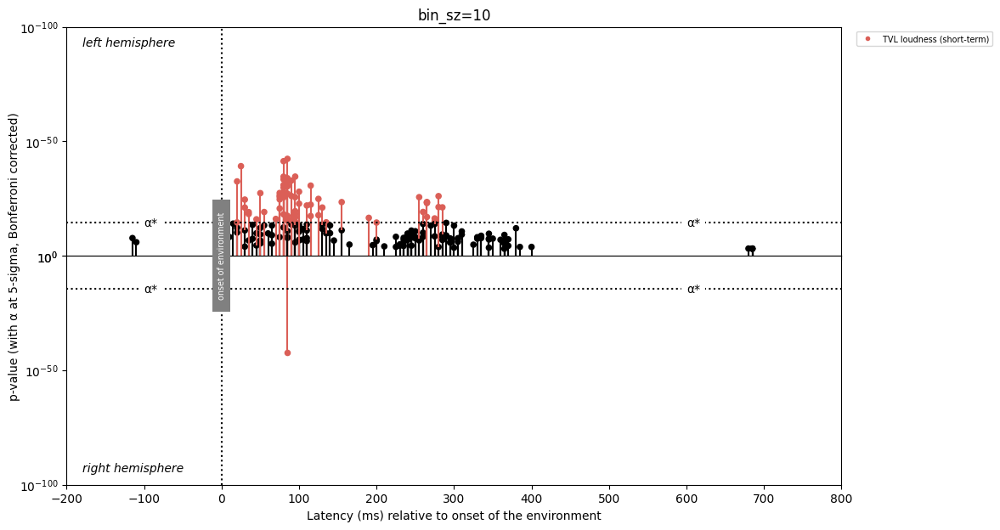

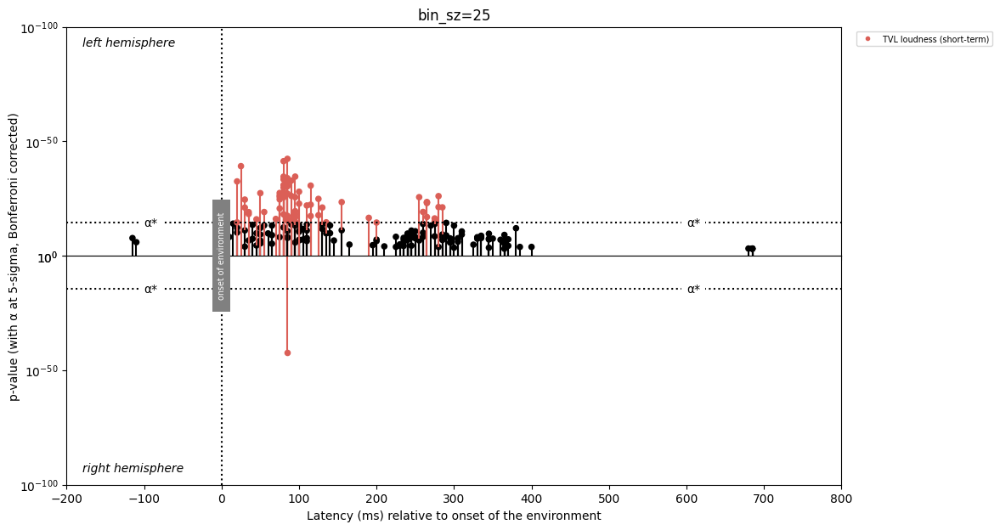

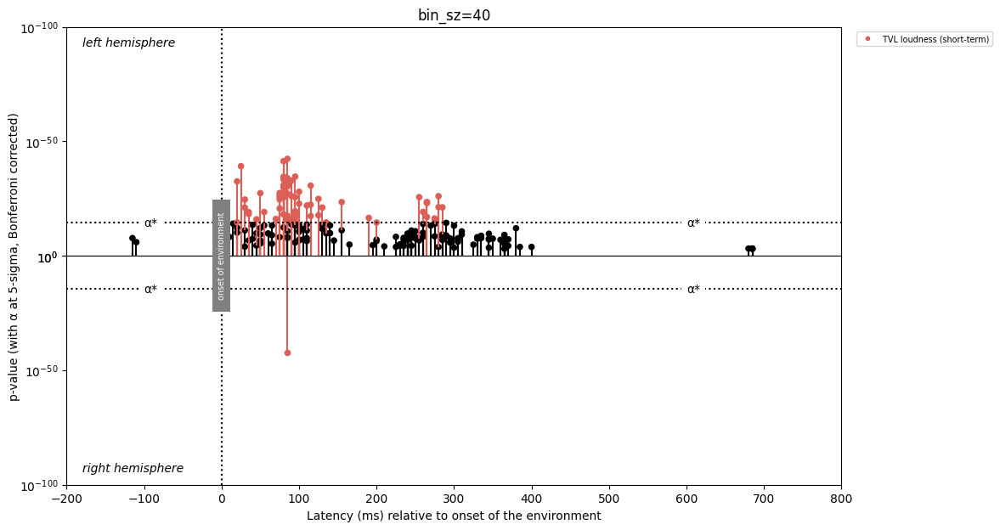

In [4]:
# TVL loudness (short-term) default bin size

plot_bin_sz([10, 25, 40], ls_hexels) 

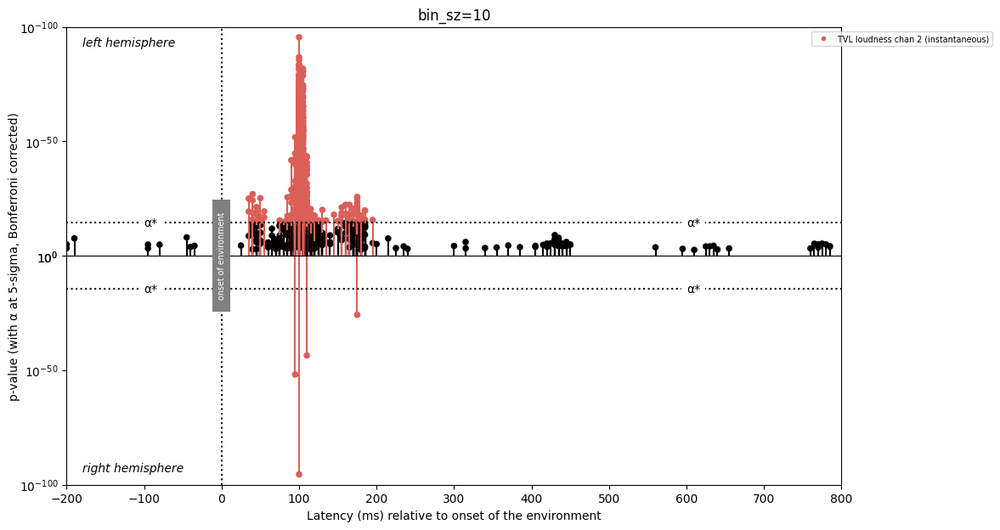

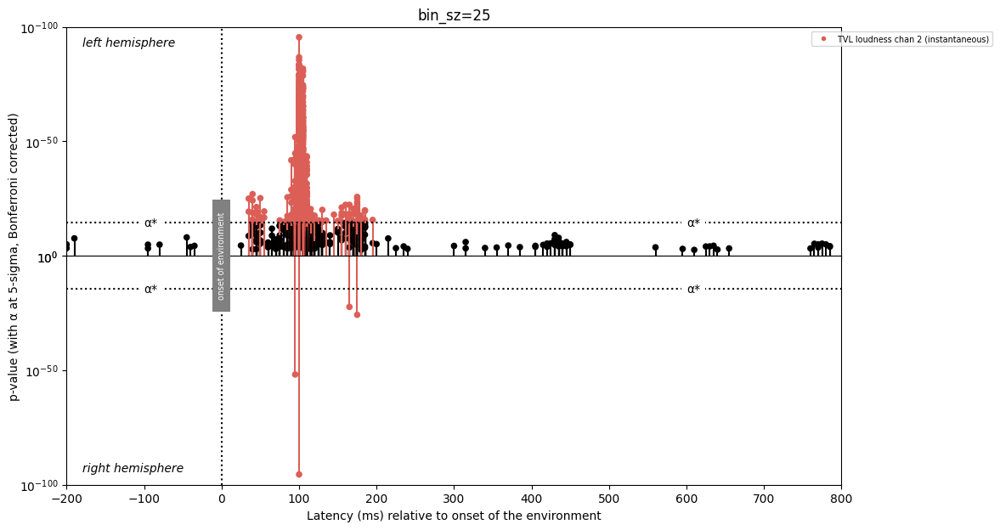

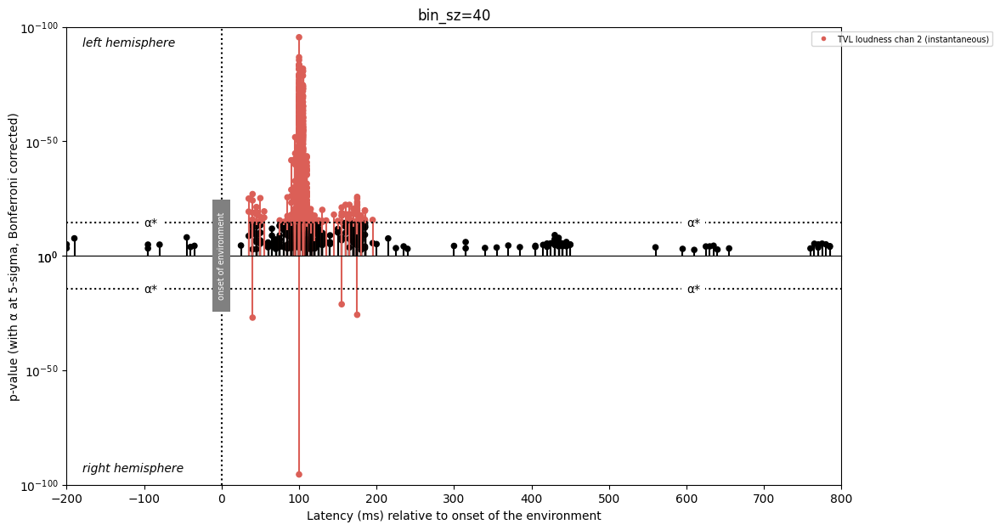

In [5]:
# default bin size Chan 2

plot_bin_sz([10, 25, 40], lc2_hexels) 

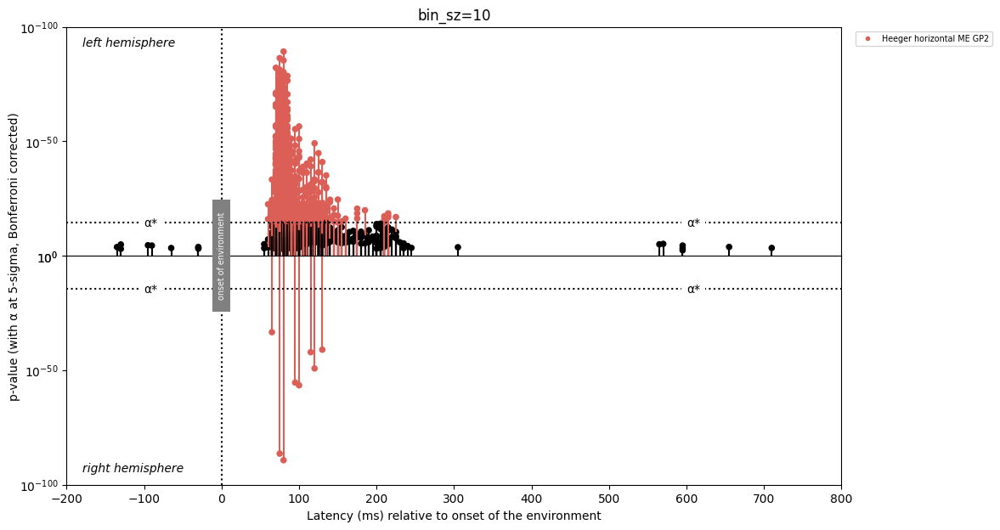

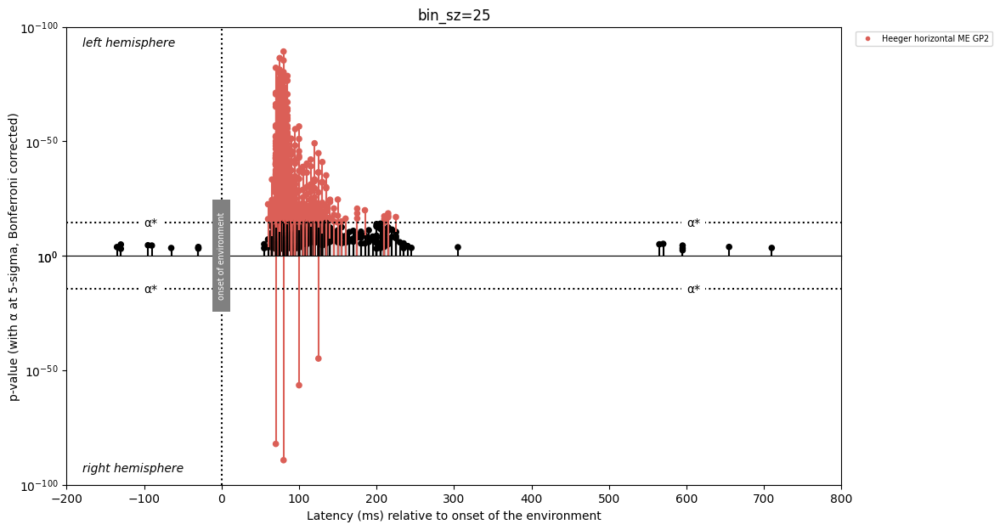

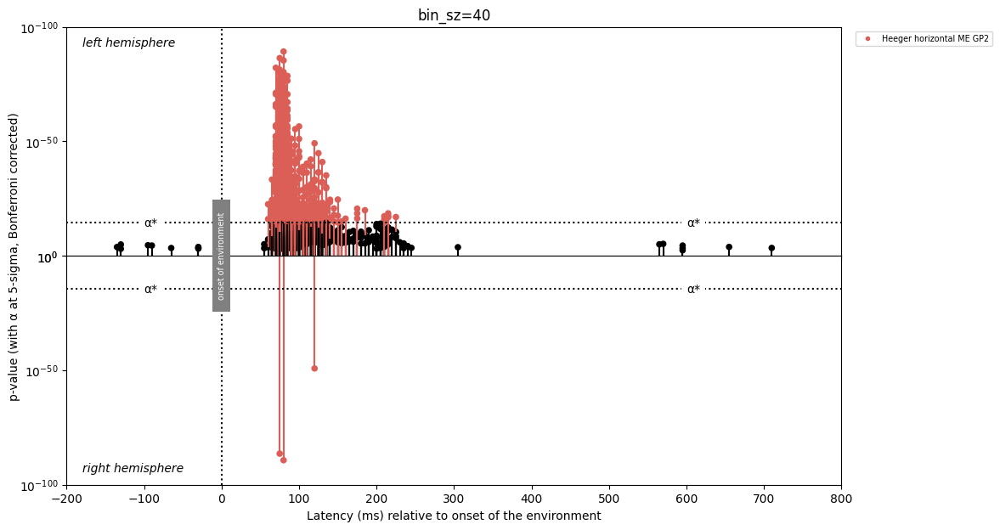

In [6]:
# default bin size Heeger
plot_bin_sz([10, 25, 40], h_hexels) 

### Analysis 

We can clearly see that the issue with max pooling is the edge case where a cluster is spread over multiple bins, leading to a large quantity of denoised hexels spaced together. To alleviate this issue, we can either run another clustering algorithm on the output of the max pooler to enjoin adjacent spikes, or (IDEA!) adaptively increase the bin size using information about the local structure (ie, move from global bin size to variable local bin size).

Algorithm 1 for adaptive bin size:
Look ahead front and back to check for significance. If so, we can incorporate those bins into the current one! It is now non-parametric 

### Threshold

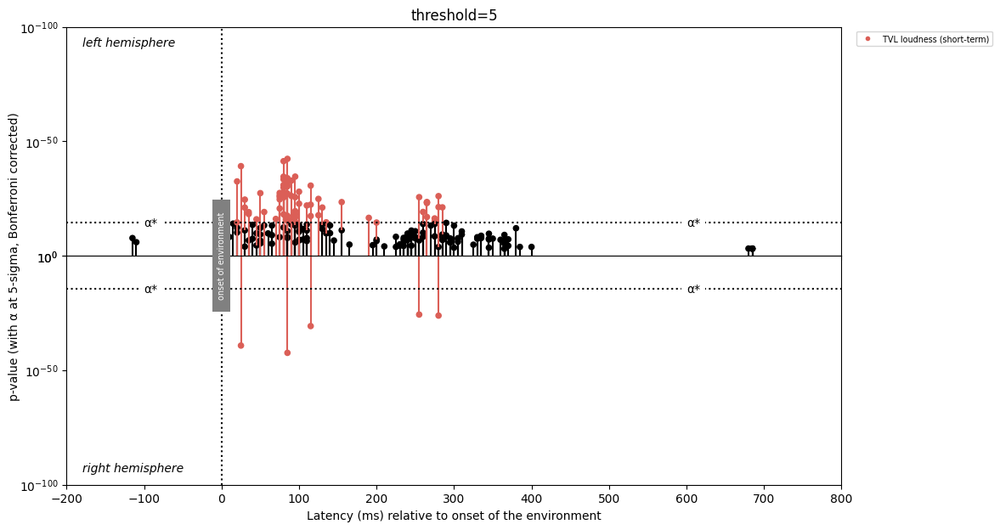

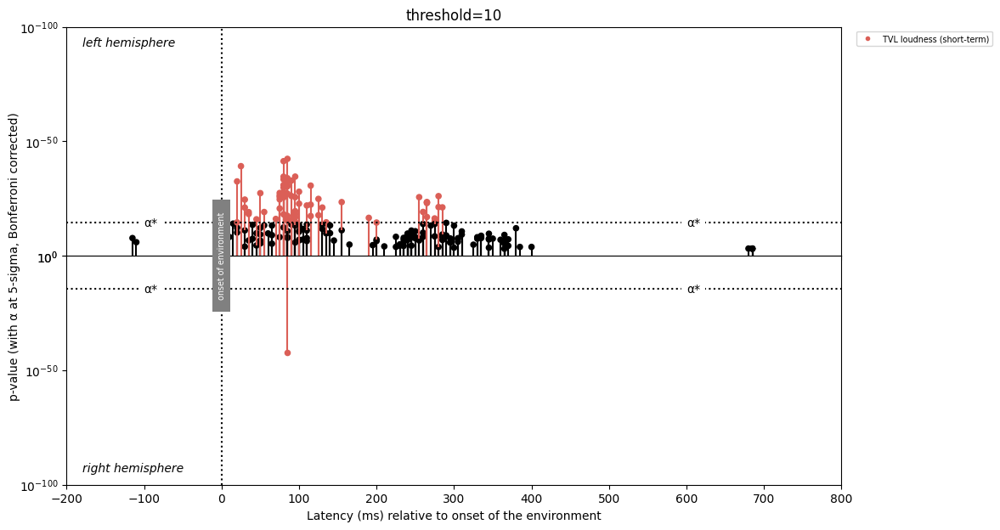

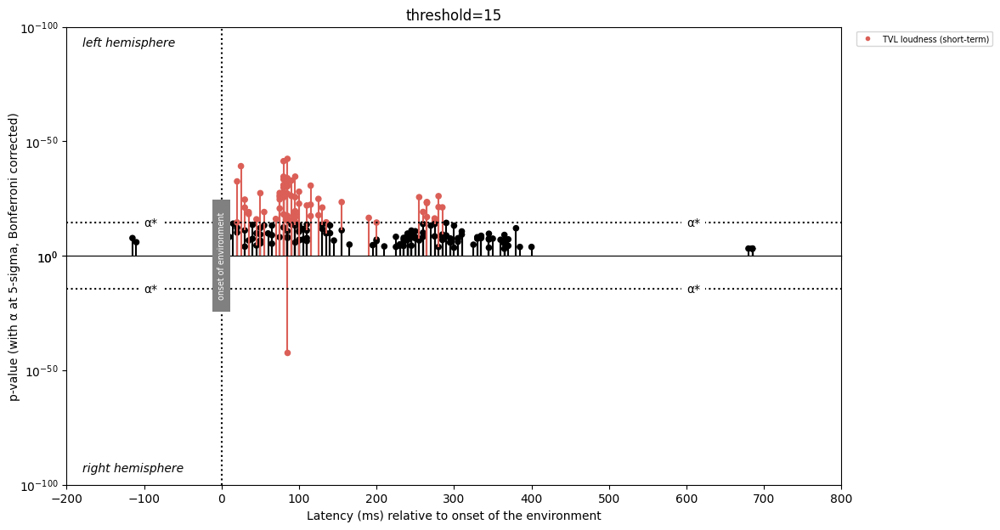

In [7]:
plot_threshold([5, 10, 15], ls_hexels) 

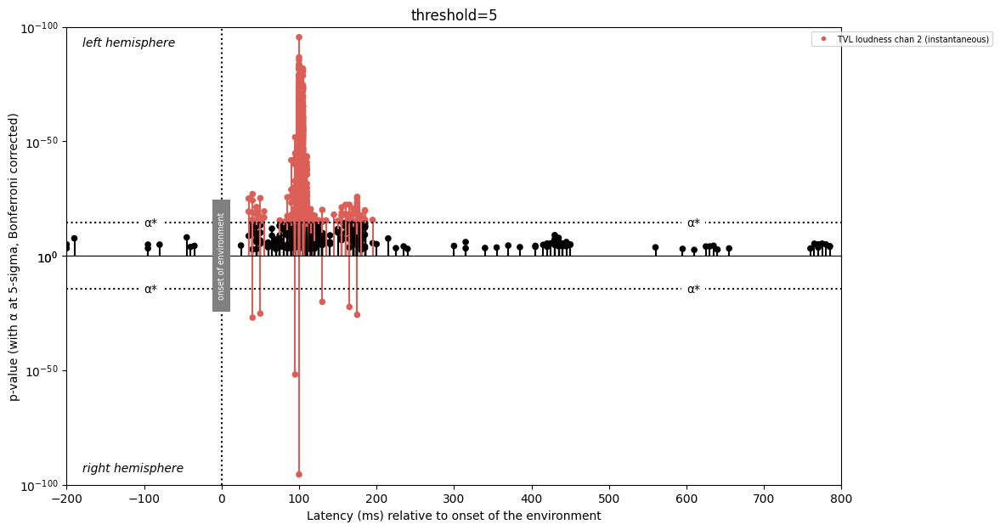

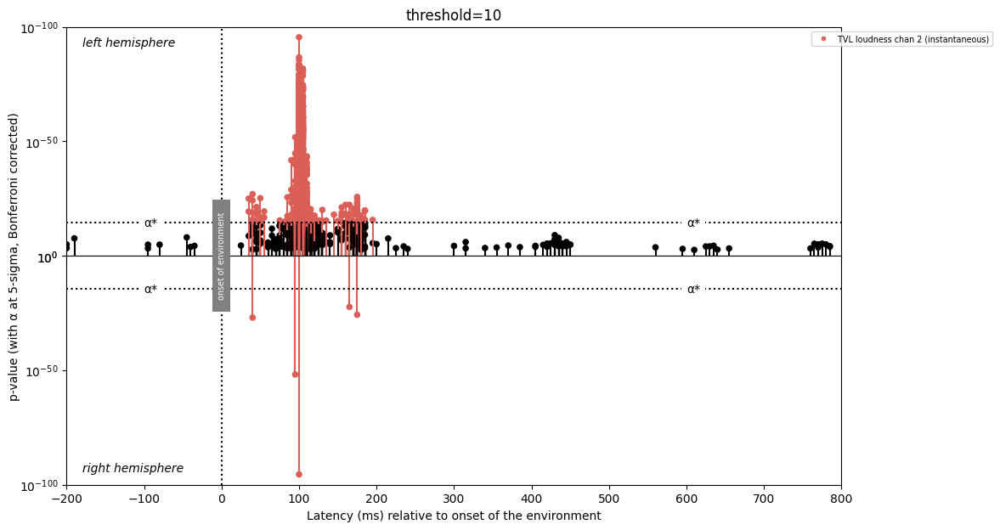

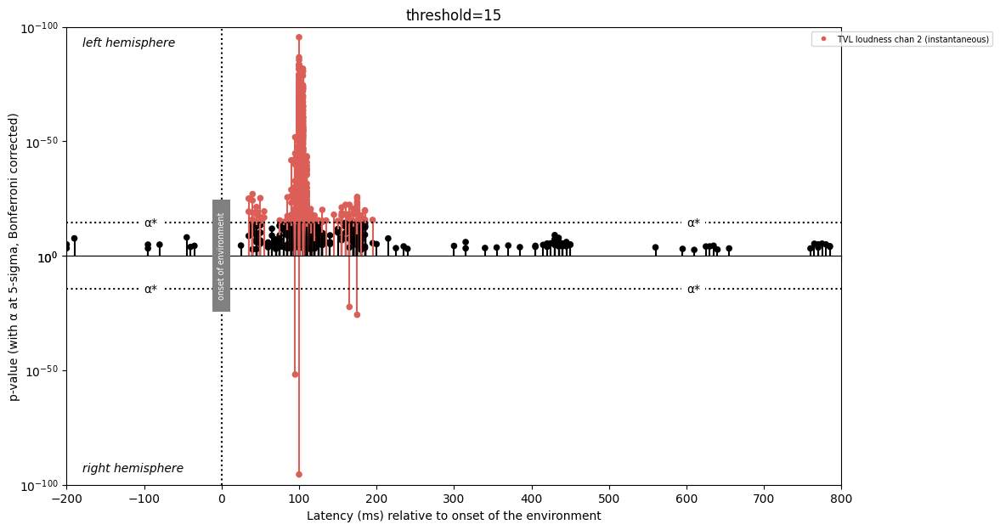

In [8]:
plot_threshold([5, 10, 15], lc2_hexels) 

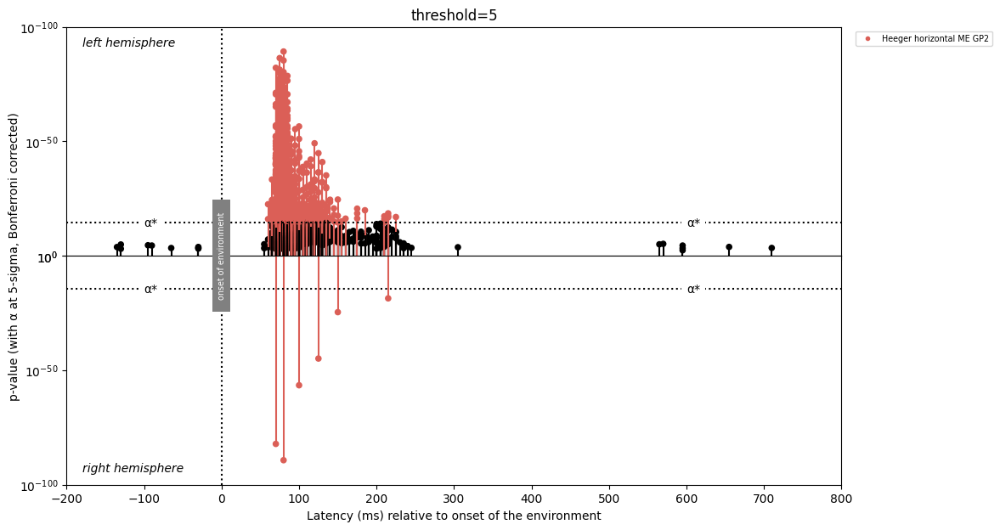

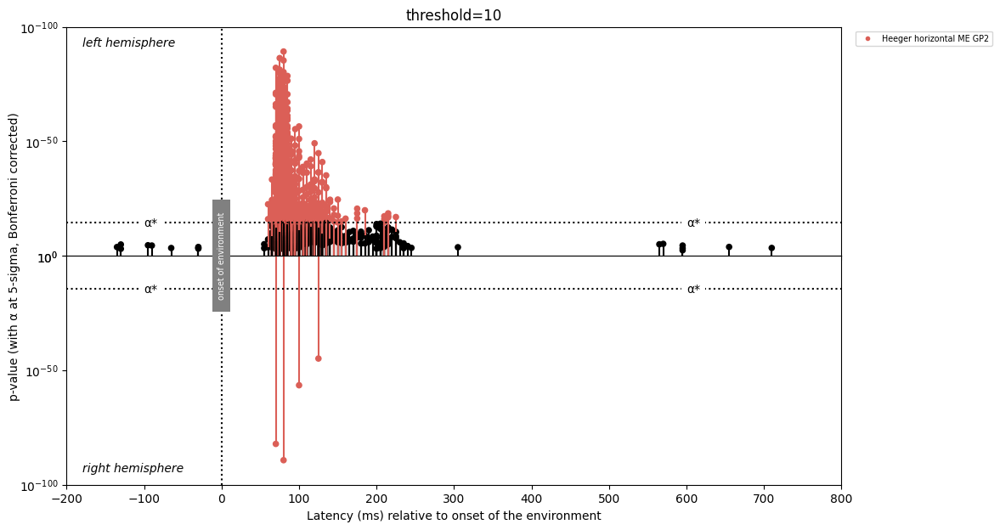

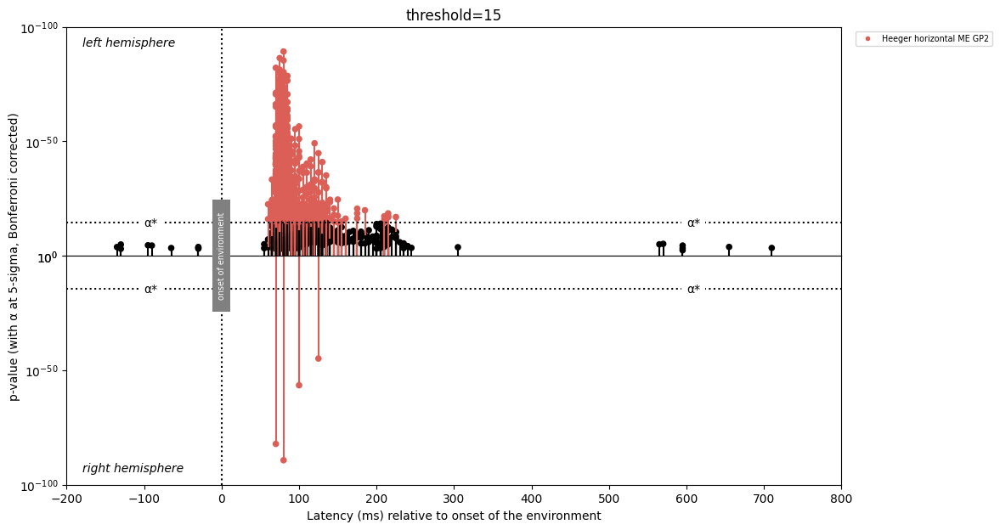

In [9]:
plot_threshold([5, 10, 15], h_hexels) 

### Analysis of thresholds

Threshold is an intuitive parameter that does not depend on the local structure. Indeed, we can even use the same threshold across functions because we should use the same standard for significance regardless 

#### Adaptive Max Pooler

A non-parameteric clustering algorithm that changes the kernel size based off the local structure. We set the threshold to 2 and minimum bin size to 5. When you find a significant bin, you look ahead and behind to check for significance using 2. If so, integrate them into the current bin and repeat. Each bin increases the threshold by 2. 

## GMM

Note: I added aic vs bic parameter to GMM. 

In [10]:
def plot_normalised(hexels, clusterer):
    for normalising in [False, True]:
        temp_hexels = deepcopy(hexels)
        denoised_hexels = clusterer.cluster(temp_hexels, 'rightHemisphere', normalise=normalising)
        copy_hemisphere(denoised_hexels, hexels, 'leftHemisphere', 'rightHemisphere')
        stem_plot(denoised_hexels, f'normalising={normalising}')

def plot_aic_vs_bic(hexels):
    for is_aic in [False, True]:
        temp_hexels = deepcopy(hexels)
        clusterer = CustomGMM(is_aic=is_aic)
        plot_denoised_vs_noisy(temp_hexels, clusterer, f'is_aic={is_aic}')

def plot_max_gaussians(ns, hexels):
    for n in ns:
        temp_hexels = deepcopy(hexels)
        clusterer = CustomGMM(max_gaussians=n)
        plot_denoised_vs_noisy(temp_hexels, clusterer, f'max_gaussians={n}')

def plot_init_params(strategies, hexels):
    for strat in strategies:
        temp_hexels = deepcopy(hexels)
        clusterer = CustomGMM(init_params=strat)
        plot_denoised_vs_noisy(temp_hexels, clusterer, f'init_params={strat}')

def plot_max_iter(maxes, hexels):
    for maximum in maxes:
        temp_hexels = deepcopy(hexels)
        clusterer = CustomGMM(max_iter=maximum)
        plot_denoised_vs_noisy(temp_hexels, clusterer, f'max_iter={maximum}')

def plot_n_init(n_inits, hexels):
    for n_init in n_inits:
        temp_hexels = deepcopy(hexels)
        clusterer = CustomGMM(n_init=n_init)
        plot_denoised_vs_noisy(temp_hexels, clusterer, f'n_init={n_init}')

### normalising

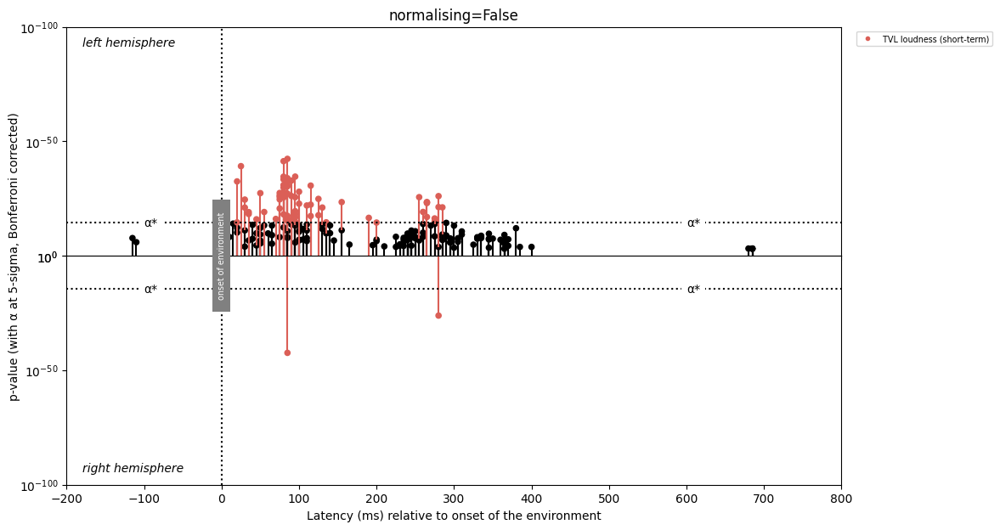

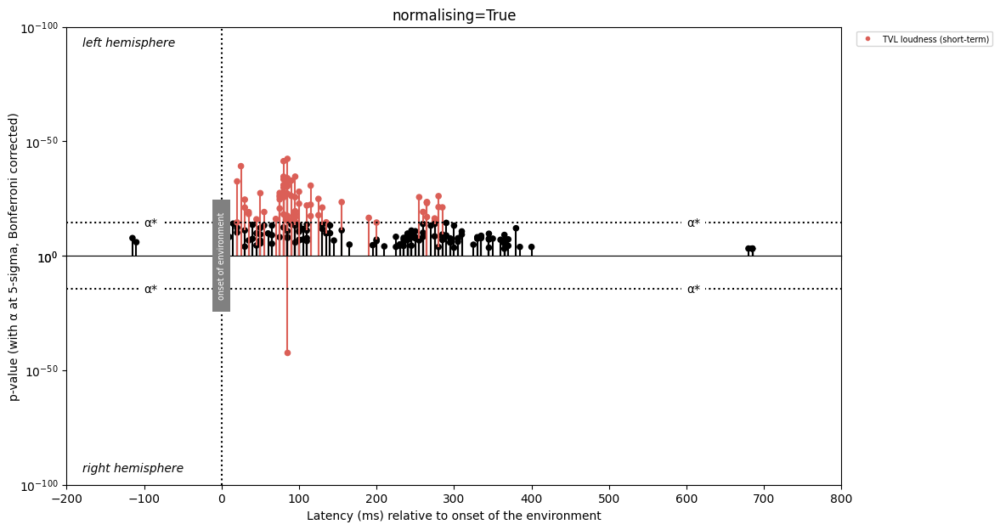

In [11]:
plot_normalised(ls_hexels, CustomGMM())

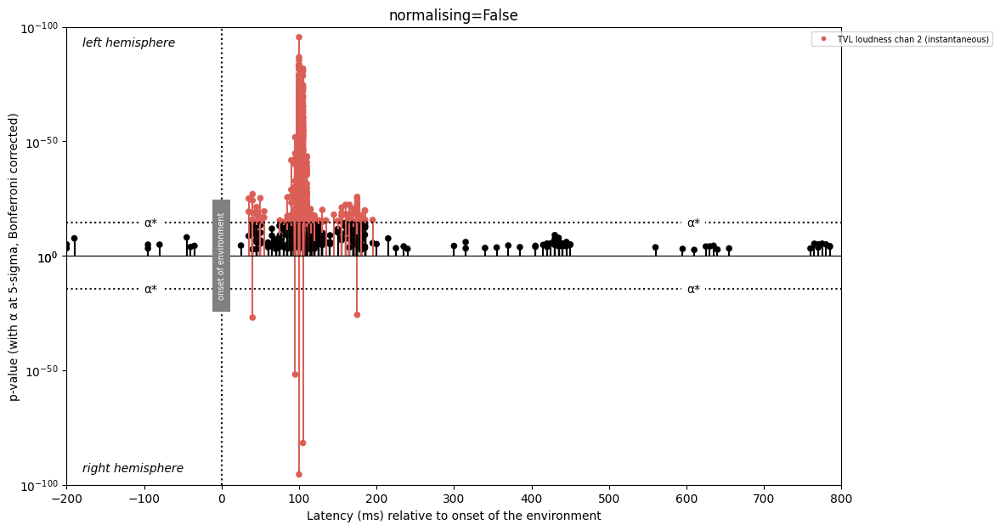

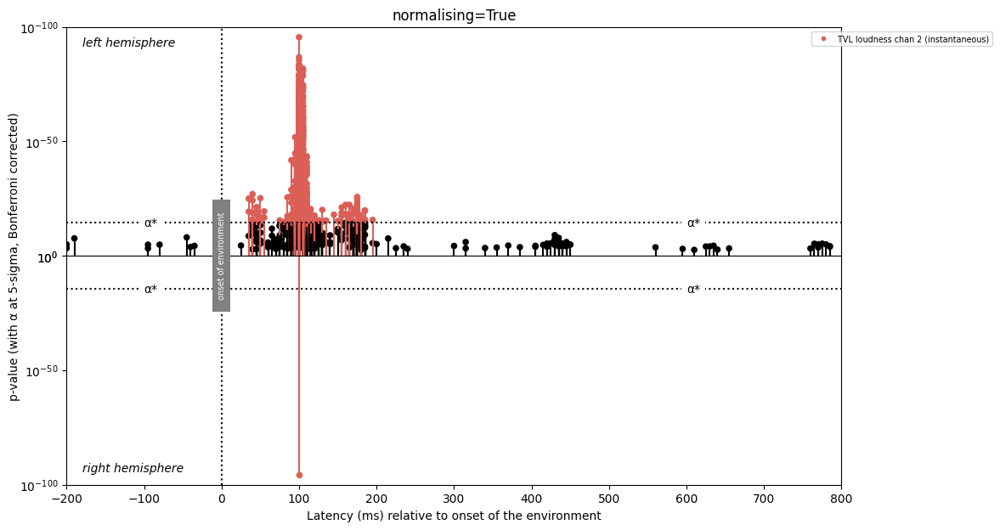

In [12]:
plot_normalised(lc2_hexels, CustomGMM())

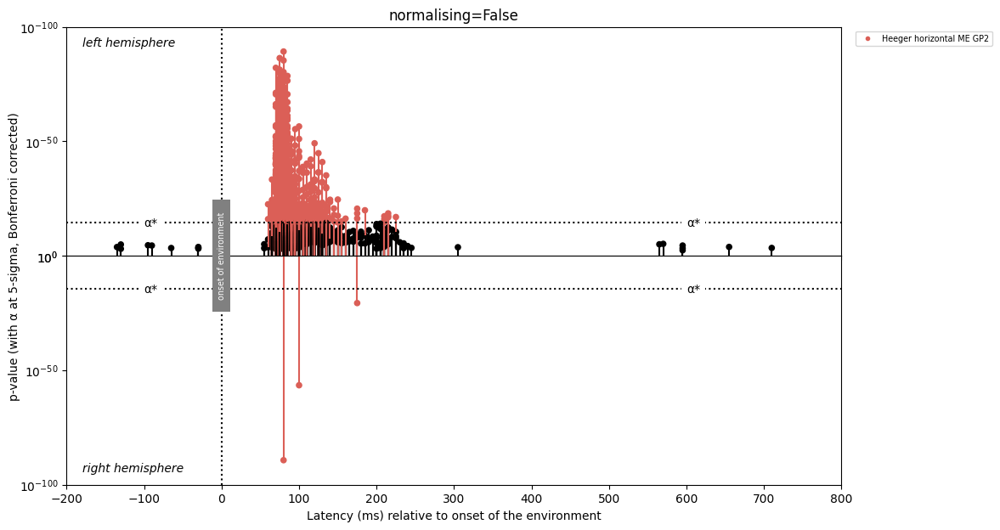

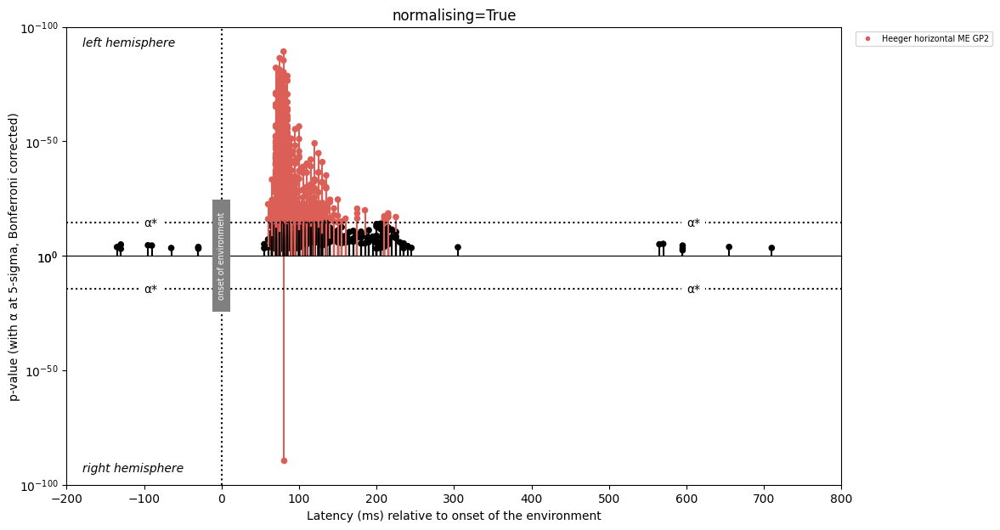

In [13]:
plot_normalised(h_hexels, CustomGMM())

### Analysis of normalising for GMM

On average, normalising=False appears to be superior in the context of Gaussians. GMM does not rely on any distance based metrics or gradient-based optimisation, hence, we do not really expect to see much of a difference in performance. normalising = False seems to be equivalent to just taking the maximum spike out of all spikes in the context of GMM. There is a deeper analysis of normalising in the DBSCAN section, which illustrates why normalising=False is superior in this context.

### AIC Vs BIC

#### Hypothesis: BIC should be better.
#### Rationale: The difference between AIC and BIC is that AIC does not assume the ground truth model is among the candidate models, whereas BIC does. I suppose it comes down to whether we observe Gaussian-esque blurring in the time-series, which implies that a Mixture of Gaussian models is reality. Overall, AIC is superior for maximising predictive performance since it does not penalise overfitting as heavily as BIC once the dataset size is above 7, i.e., N >  7 -> BIC > AIC for the same complexity model.

AIC = -2 * loglikelihood(GMM) + 2 * p where p is # of params in model

BIC = -2 * loglikelihood(GMM) + p * ln N where N is the dataset size and p is # of params in model

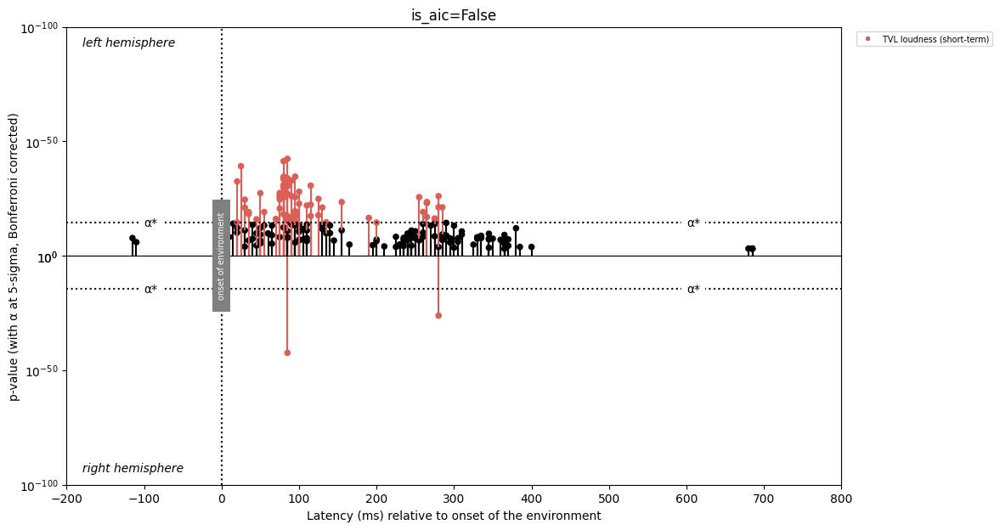

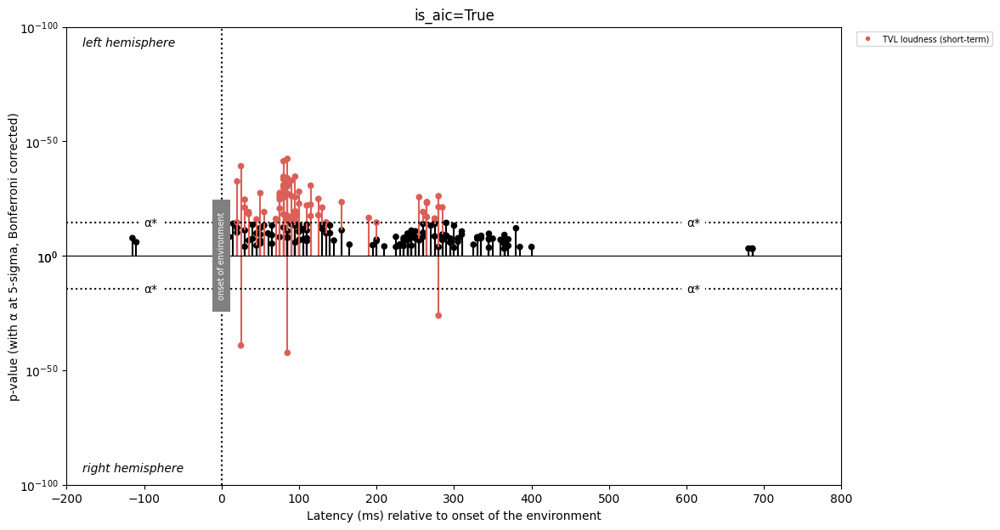

In [14]:
plot_aic_vs_bic(ls_hexels)

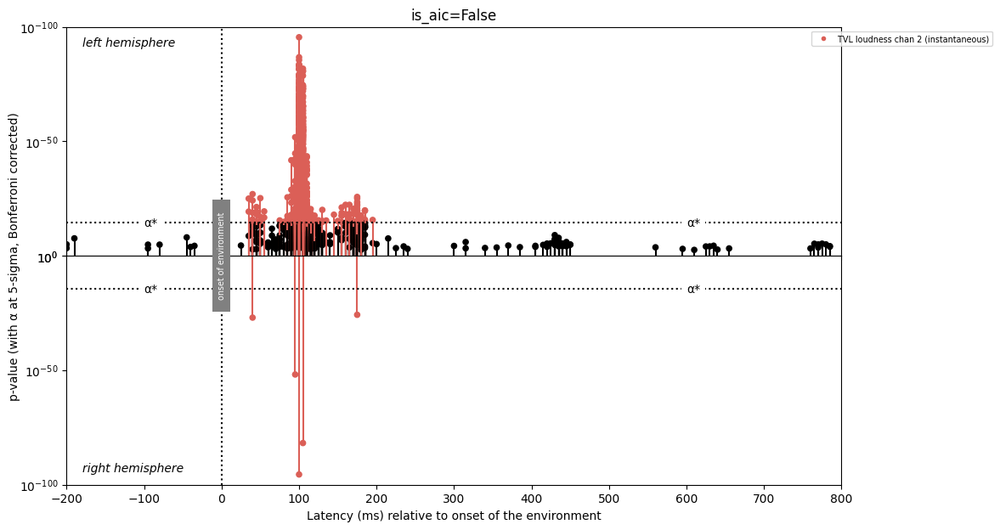

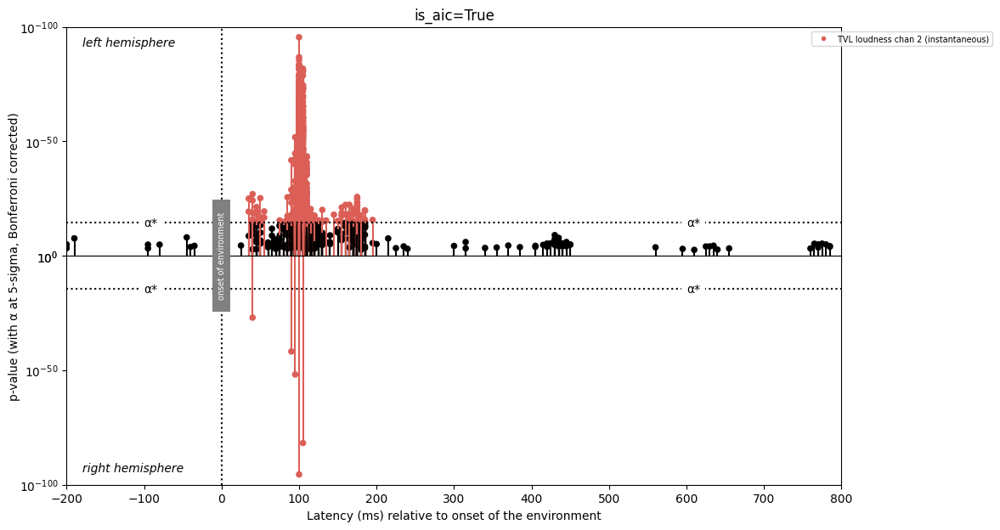

In [15]:
plot_aic_vs_bic(lc2_hexels)

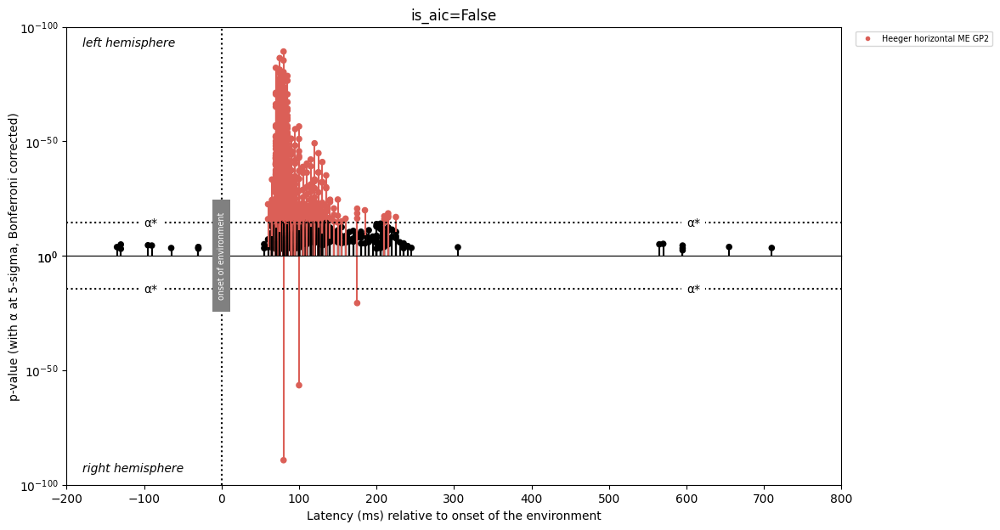

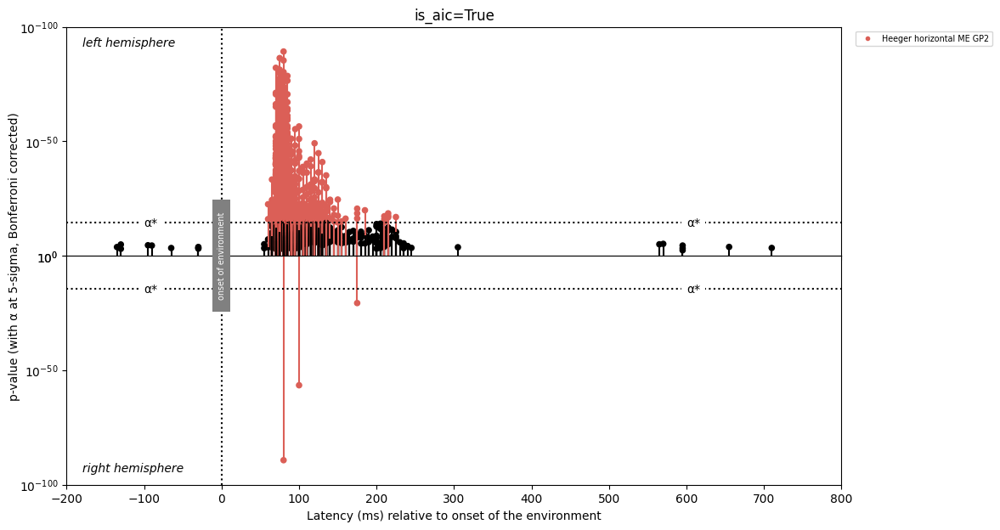

In [16]:
plot_aic_vs_bic(h_hexels)

#### Analysis of AIC vs BIC

Inconclusive. There does not appear to be too large a difference between using AIC and BIC. In some cases, AIC is superior, while in others BIC is, and sometimes, both are equivalent. Thus, GMM uses BIC.

### Max Gaussians

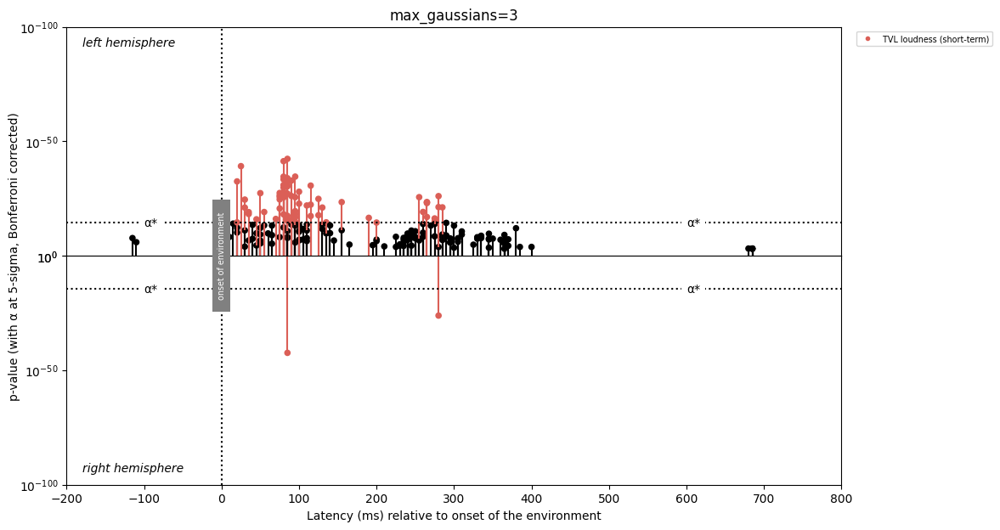

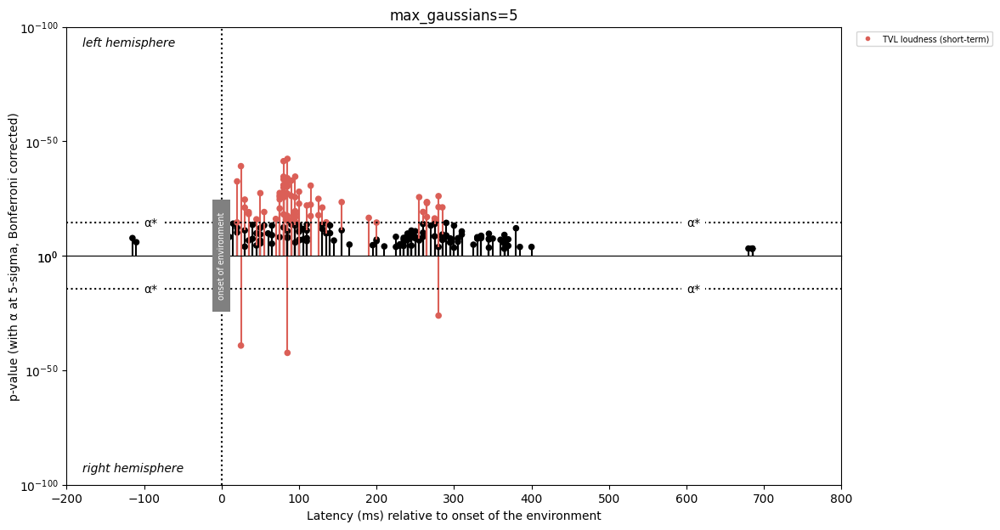

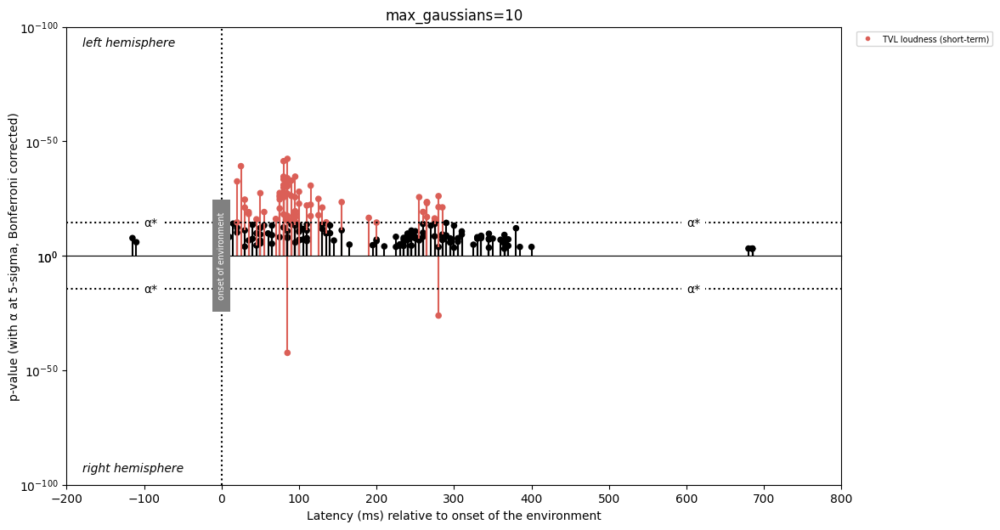

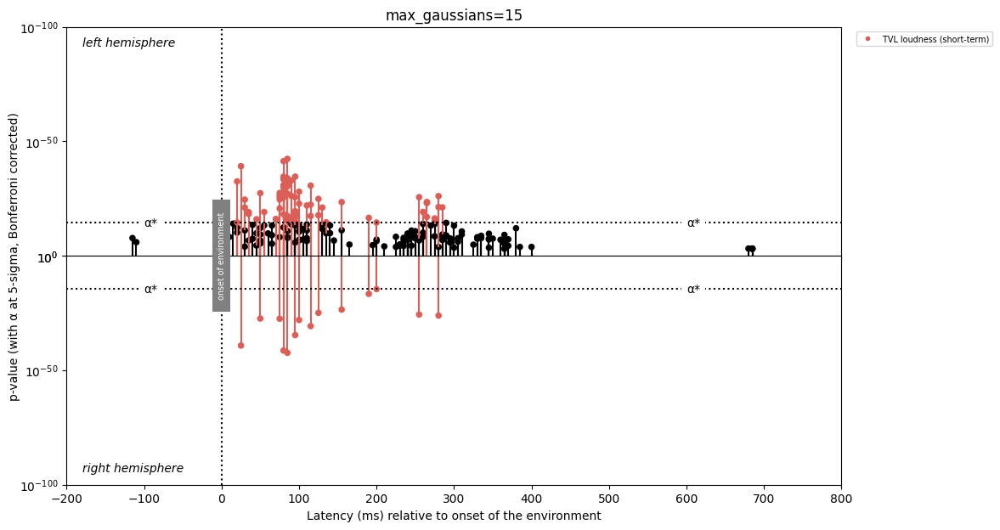

In [17]:
plot_max_gaussians([3, 5, 10, 15], ls_hexels)

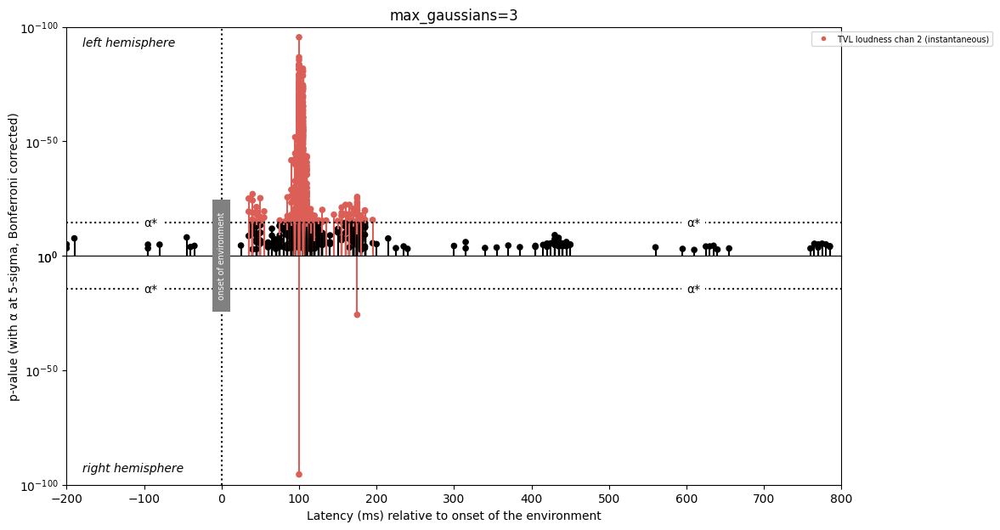

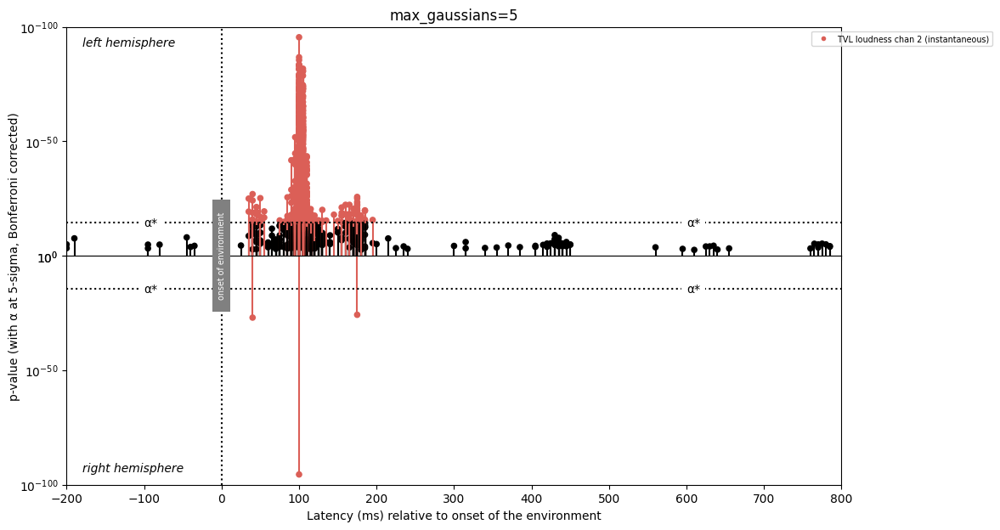

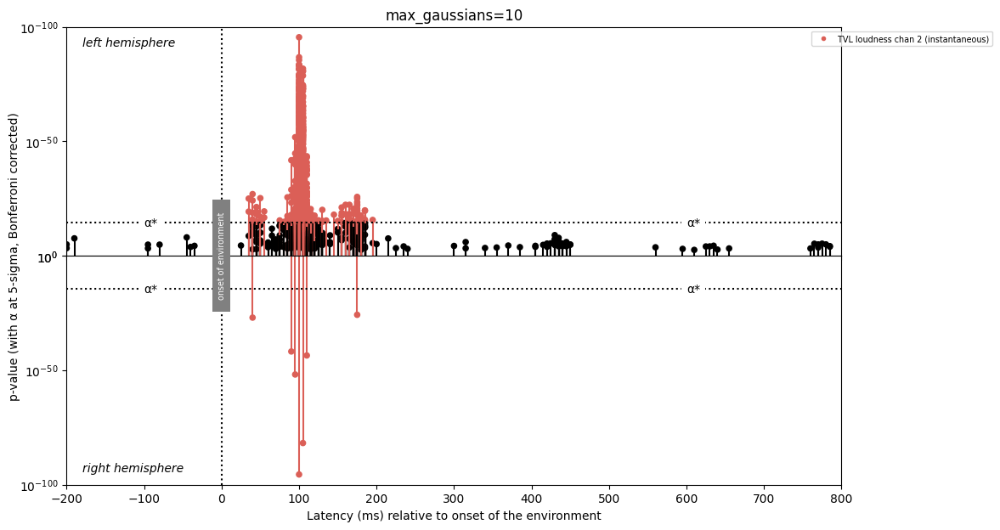

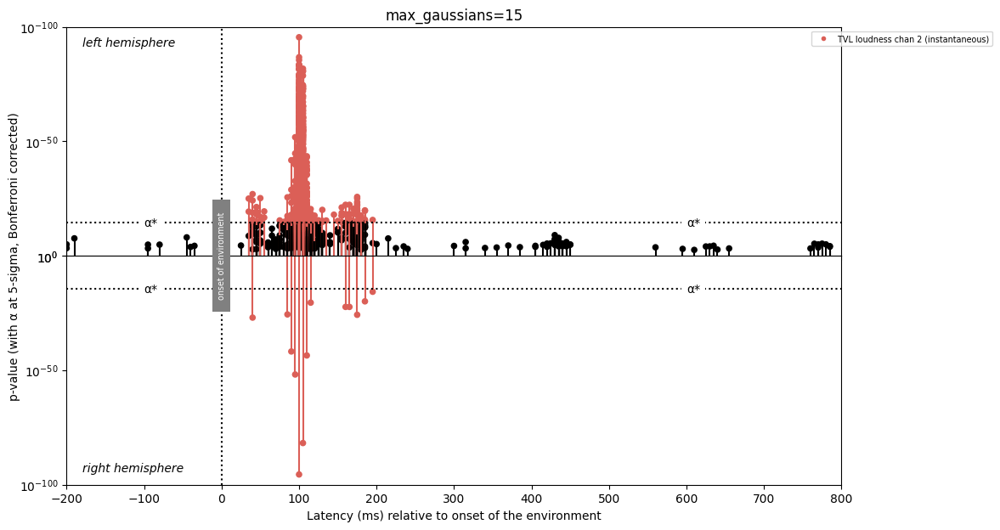

In [18]:
plot_max_gaussians([3, 5, 10, 15], lc2_hexels)

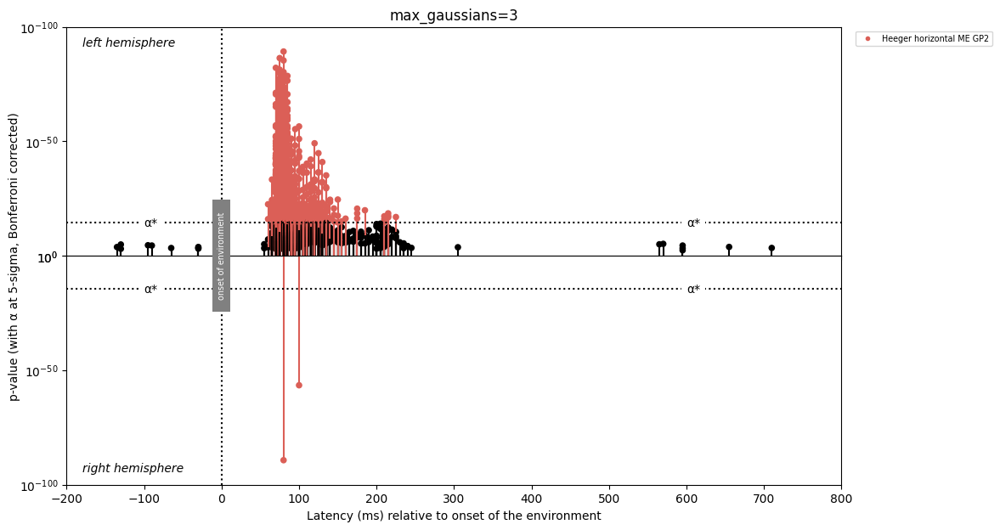

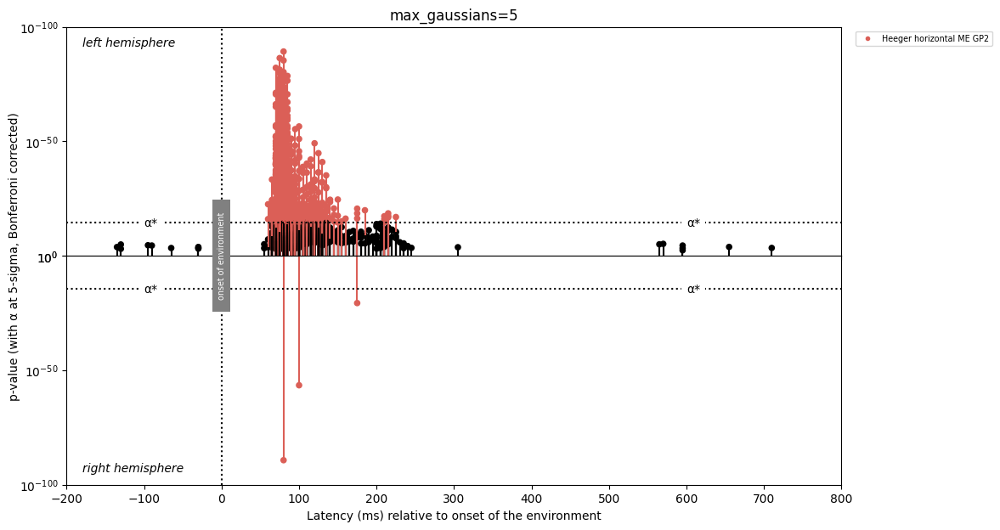

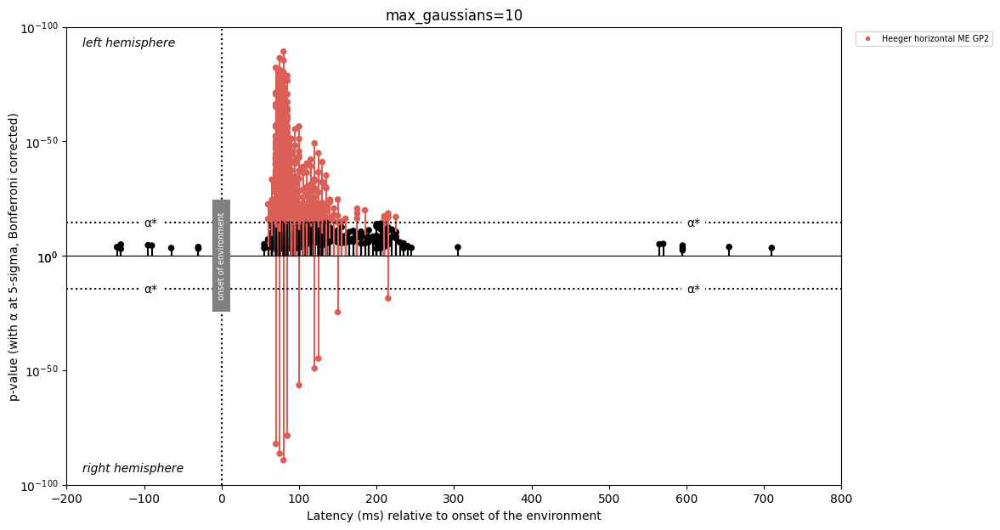

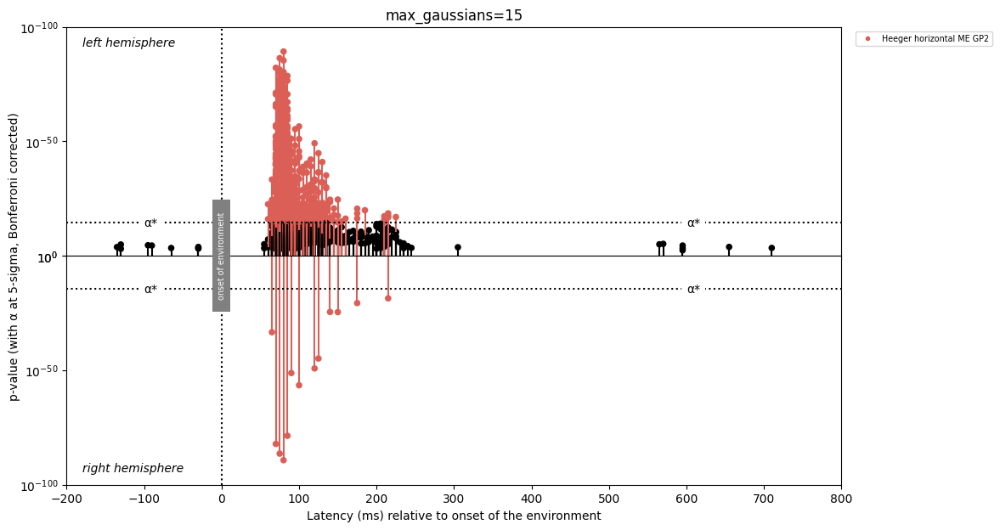

In [19]:
plot_max_gaussians([3, 5, 10, 15], h_hexels)

#### Analysis of Max Gaussians

A clear pattern emerges: the lower the number of Gaussians, the less likely GMM is to overfit. Hence, the optimal method of selection would be to actually ad hoc visually inspect the time-series and input the visually expected number of clusters as the maximum. The automated method overfits with too many max_gaussians, so users should pick less than 5.

Once avenue we could go down is to use an extremely high number of Gaussians, then run another clusterer on the output.

### init_params

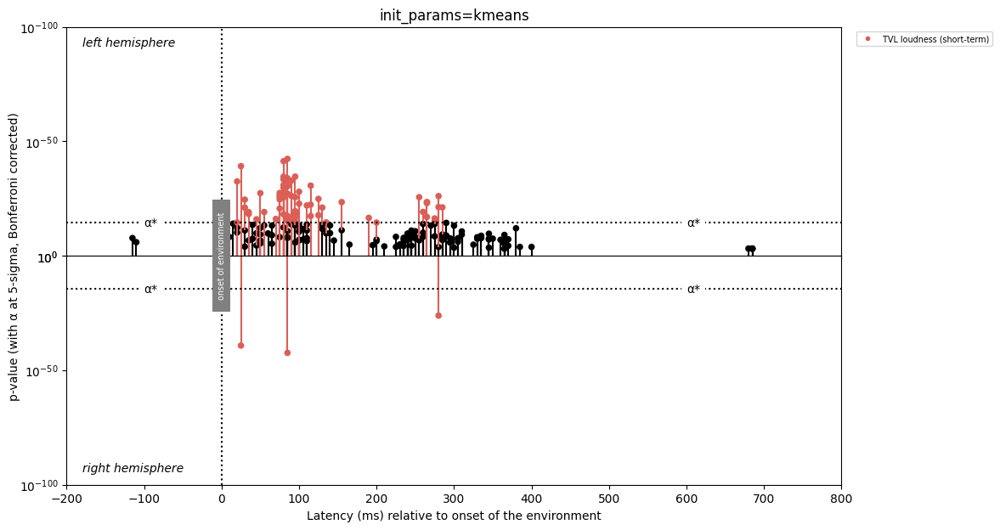

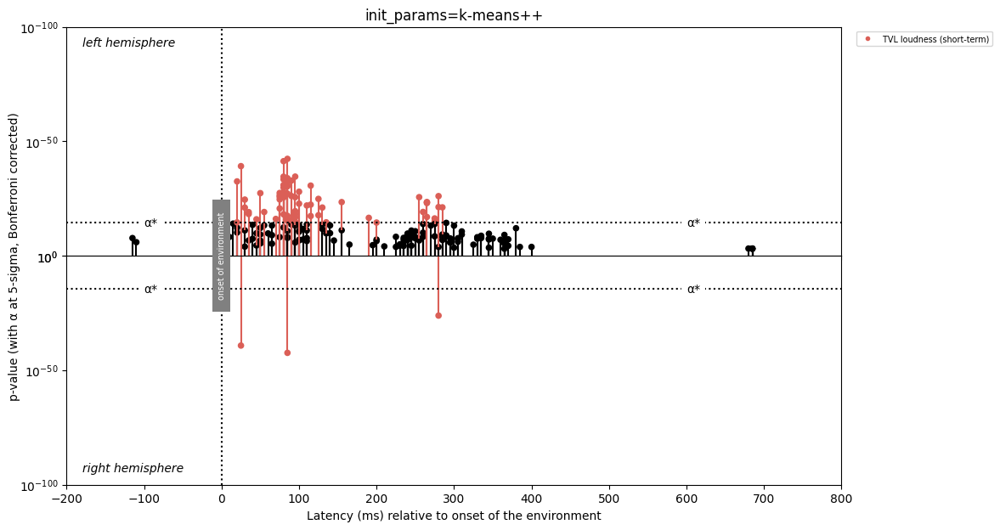

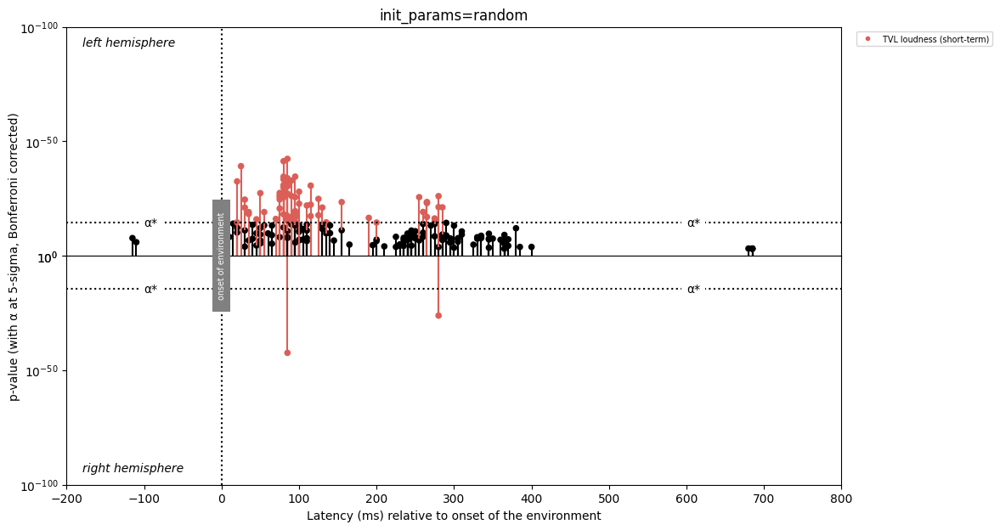

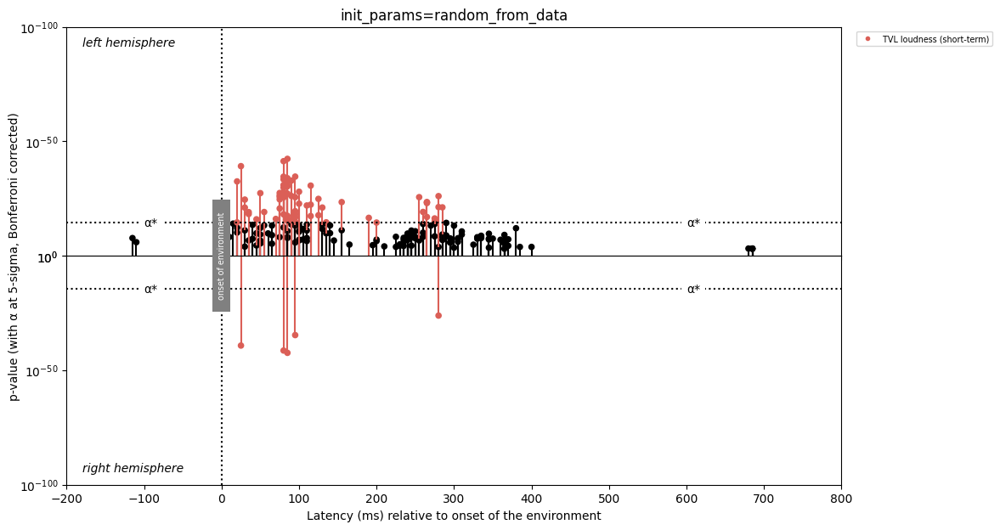

In [20]:
plot_init_params(['kmeans', 'k-means++', 'random', 'random_from_data'], ls_hexels)

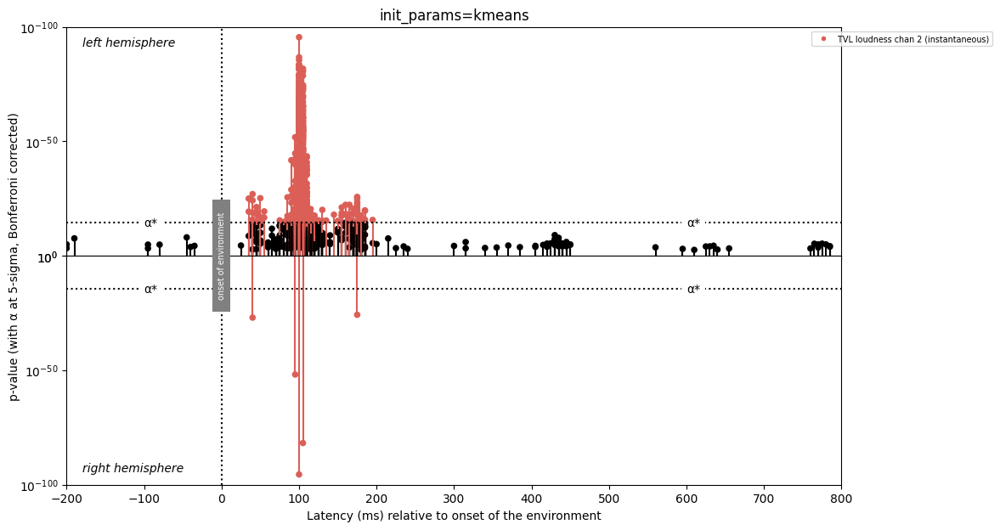

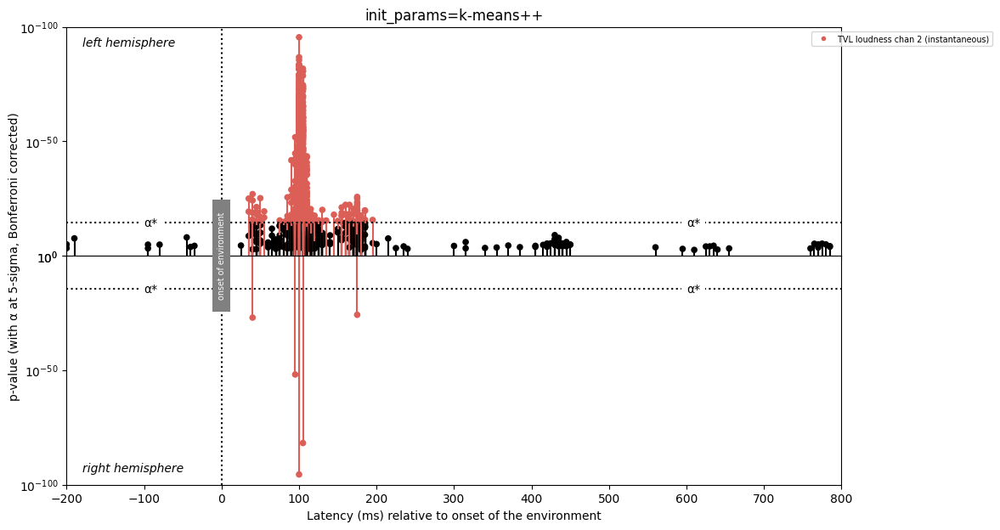

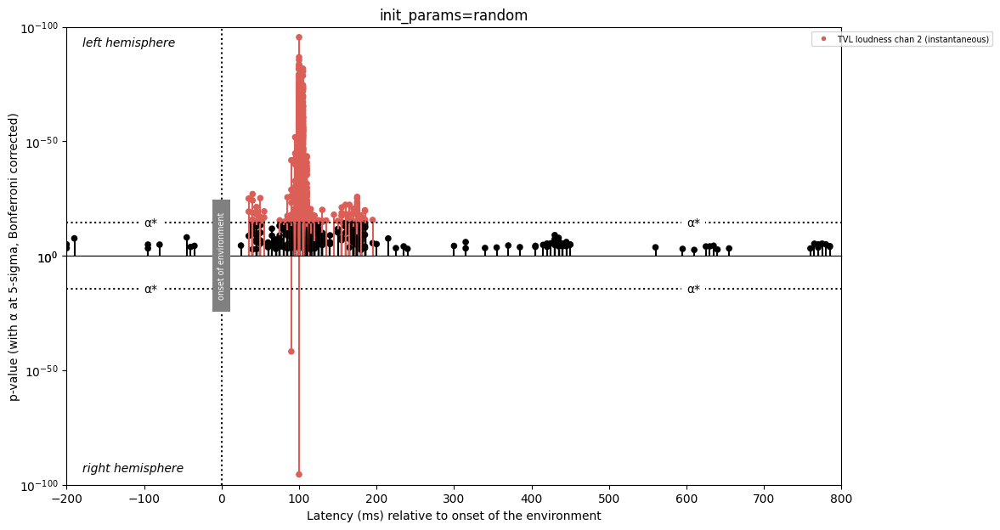

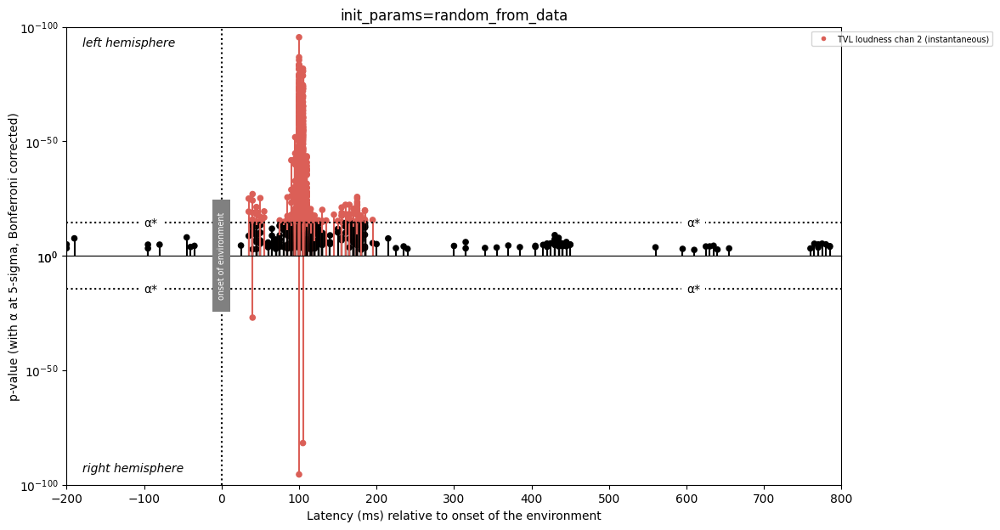

In [21]:
plot_init_params(['kmeans', 'k-means++', 'random', 'random_from_data'], lc2_hexels)

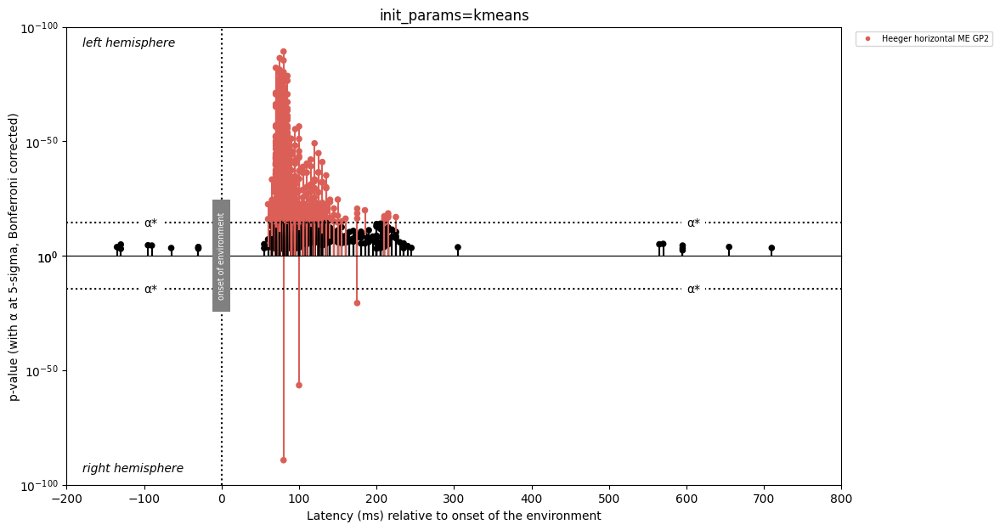

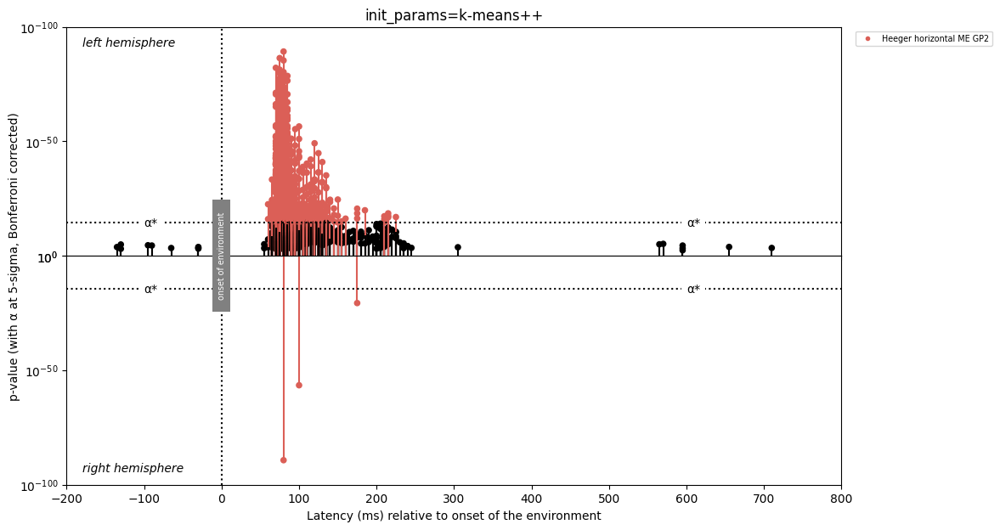

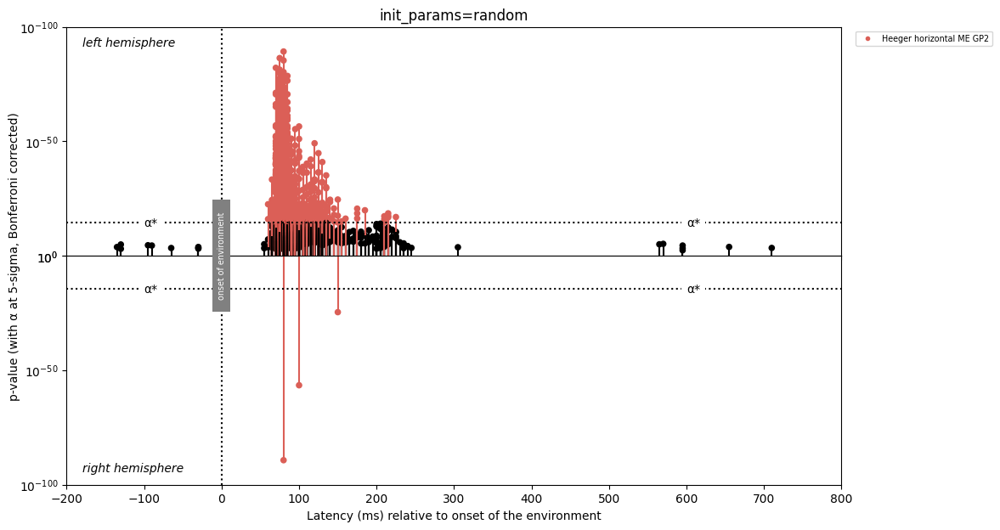

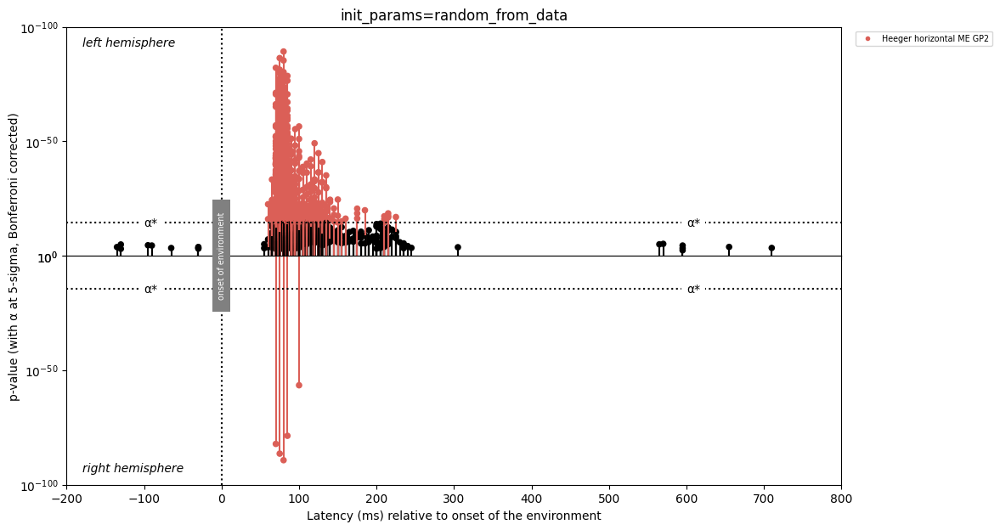

In [22]:
plot_init_params(['kmeans', 'k-means++', 'random', 'random_from_data'], h_hexels)

#### Analysis of init_params

The optimal methods are kmean and k-means++. They mostly agree on the output but in certain cases, kmean appears to be superior. Hence, kmeans should be used.

### max_iter

#### Hypothesis: max_iter increases -> better performance
#### Rationale: It gives GMM more time to converge in log-likelihood. In the case where it has already converged, it would make no difference.

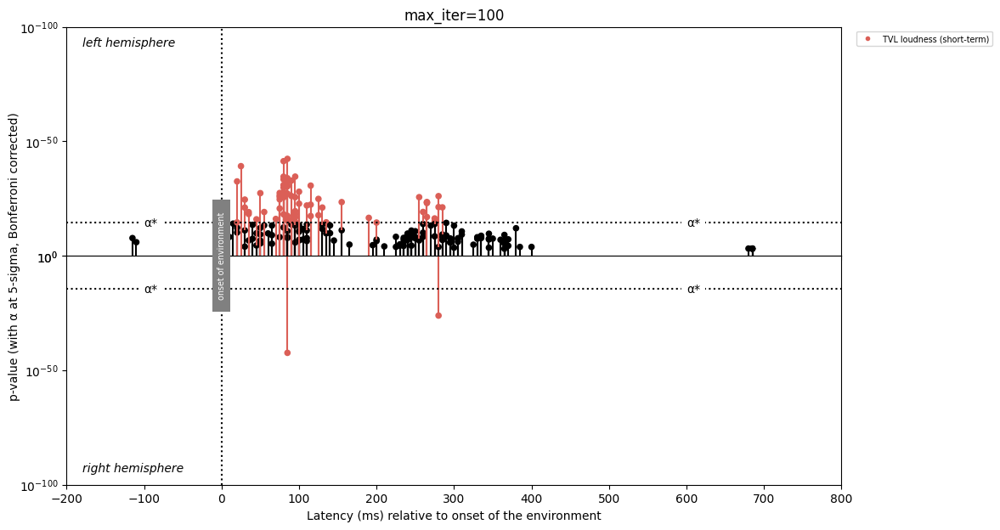

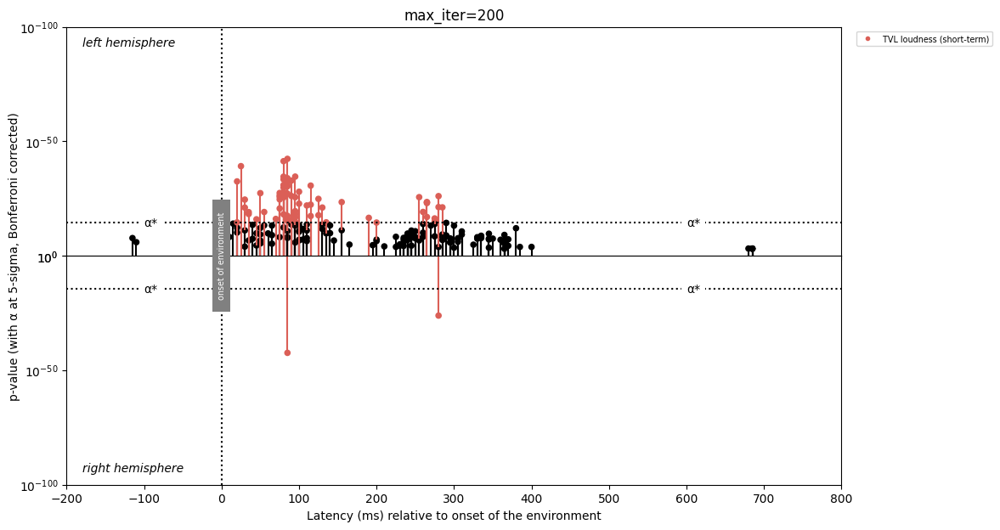

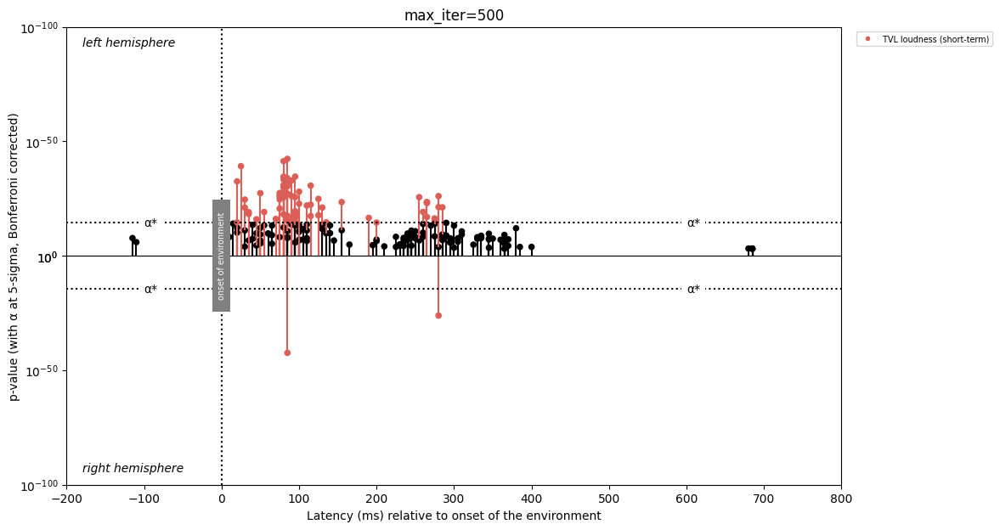

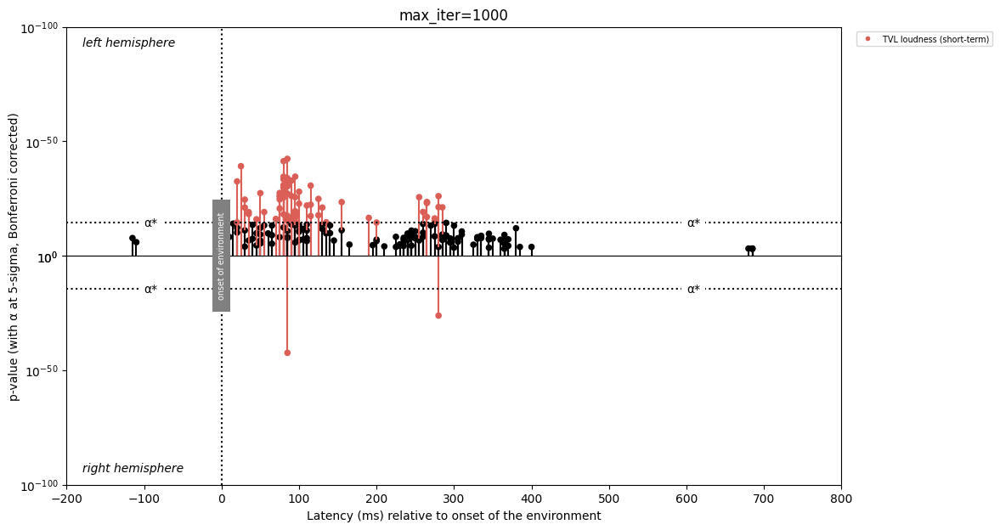

In [23]:
plot_max_iter([100, 200, 500, 1000], ls_hexels)

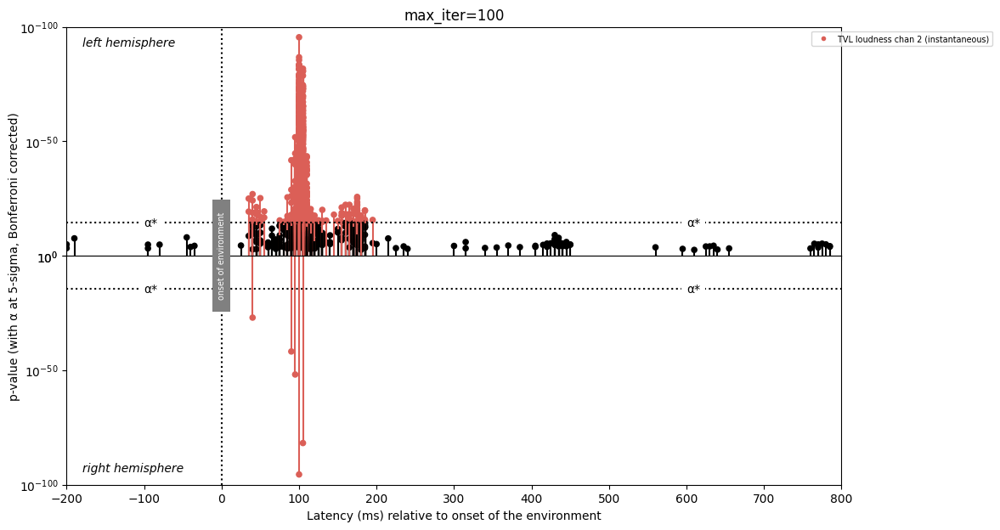

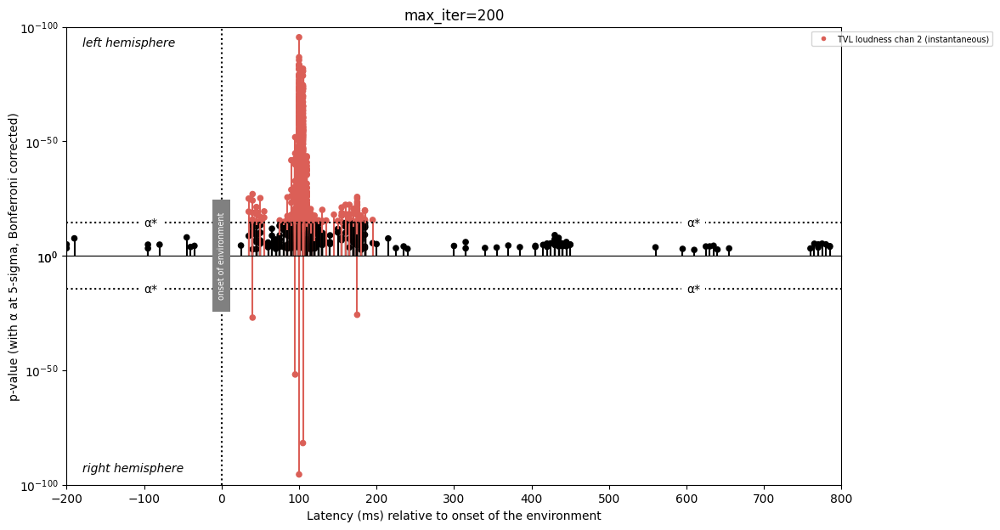

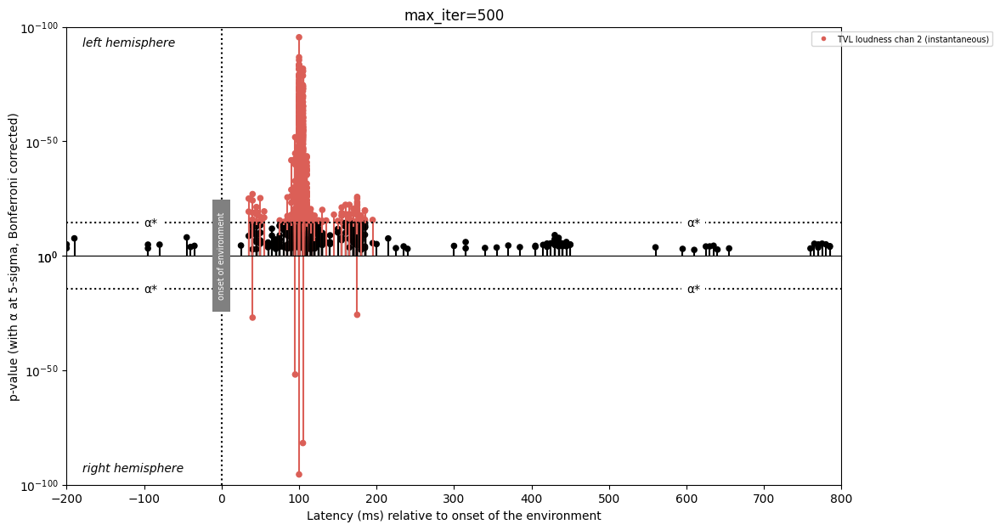

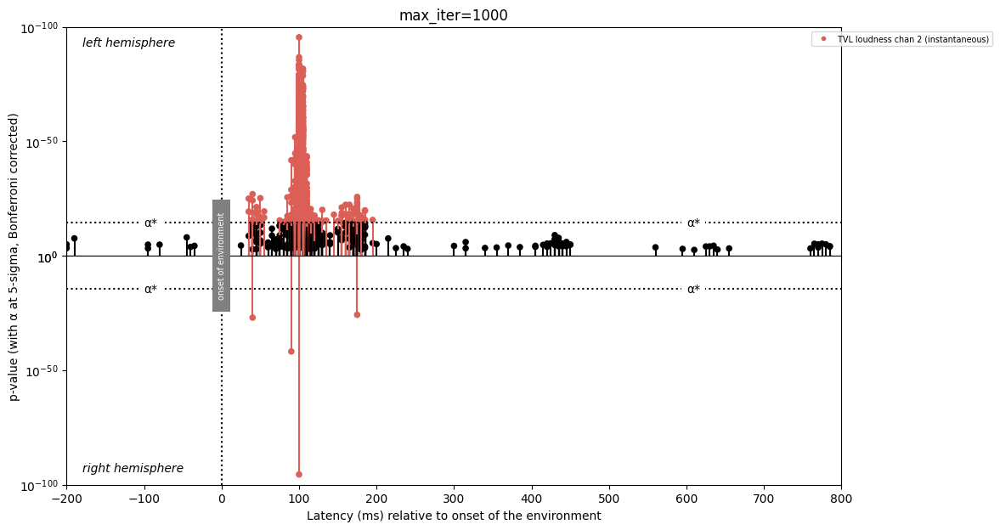

In [24]:
plot_max_iter([100, 200, 500, 1000], lc2_hexels)

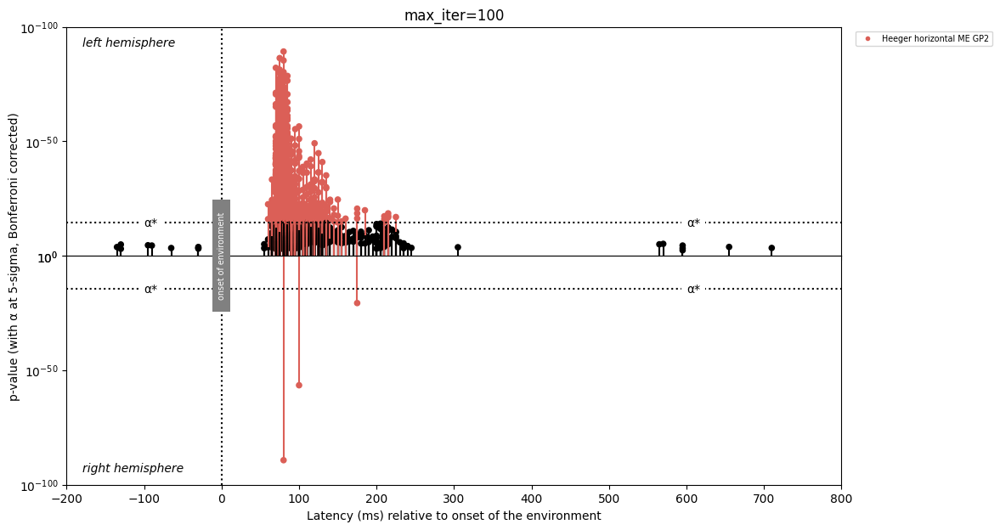

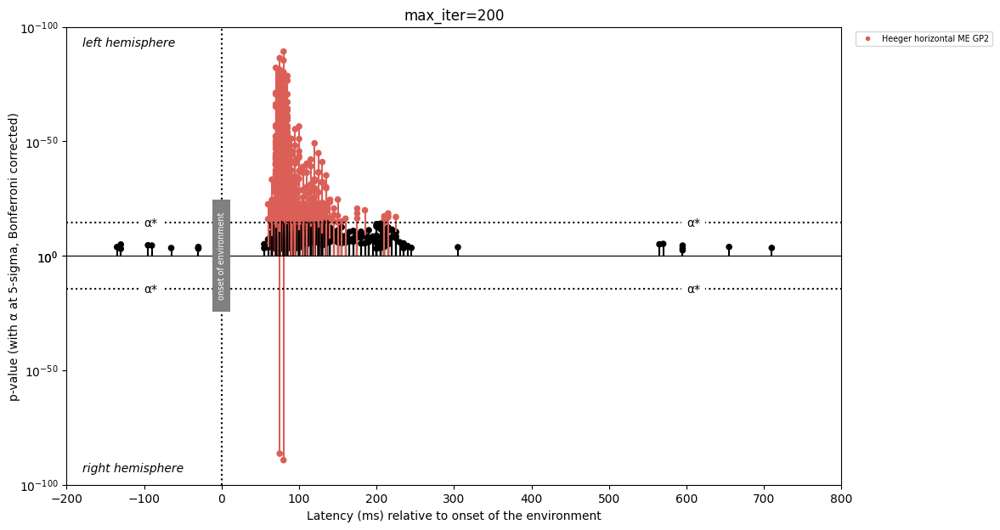

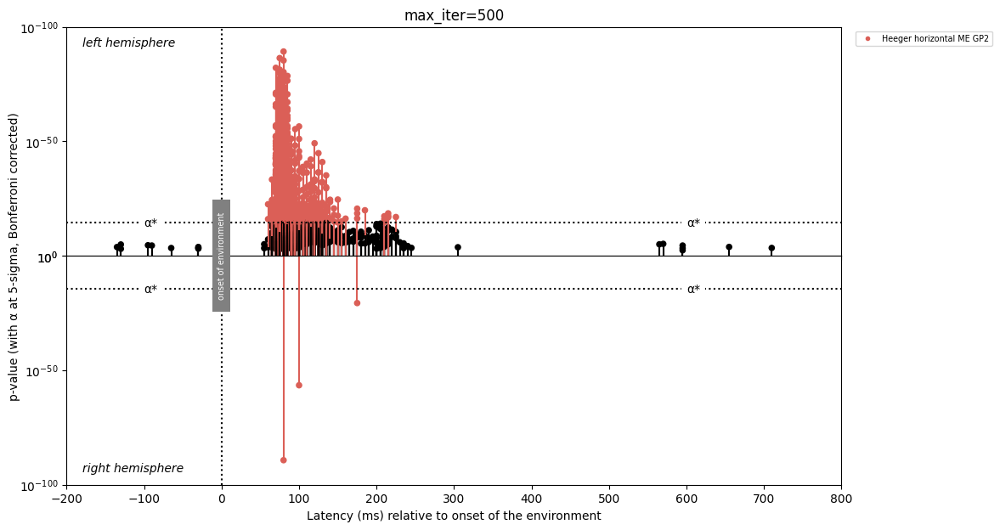

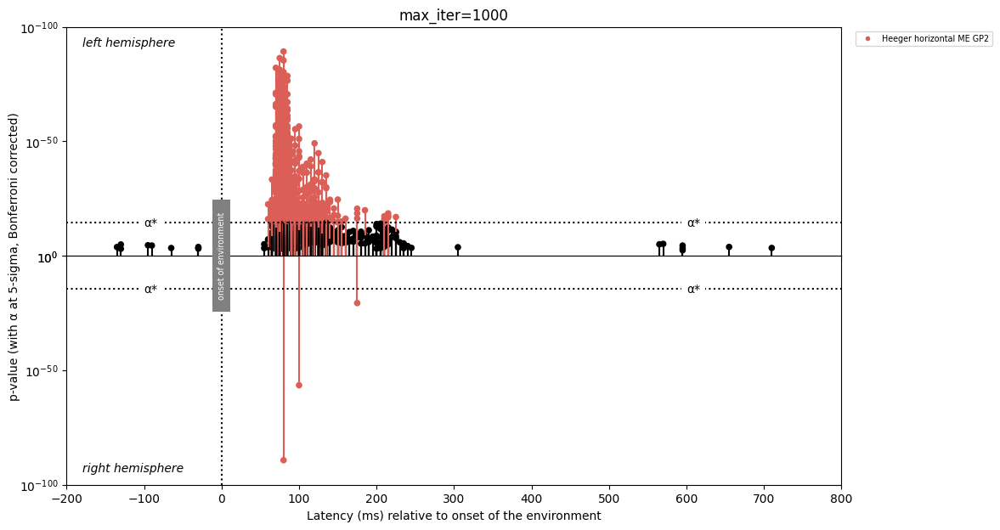

In [25]:
plot_max_iter([100, 200, 500, 1000], h_hexels)

#### Analysis of max_iter

Max_iter only makes a difference when GMM fails to converge in log-likelihood within the specified number of iterations. If it has already converged, then it makes virtually no difference. Hence, since the computational overhead (at the moment) is not too hefty, we should go higher with the max_iters = 1000.

### n_init

#### Hypothesis: More n_init -> better
#### Rationale: GMM has no guarantee that it will converge to the global maximum. Hence, by increasing the number of initialisations at the expense of time, will lead to more local maxima being discovered. We can select the max(local_maxima).



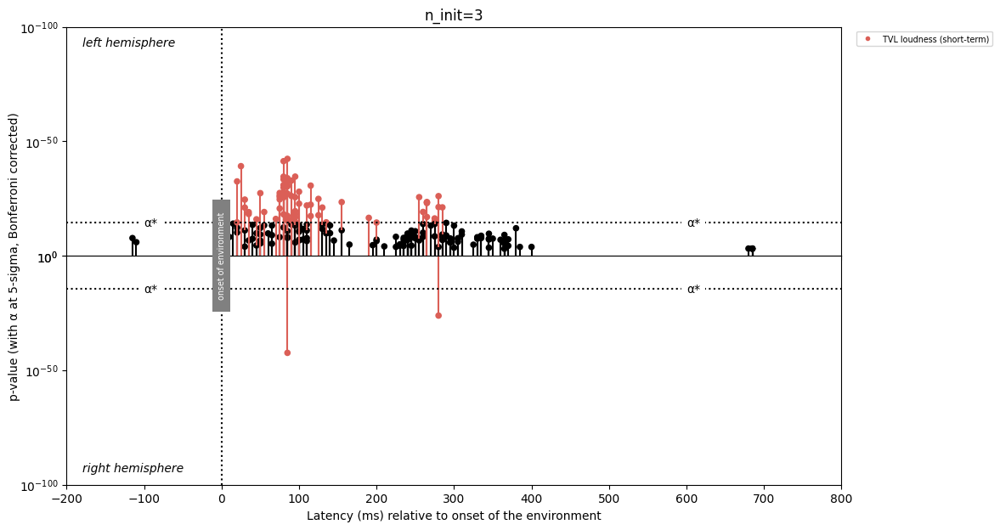

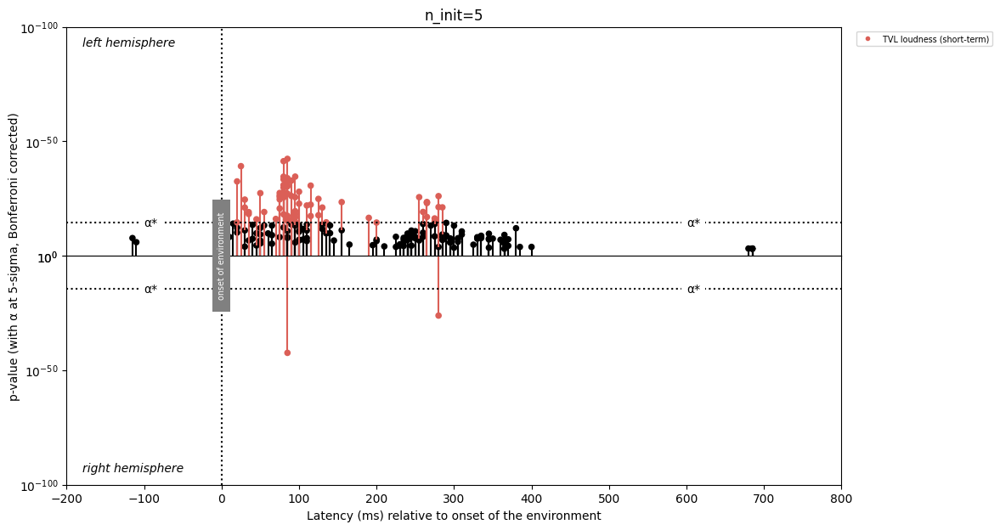

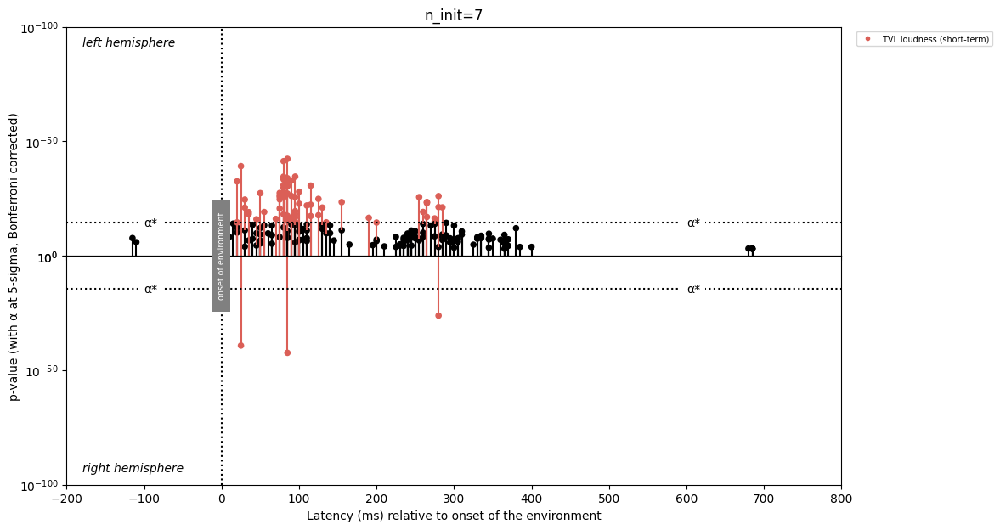

In [26]:
plot_n_init([3, 5, 7], ls_hexels)

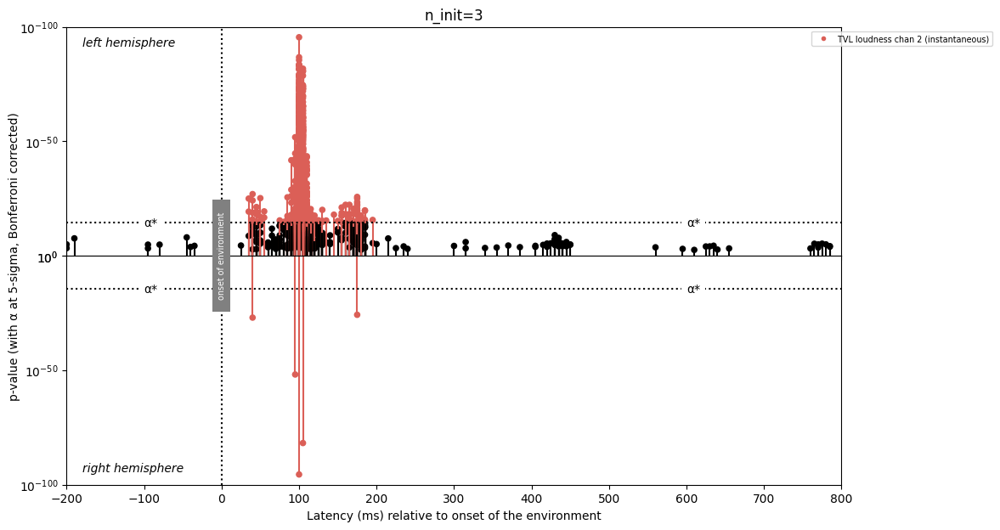

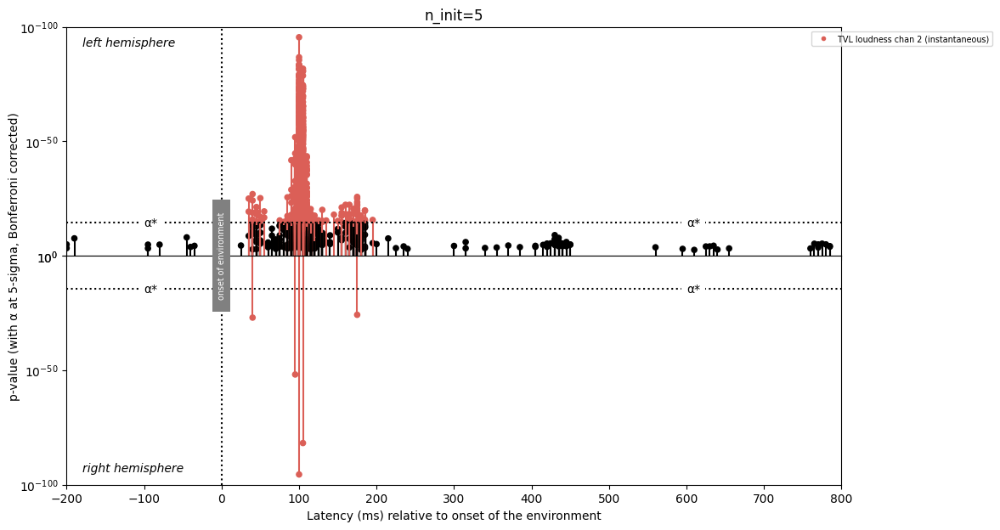

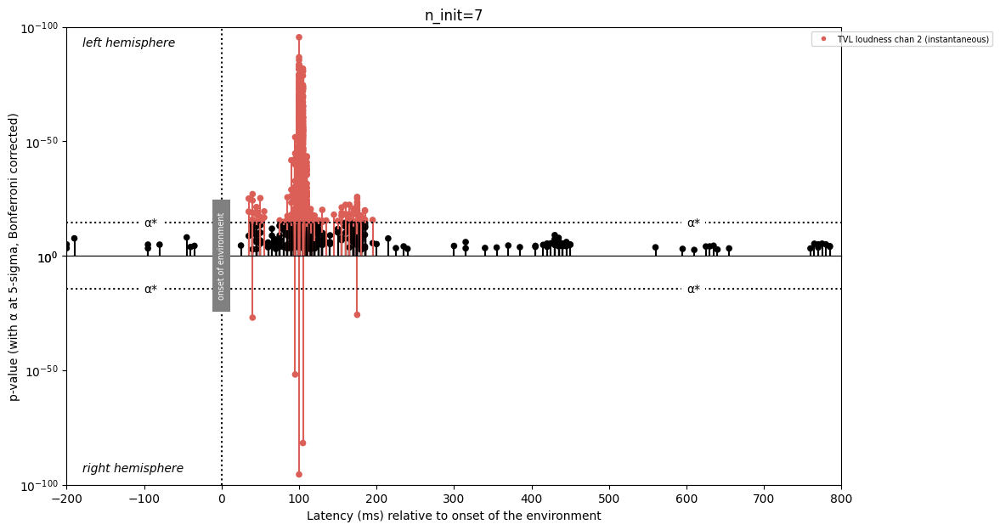

In [27]:
plot_n_init([3, 5, 7], lc2_hexels)

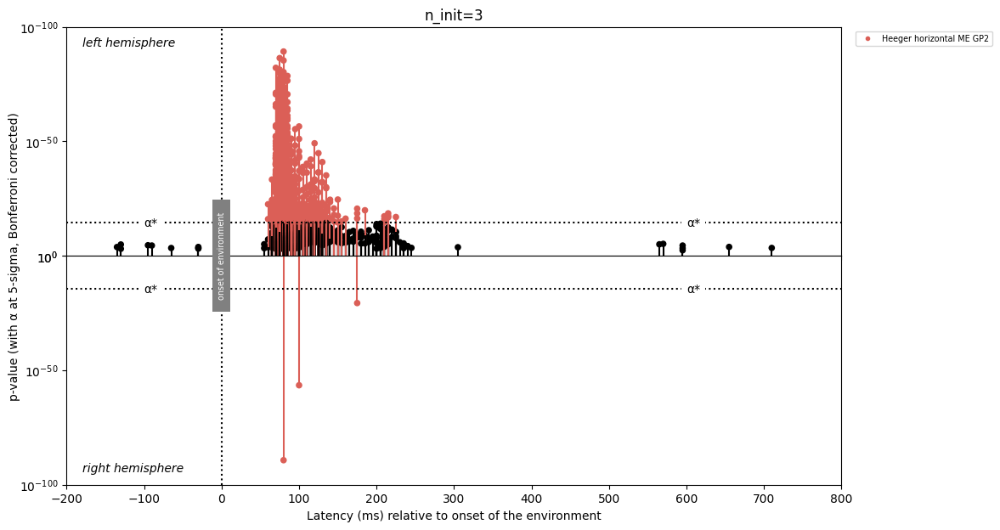

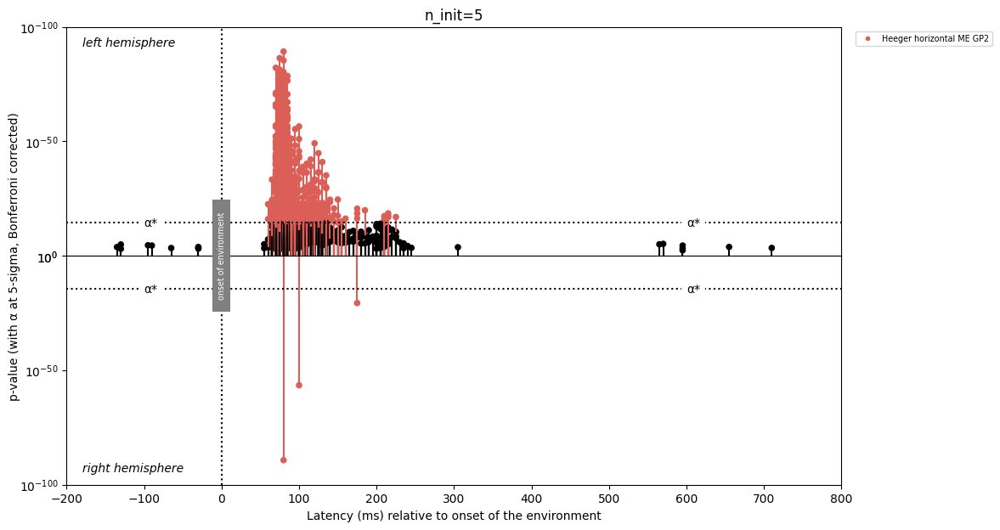

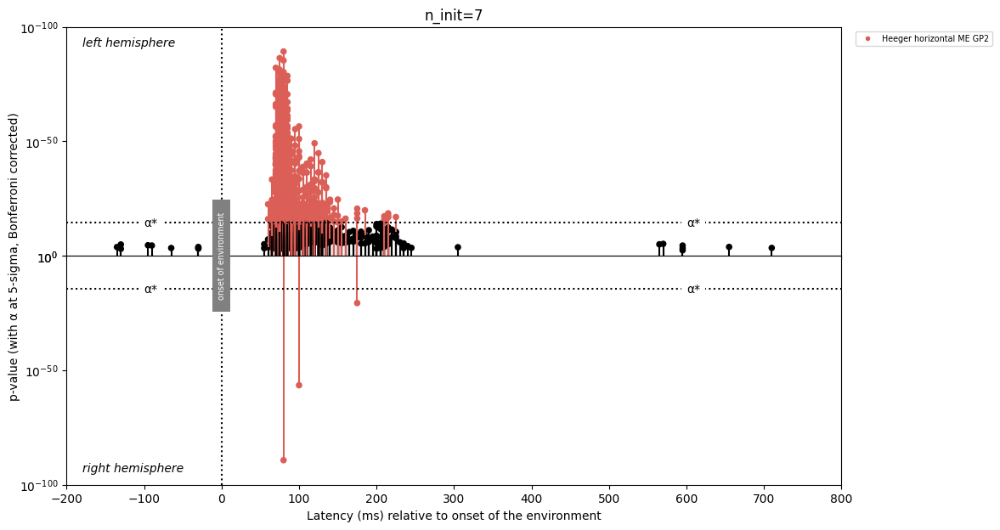

In [28]:
plot_n_init([3, 5, 7], h_hexels)

#### Analysis of n_init

Go with n_init = 7 since it either doesn't influence performance or increases. Hence, we lose only time by increasing n_init.

## DBSCAN

### normalising

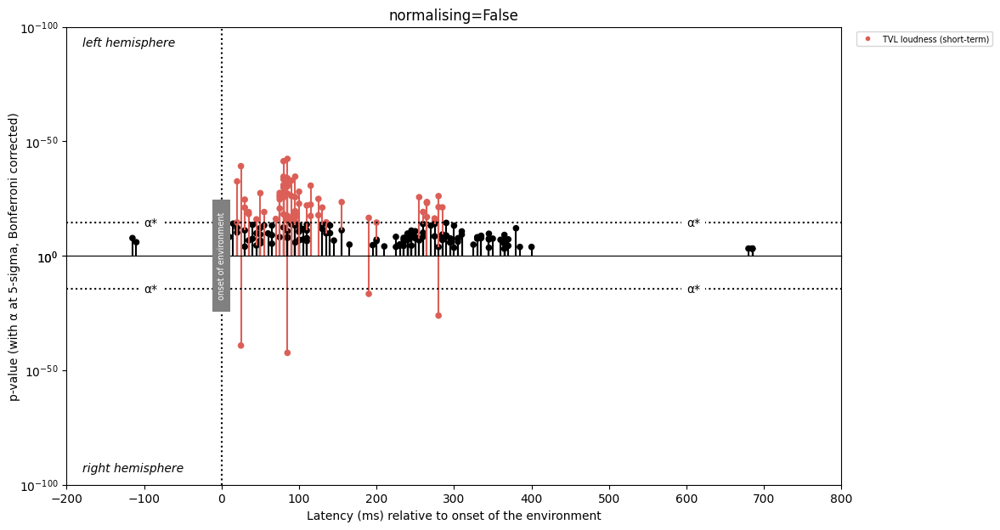

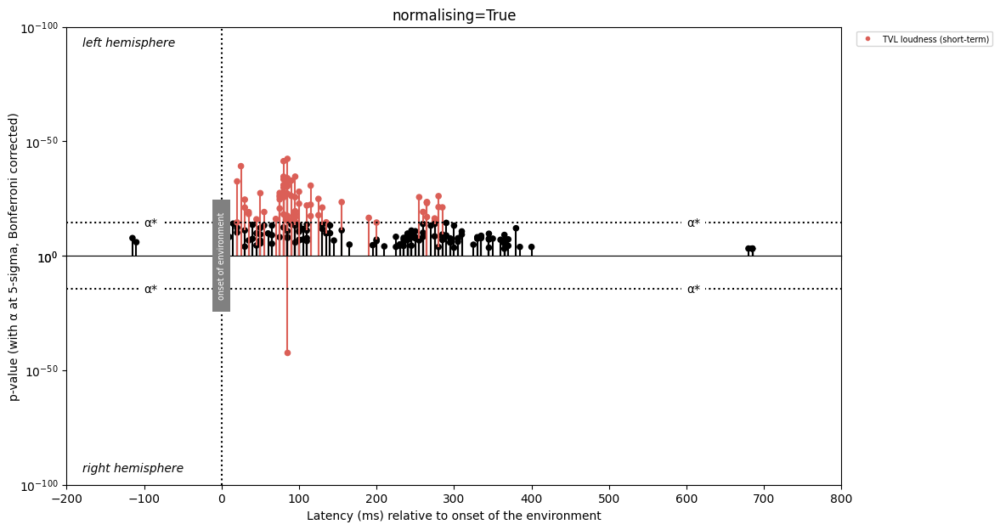

In [29]:
plot_normalised(ls_hexels, DBSCAN())

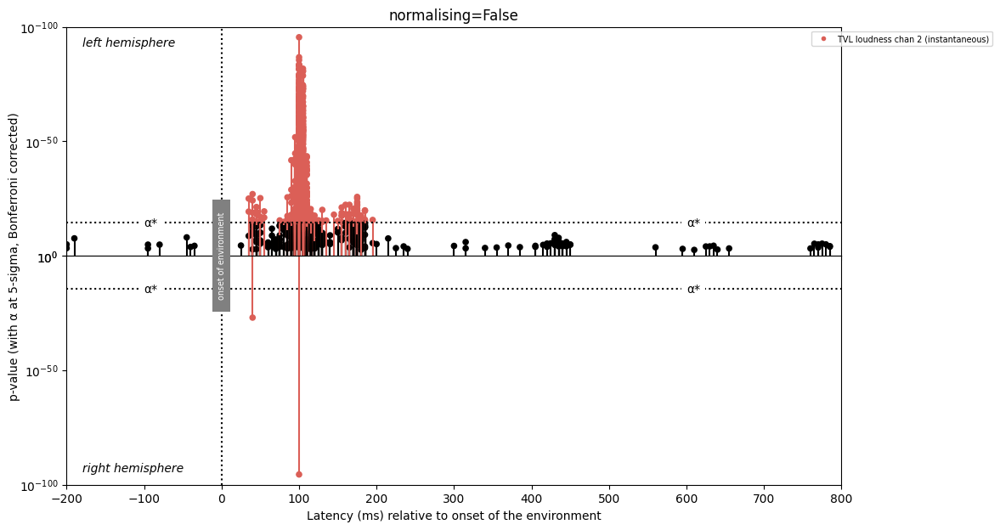

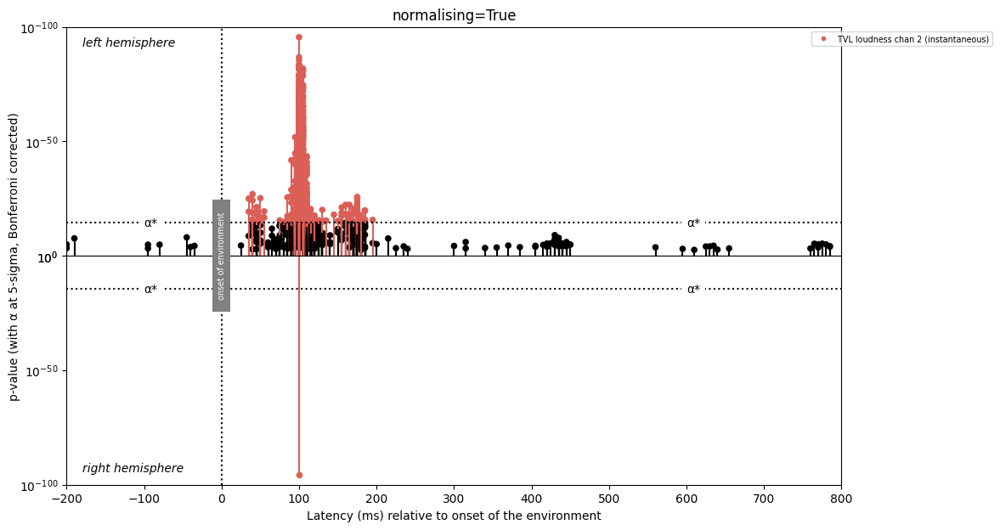

In [30]:
plot_normalised(lc2_hexels, DBSCAN())

#### Analysis of normalising

Same as GMM, normalising=True is equivalent to taking the maximum over all, which is a bit unexpected since DBSCAN uses euclidean distance and normalisation will enable it to weight each dimension/feature equally. However, upon deeper analysis, it makes sense that the time dimension should have a greater weighting than the magnitude. Once a significant match is found, it does not matter too much if the magnitude is -50 or -100. The key thing is that it is surrounded by partial matches, so time plays more of a cruical role in clustering than magnitude. 

### Min_samples and eps

DBSCAN hyperparameter selection is more nuanced than the other strategies. The most important parameters are min_samples and eps. From the paper https://www.dbs.ifi.lmu.de/Publikationen/Papers/KDD-96.final.frame.pdf, they recommend using 4 as the min_samples value. Next, they recommend plotting the sorted 4-dist graph, i.e., a graph showing the distance to the 4th nearest neighbour for each point which is sorted in decreasing order. The motivation for this is to understand the density distribution of the data. Data that is closely packed together will have a short 4-dist, so you will see a flat gradient. Hence, whereever you see a flat or close to flat gradient, it indicates a cluster. We want to set the hyperparameters so that they can identify the "thinnest" cluster, so pick the threshold where the first "flat" gradient appears. 

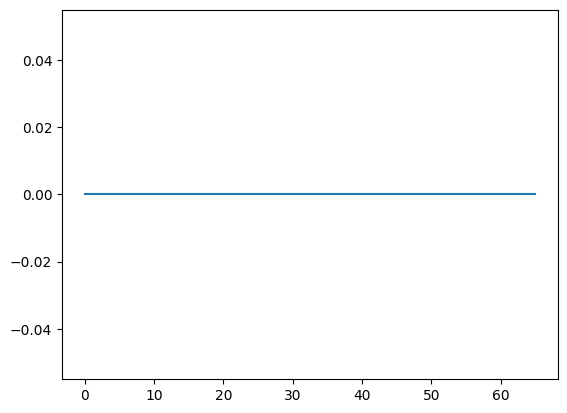

In [52]:
plot_4_dist(ls_hexels['TVL loudness (short-term)'].right_best_pairings, normalising=True)

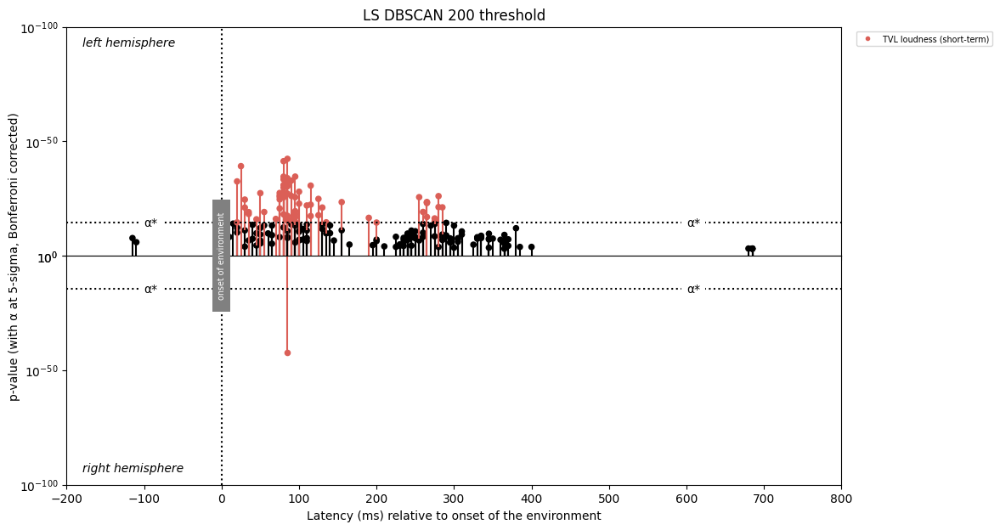

In [32]:
clusterer = DBSCAN(eps=200, min_samples=4)
denoised = clusterer.cluster(ls_hexels, 'rightHemisphere')
copy_hemisphere(denoised, ls_hexels, 'leftHemisphere', 'rightHemisphere')
stem_plot(denoised, 'LS DBSCAN 200 threshold')

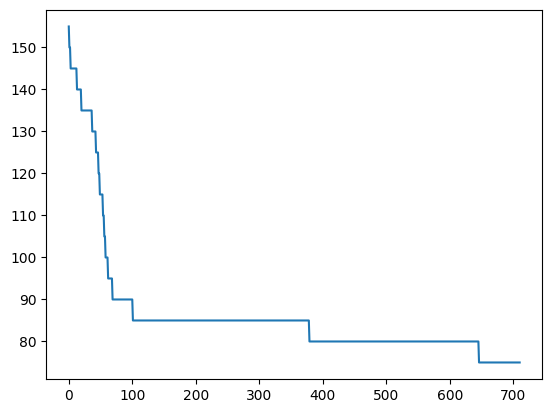

In [33]:
plot_4_dist(lc2_hexels['TVL loudness chan 2 (instantaneous)'].right_best_pairings, normalising=False)

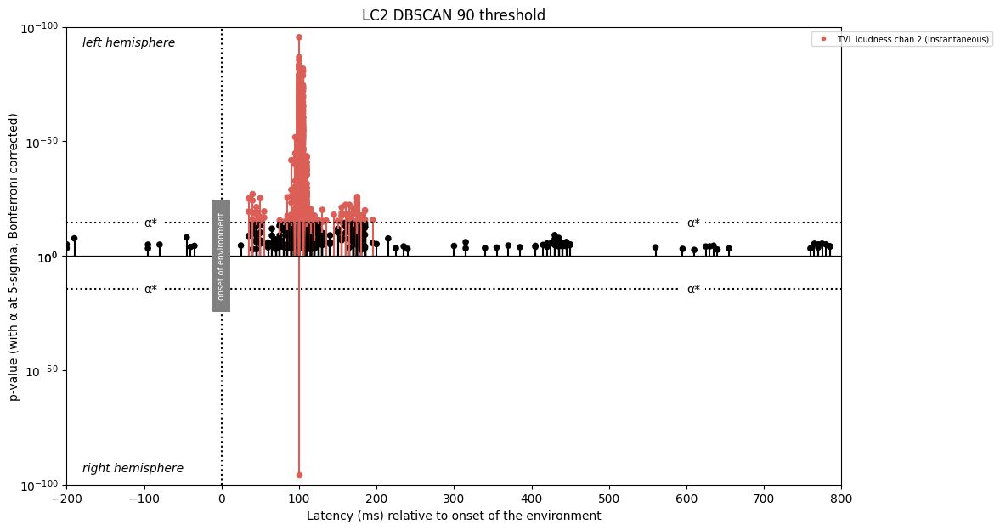

In [34]:
clusterer = DBSCAN(eps=90, min_samples=4)
denoised = clusterer.cluster(lc2_hexels, 'rightHemisphere')
copy_hemisphere(denoised, lc2_hexels, 'leftHemisphere', 'rightHemisphere')
stem_plot(denoised, 'LC2 DBSCAN 90 threshold')

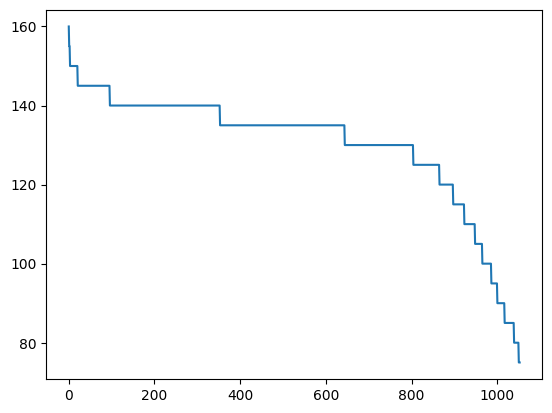

In [35]:
plot_4_dist(h_hexels['Heeger horizontal ME GP2'].right_best_pairings, normalising=False)

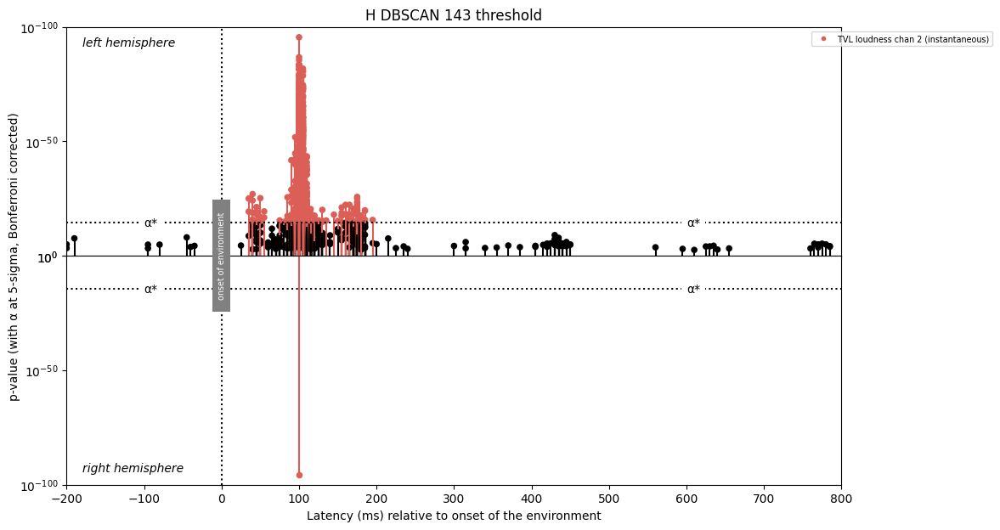

In [36]:
clusterer = DBSCAN(eps=143, min_samples=4)
denoised = clusterer.cluster(lc2_hexels, 'rightHemisphere')
copy_hemisphere(denoised, lc2_hexels, 'leftHemisphere', 'rightHemisphere')
stem_plot(denoised, 'H DBSCAN 143 threshold')

#### Analysis of using the L-joint to select parameters

It appears as though using the L-joint method is equivalent to normalising then running the clustering method. Since that is suboptimal, it is better to use epsilon = 10 and min_samples = 2 as that seems to perform relatively well in this context.

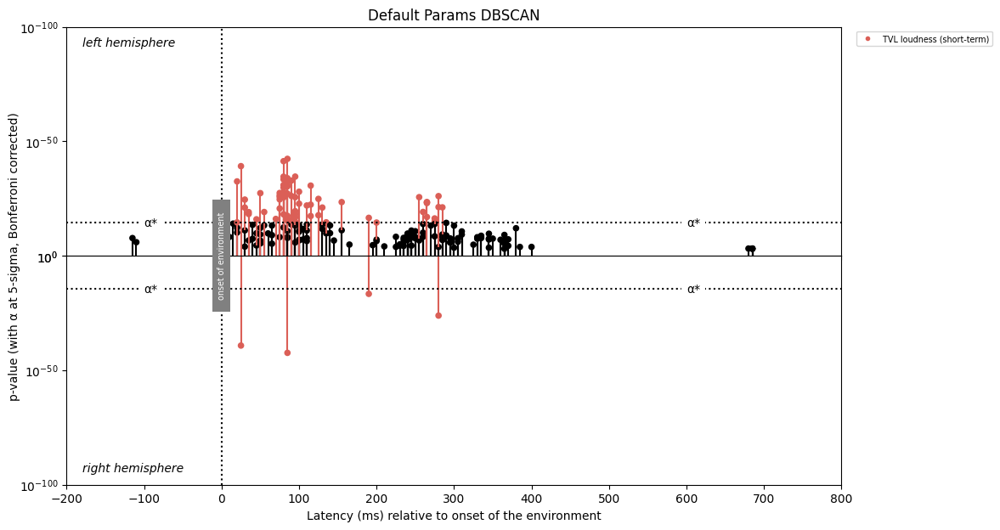

In [37]:
clusterer = DBSCAN(eps=10, min_samples=2)
denoised = clusterer.cluster(ls_hexels, 'rightHemisphere')
copy_hemisphere(denoised, ls_hexels, 'leftHemisphere', 'rightHemisphere')
stem_plot(denoised, 'Default Params DBSCAN')

## Mean Shift

### Normalise

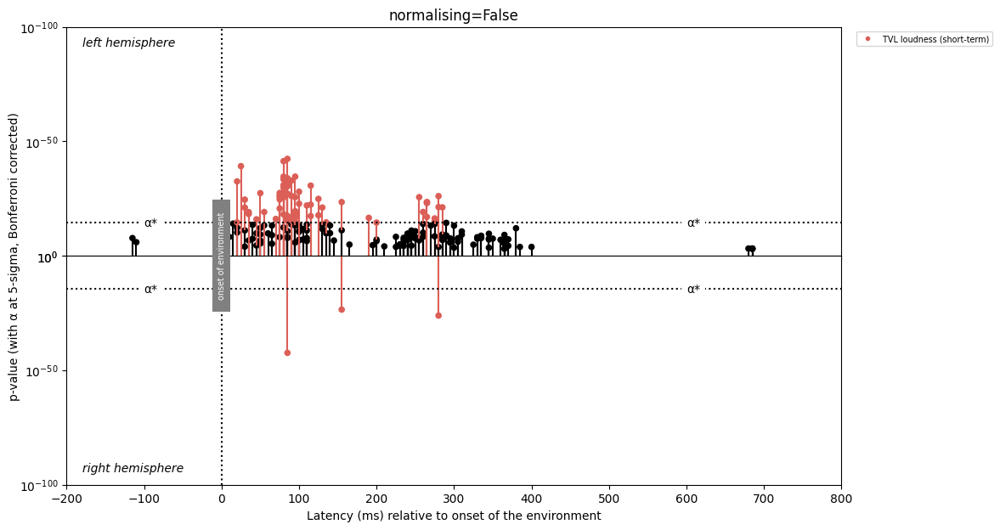

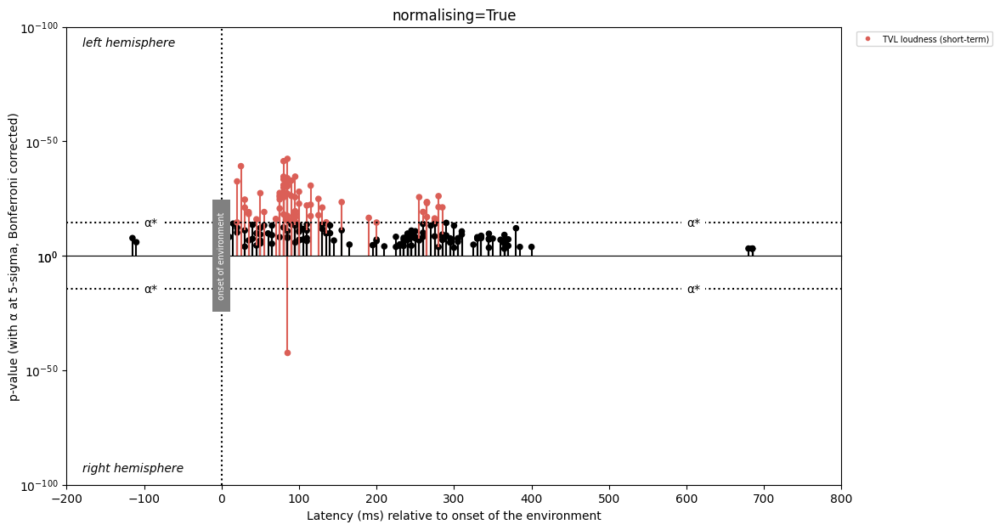

In [38]:
plot_normalised(ls_hexels, MeanShift())

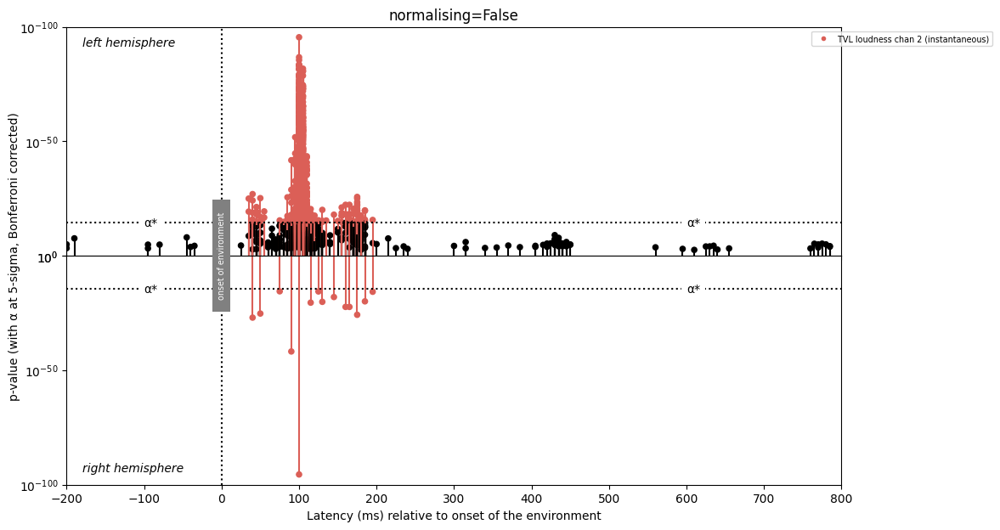

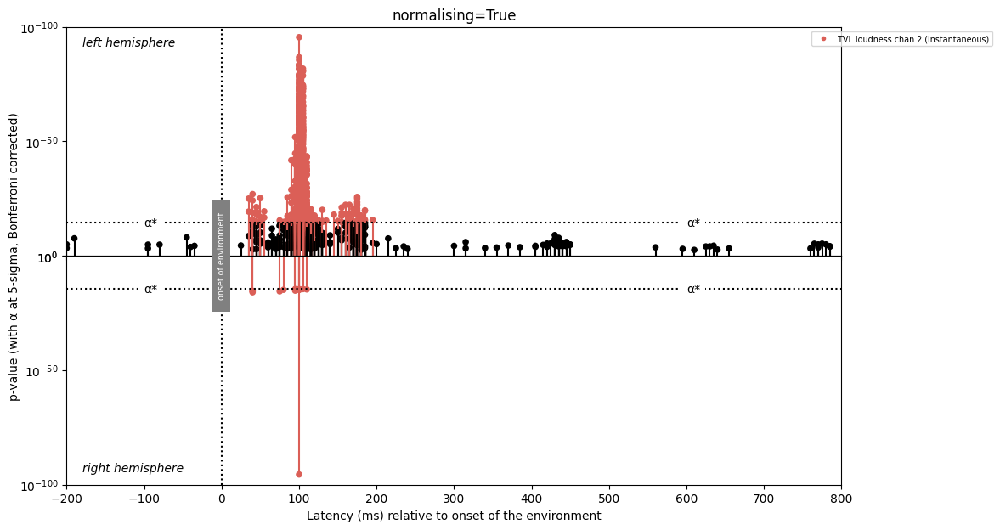

In [39]:
plot_normalised(lc2_hexels, MeanShift())

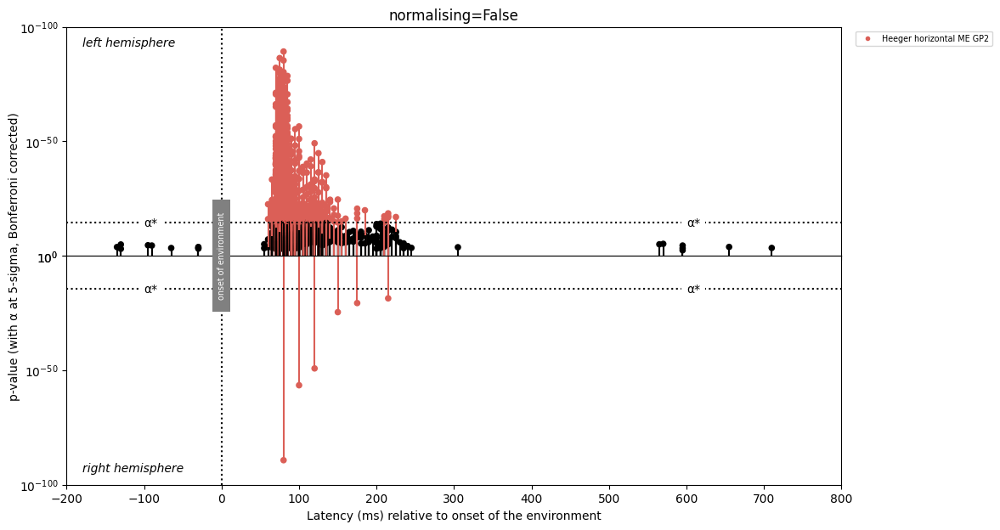

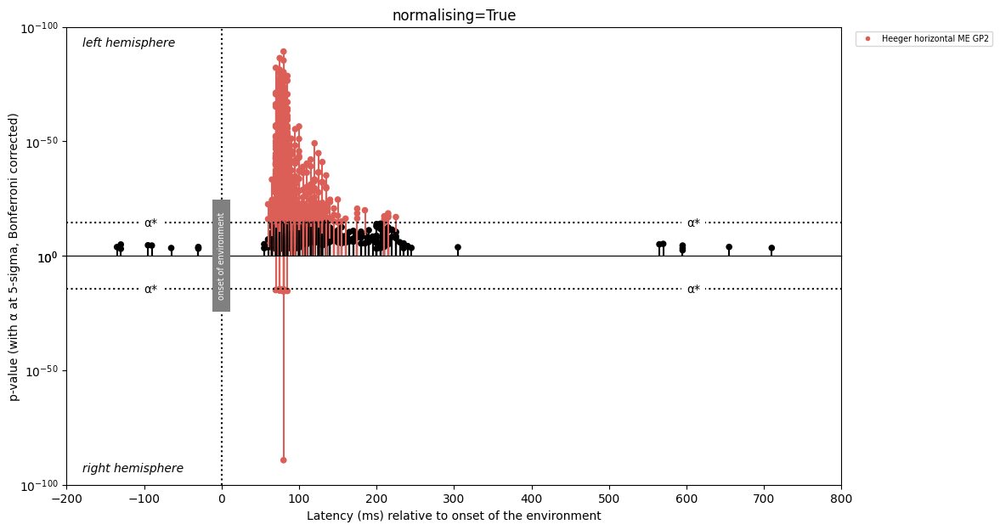

In [40]:
plot_normalised(h_hexels, MeanShift())

#### Analysis of normalising

normalising=False looks like it is the better choice for the same reasons as GMM and DBSCAN

### min_bin_freq

In [41]:
def plot_min_bin_freq(min_bin_freqs, hexels, bandwidth=None):
    for min_bin_freq in min_bin_freqs:
        temp_hexels = deepcopy(hexels)
        clusterer = MeanShift(min_bin_freq=min_bin_freq, bandwidth=bandwidth)
        plot_denoised_vs_noisy(temp_hexels, clusterer, f'min_bin_freq={min_bin_freq}')

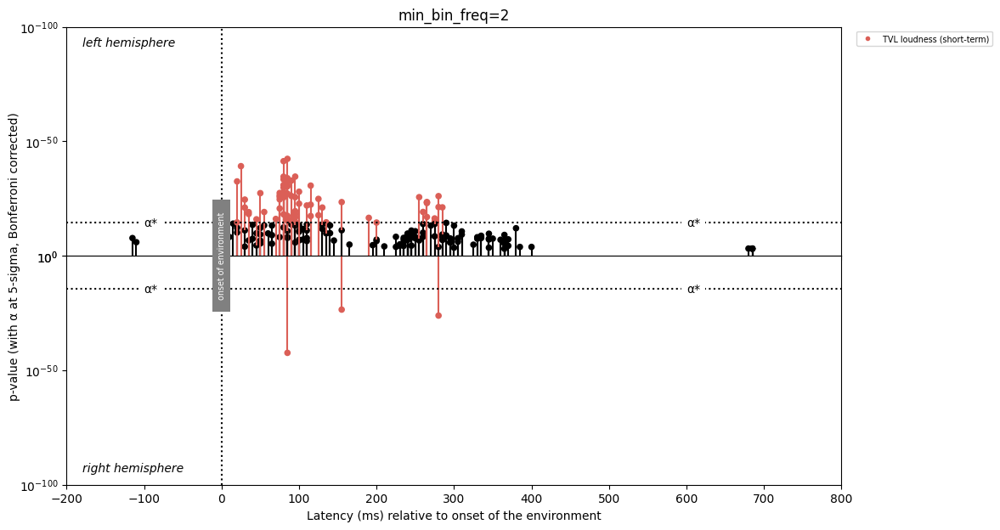

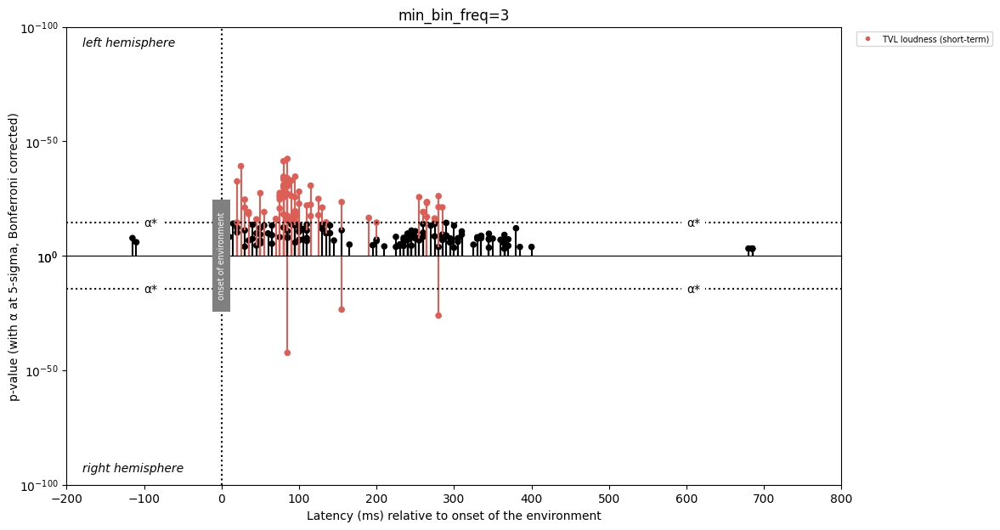

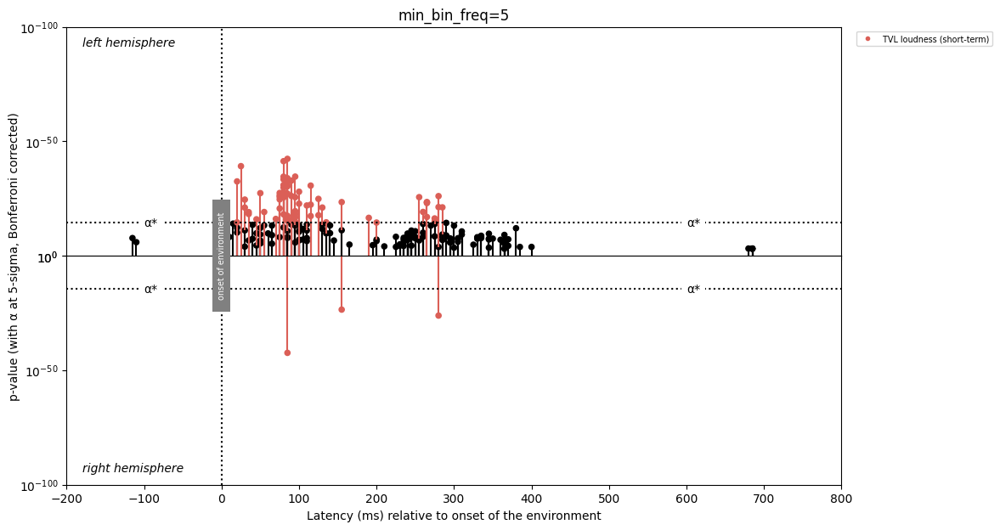

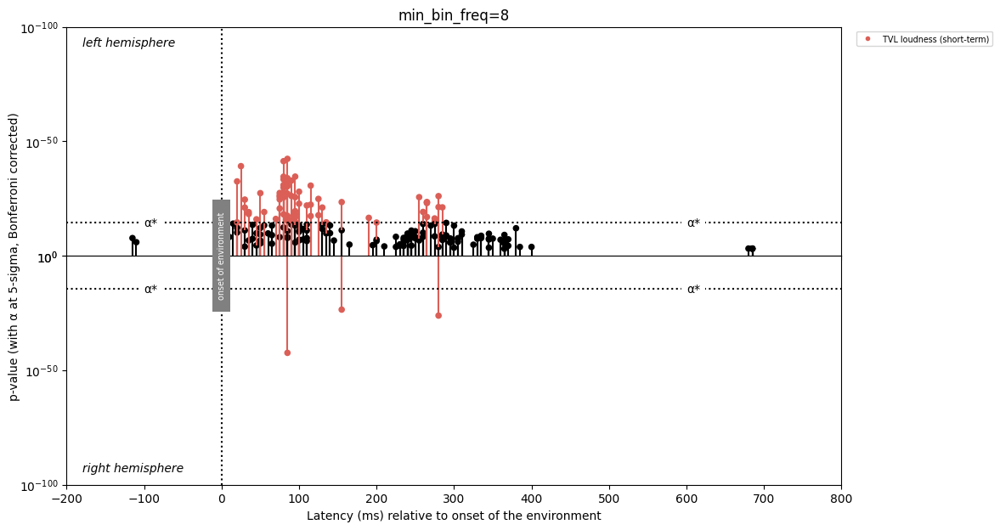

In [42]:
plot_min_bin_freq([2, 3, 5, 8], ls_hexels)

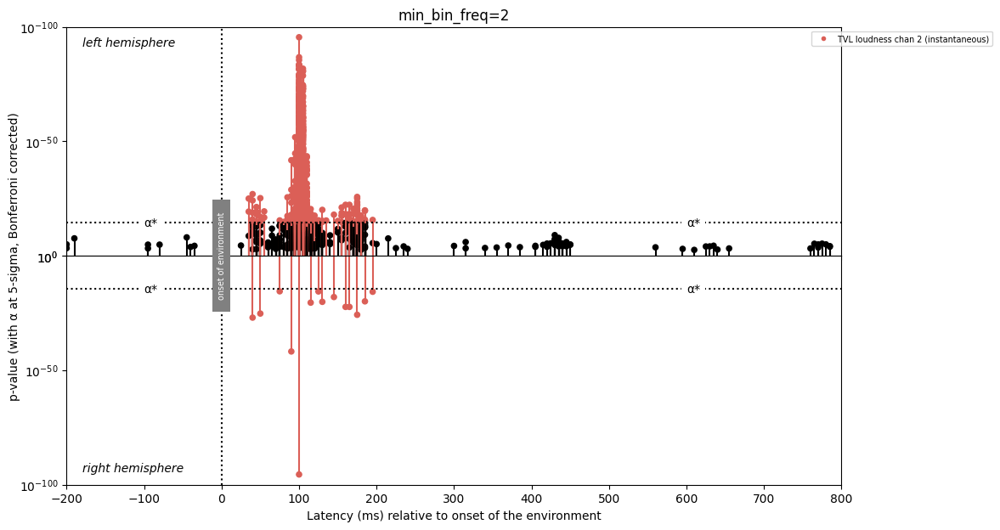

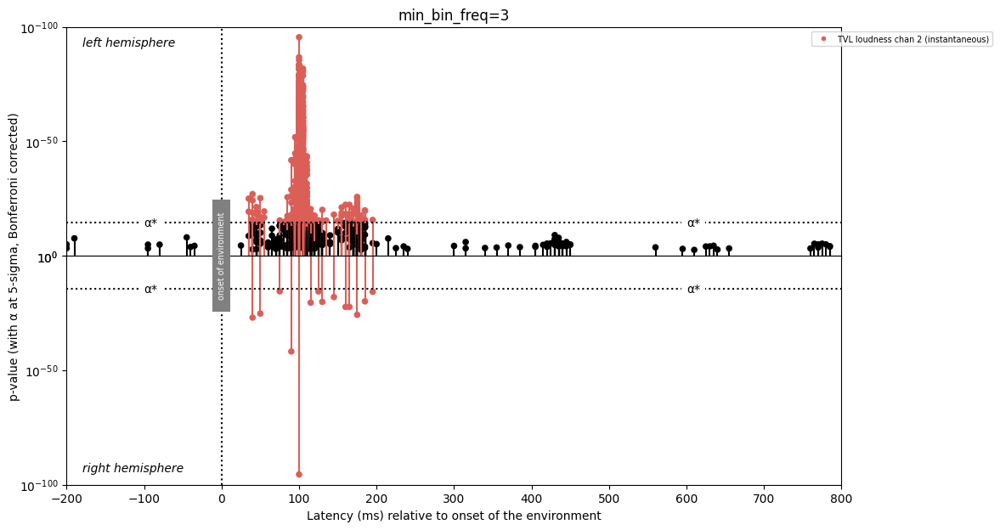

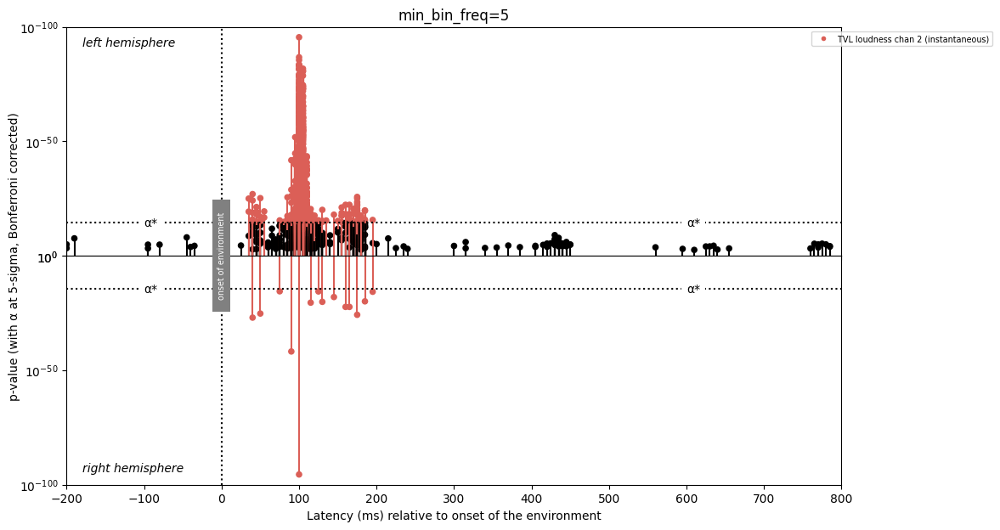

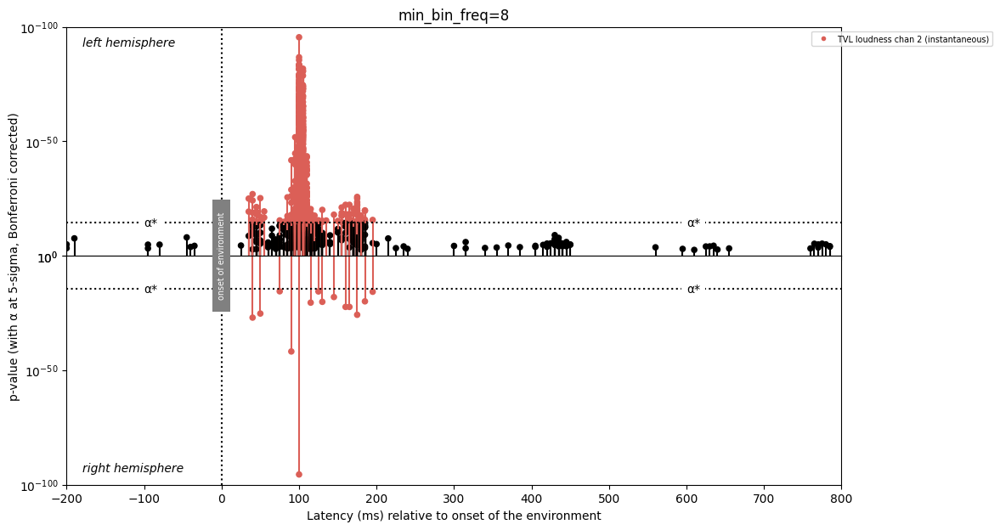

In [43]:
plot_min_bin_freq([2, 3, 5, 8], lc2_hexels)

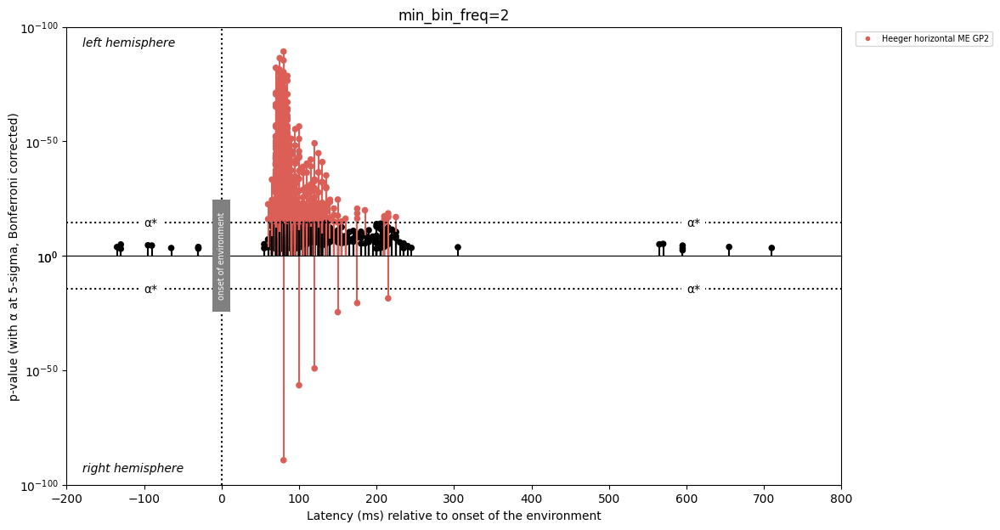

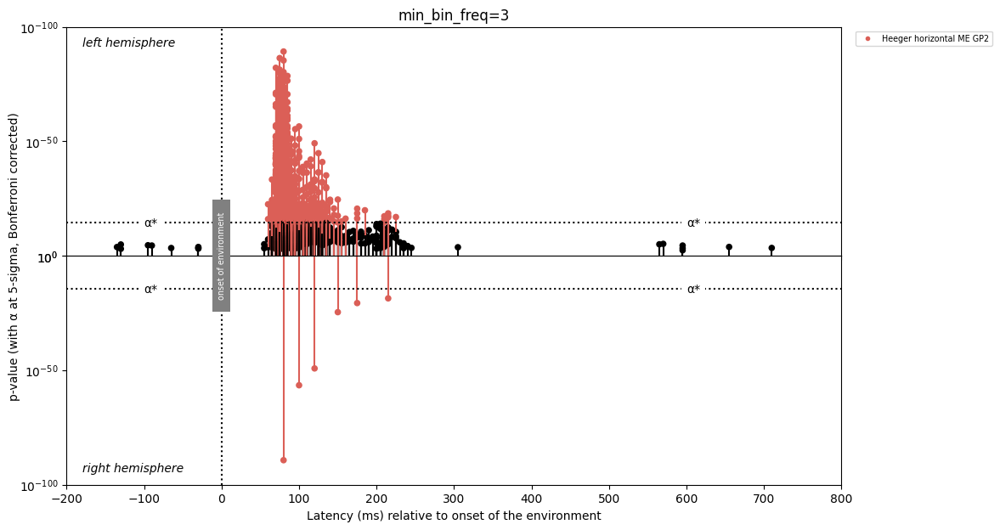

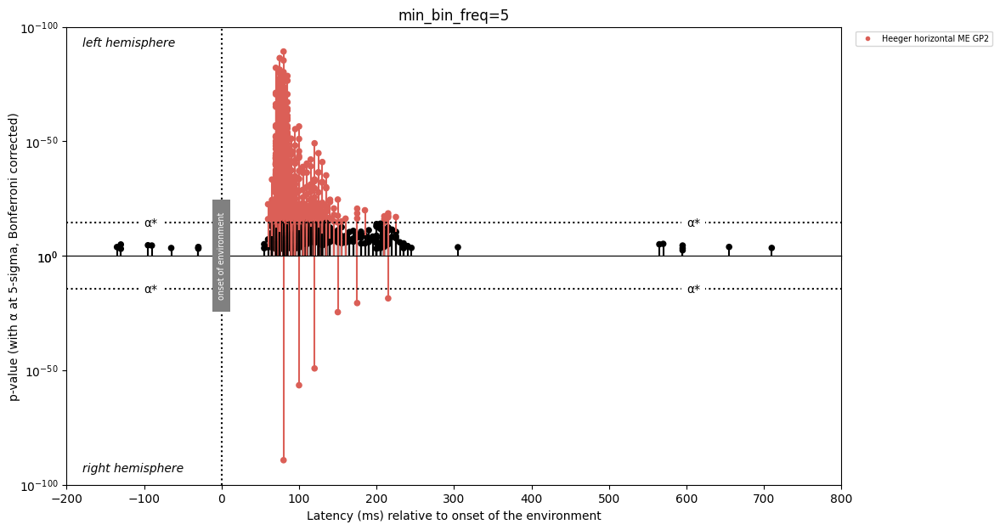

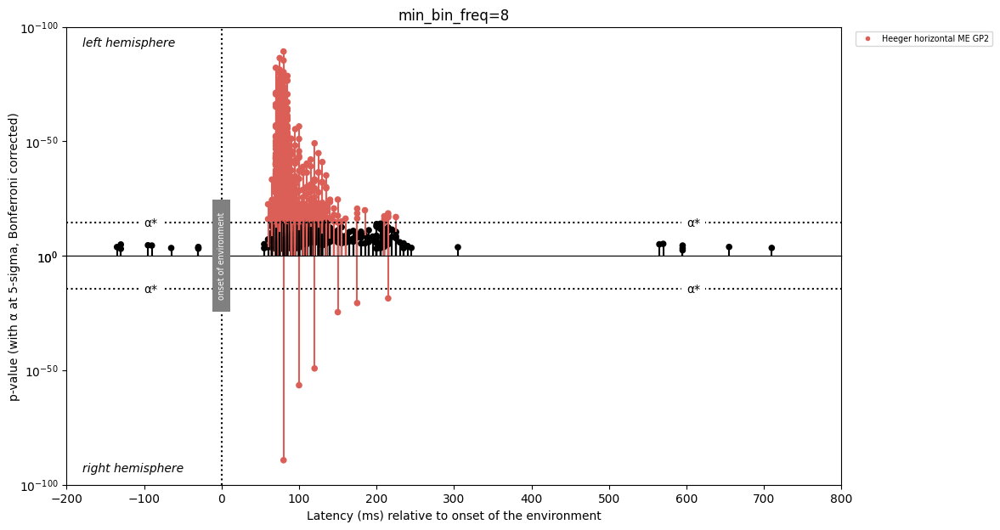

In [44]:
plot_min_bin_freq([2, 3, 5, 8], h_hexels)

#### Analysis of min_bin_freq

It appears as though min_bin_freq has no effect on the clustering algorithm. Perhaps this is due to the kernel bandwidth. We can return to experimenting with it after identifying the best bandwidth.

### Bandwidth

In [45]:
def plot_bandwidth(bandwidths, hexels):
    for bandwidth in bandwidths:
        temp_hexels = deepcopy(hexels)
        clusterer = MeanShift(bandwidth=bandwidth)
        plot_denoised_vs_noisy(temp_hexels, clusterer, f'bandwidth={bandwidth}')

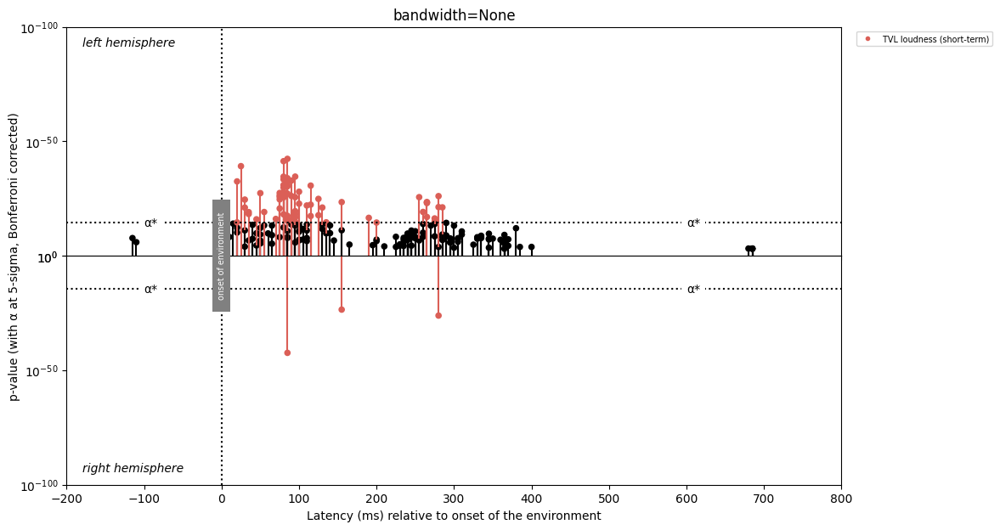

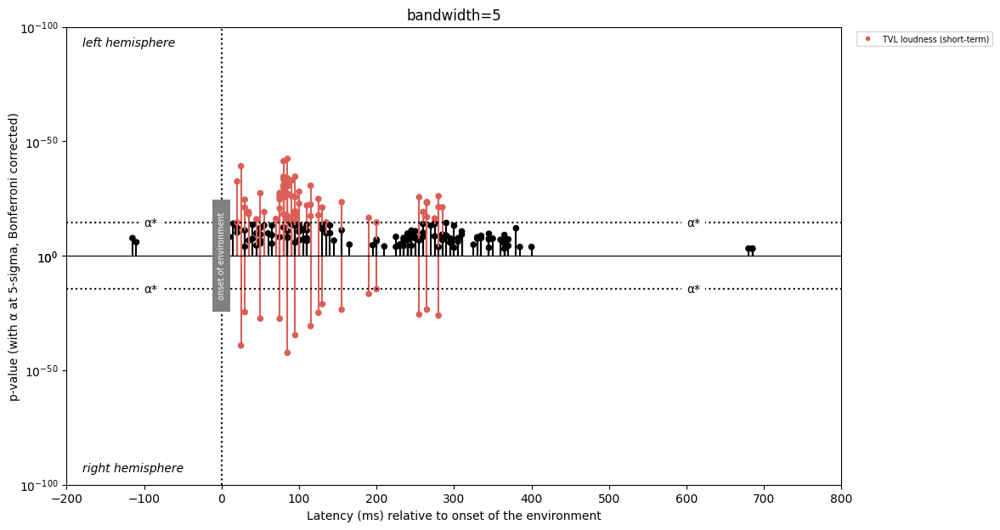

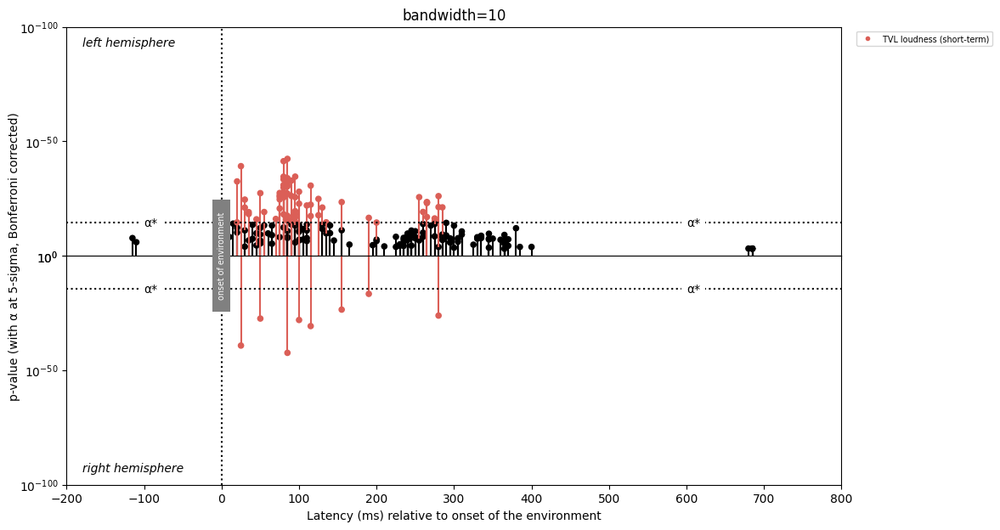

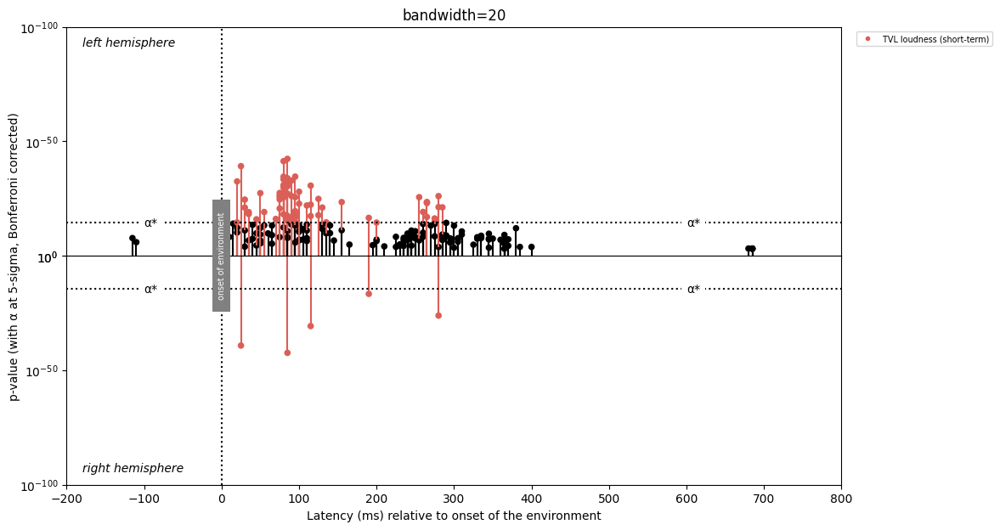

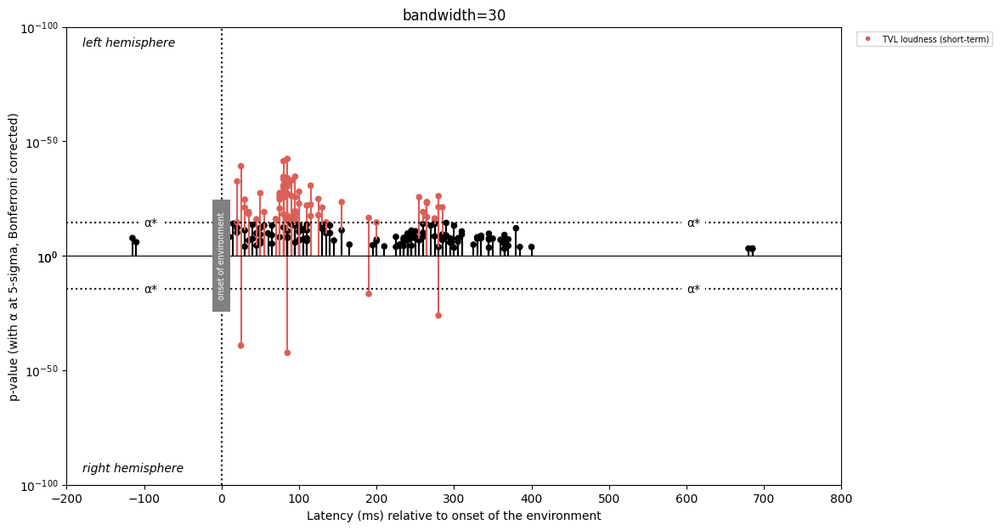

In [46]:
plot_bandwidth([None, 5, 10, 20, 30], ls_hexels)

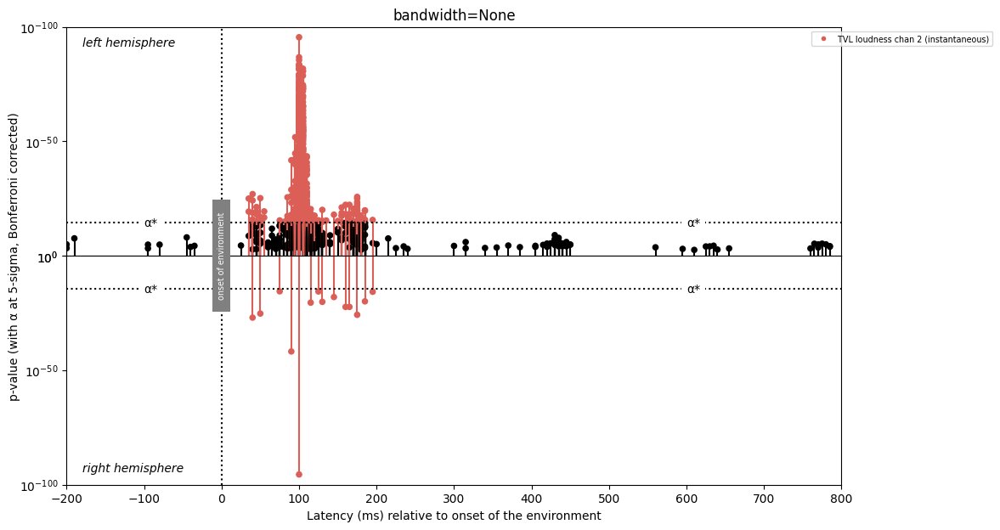

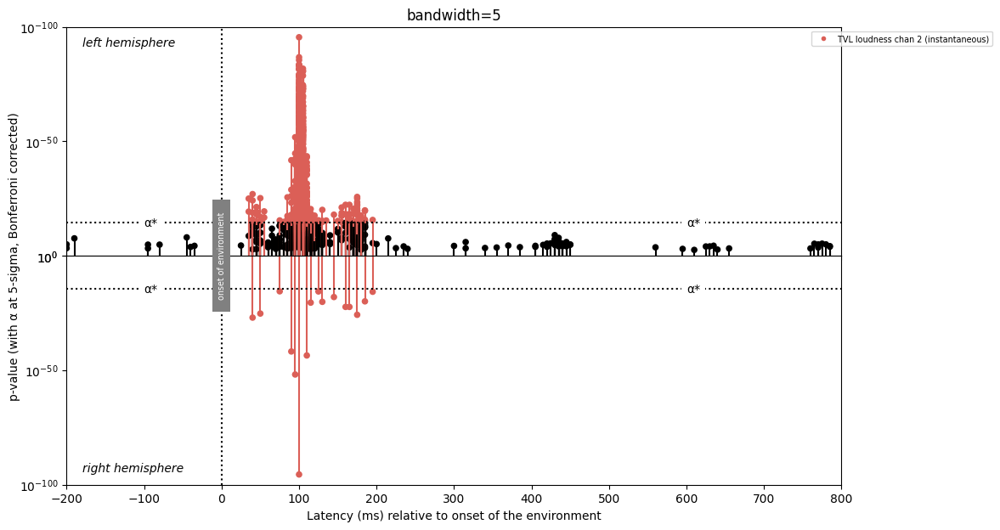

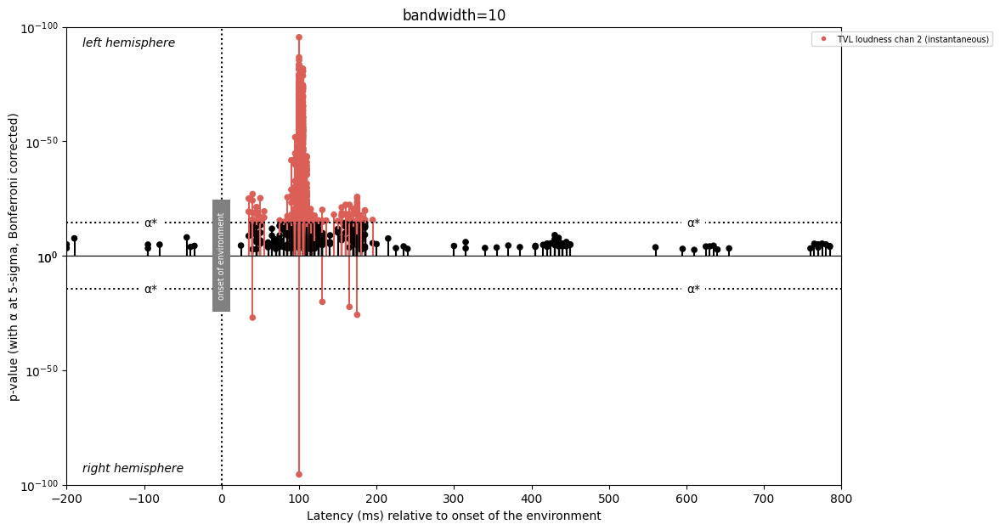

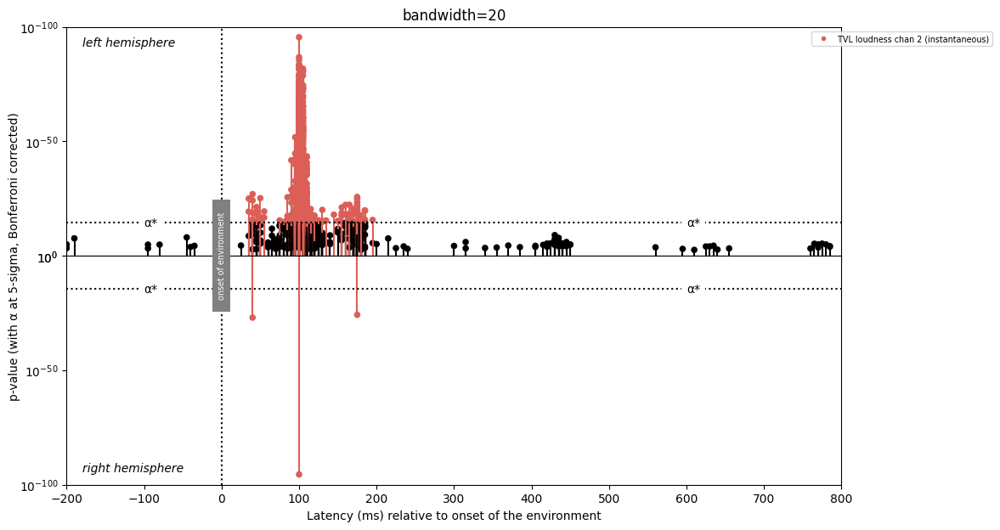

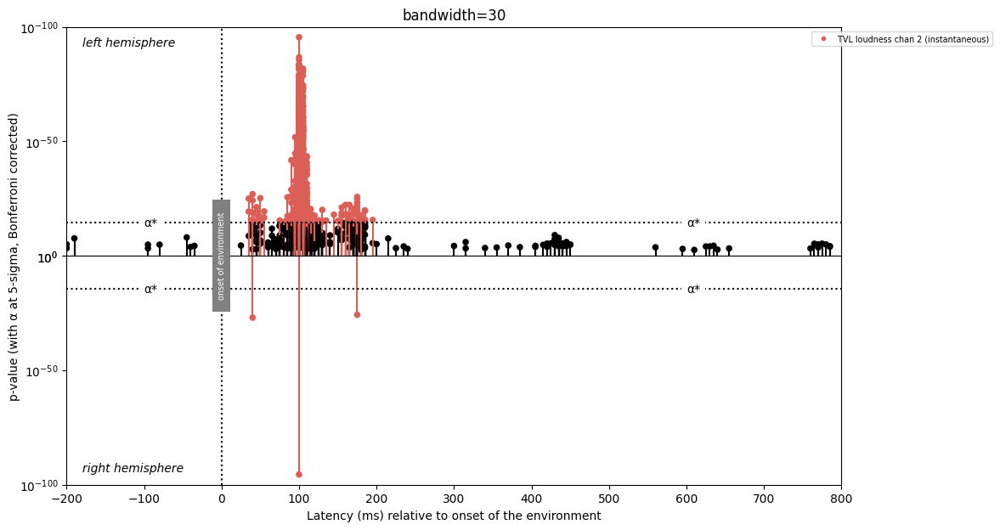

In [47]:
plot_bandwidth([None, 5, 10, 20, 30], lc2_hexels)

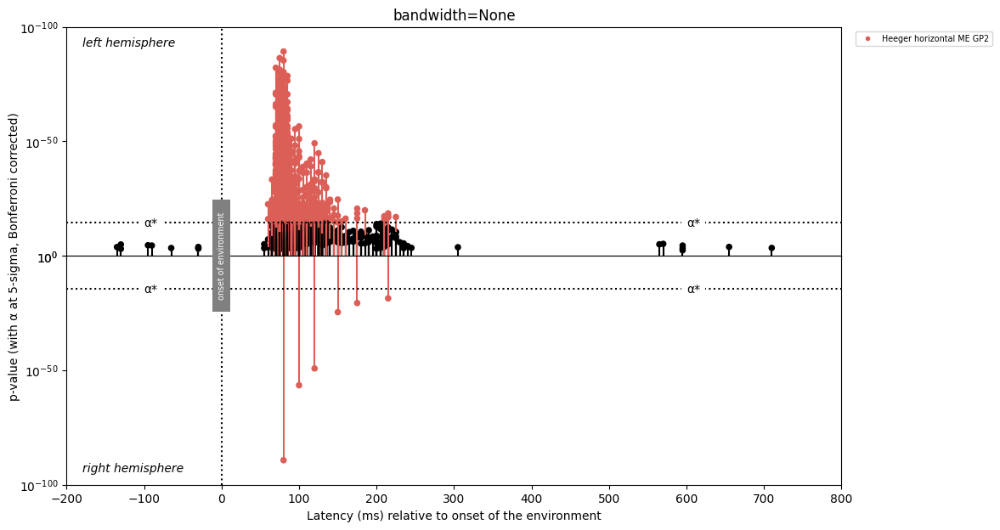

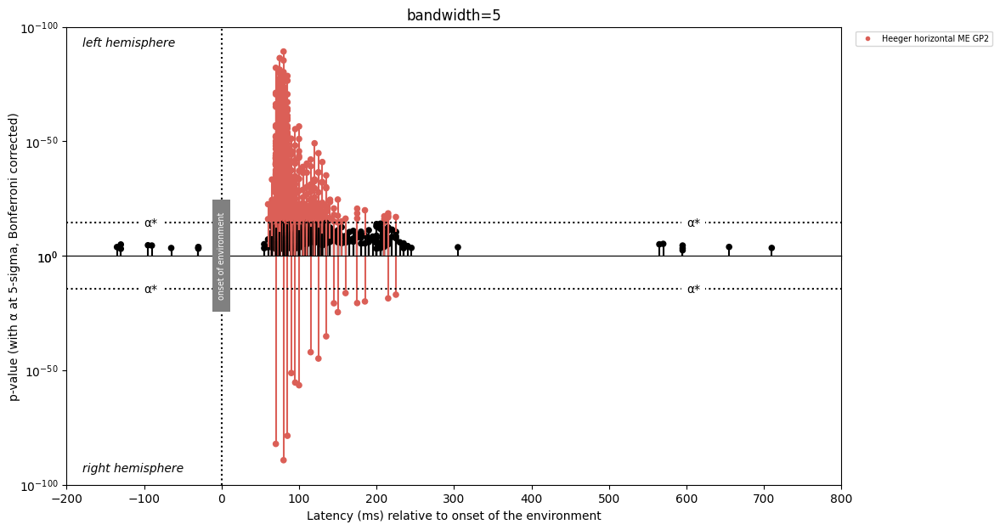

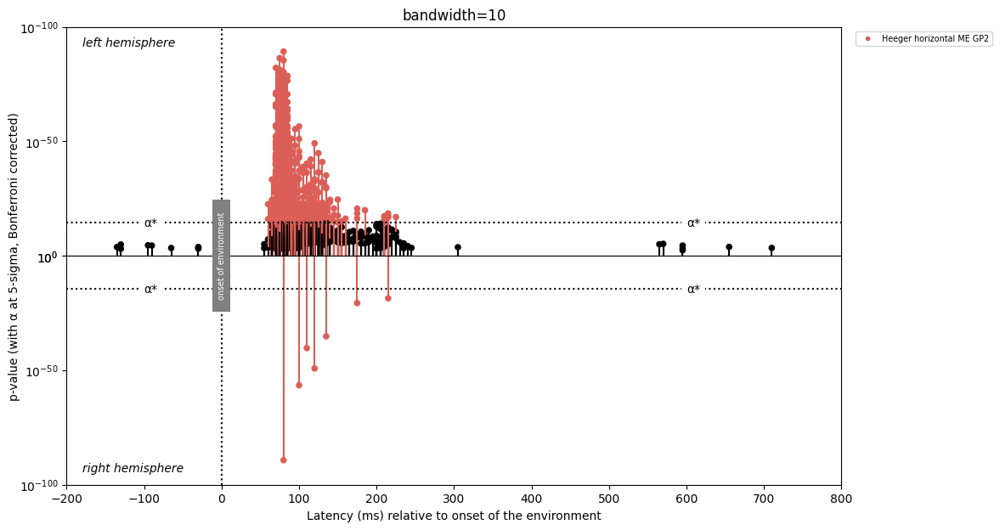

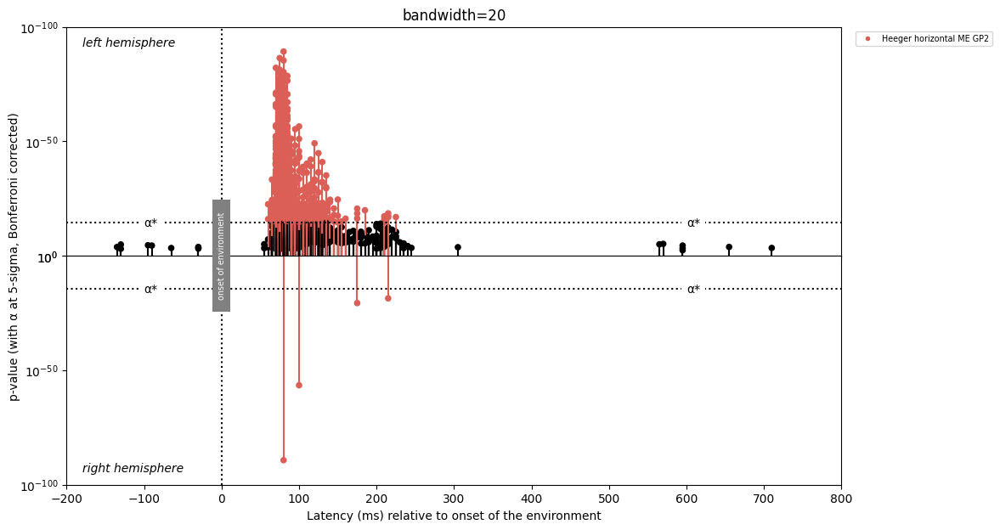

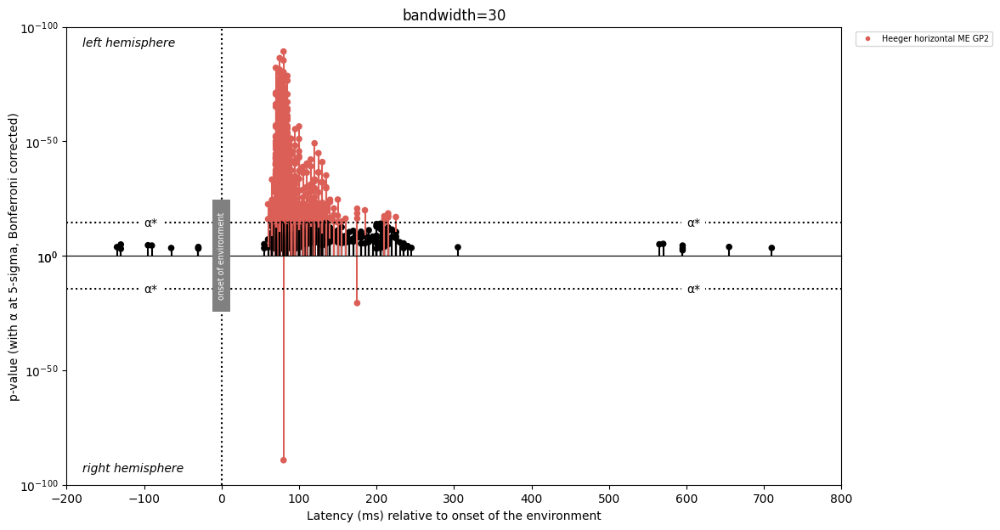

In [48]:
plot_bandwidth([None, 5, 10, 20, 30], h_hexels)

#### Analysis of bandwidth

A higher bandwidth is preferred to using sklearn.estimate_bandwidth (if bandwidth = None). Bandwidth is essentially how large the kernel radius is. Thus, increasing it increases the sizes of the delineated clusters and reduces the number of spikes. Vice versa for lower bandwidth. We want few spikes, so bandwidth = 20 or = 30 is suitable. 

Let us return to min_bin_freq with bandwidth = 30.

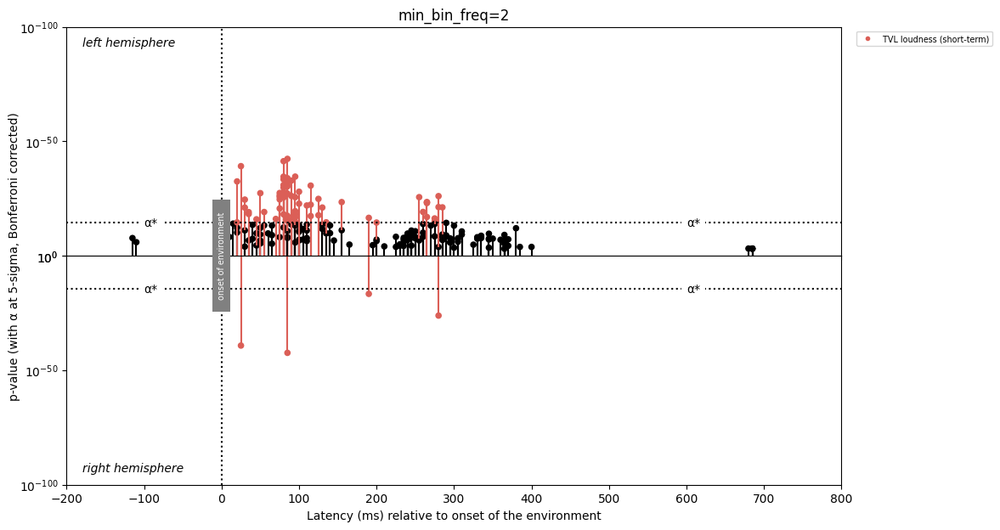

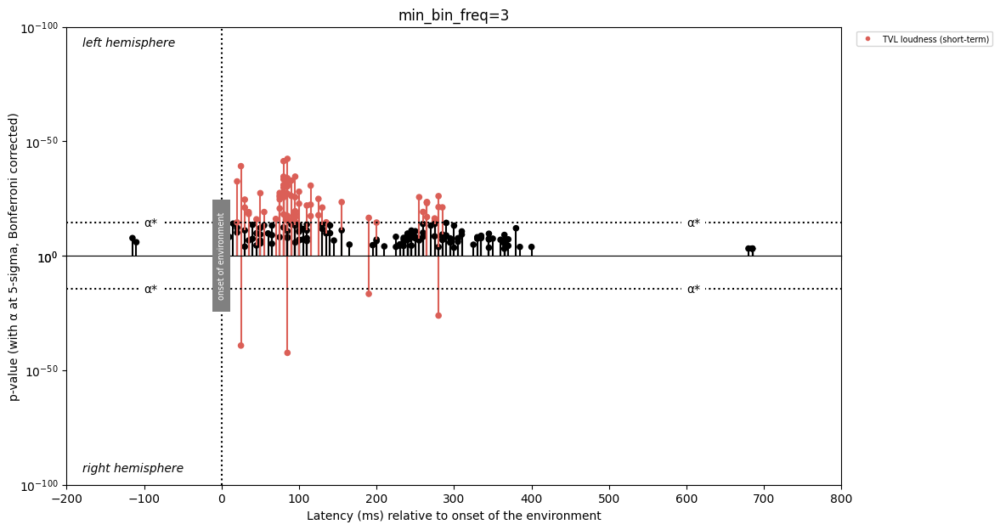

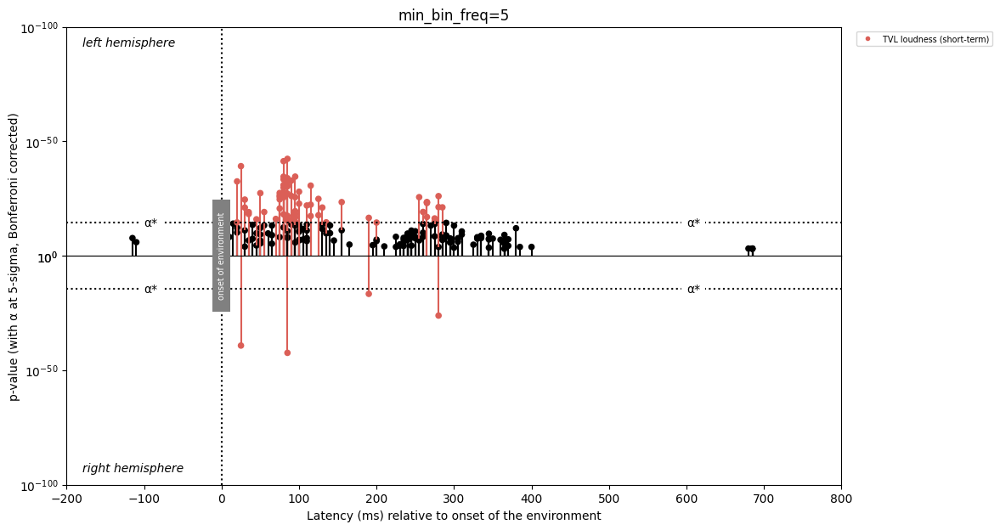

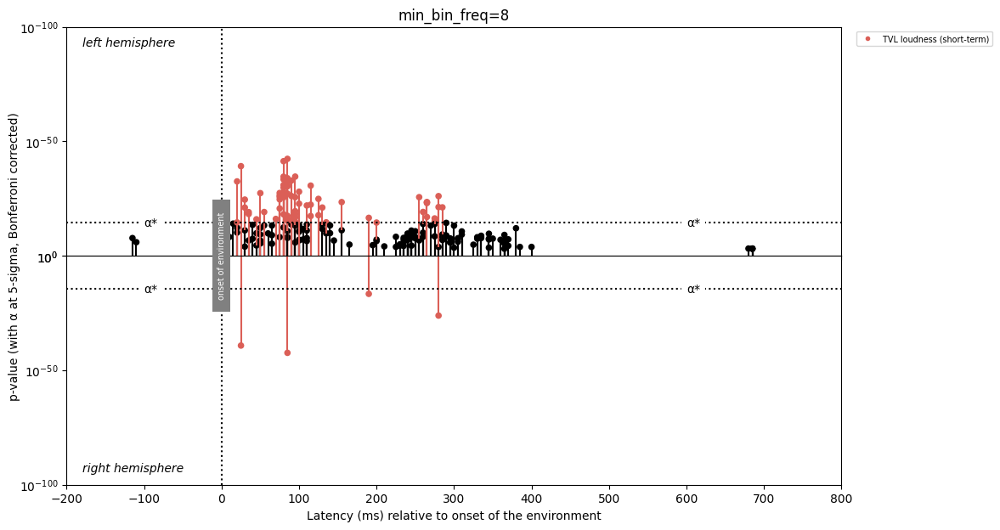

In [49]:
plot_min_bin_freq([2, 3, 5, 8], ls_hexels, 30)

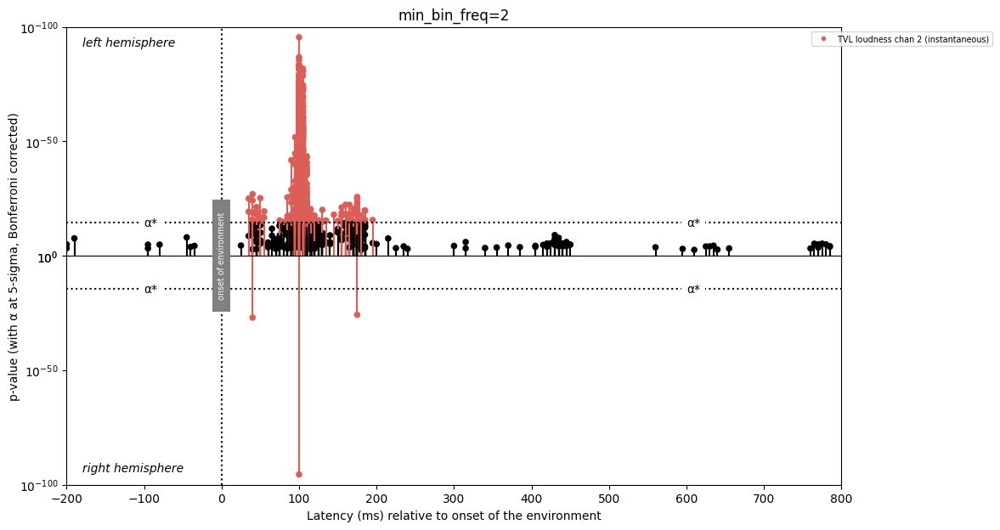

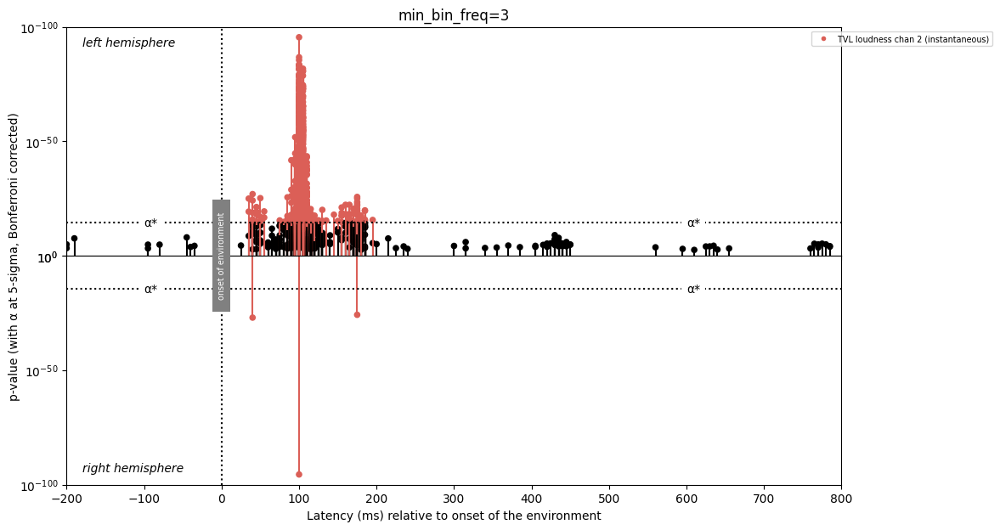

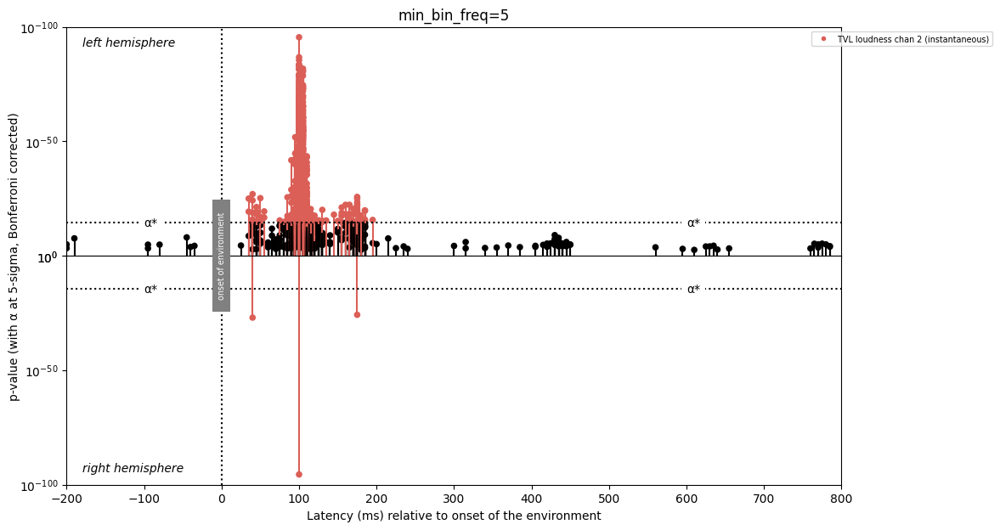

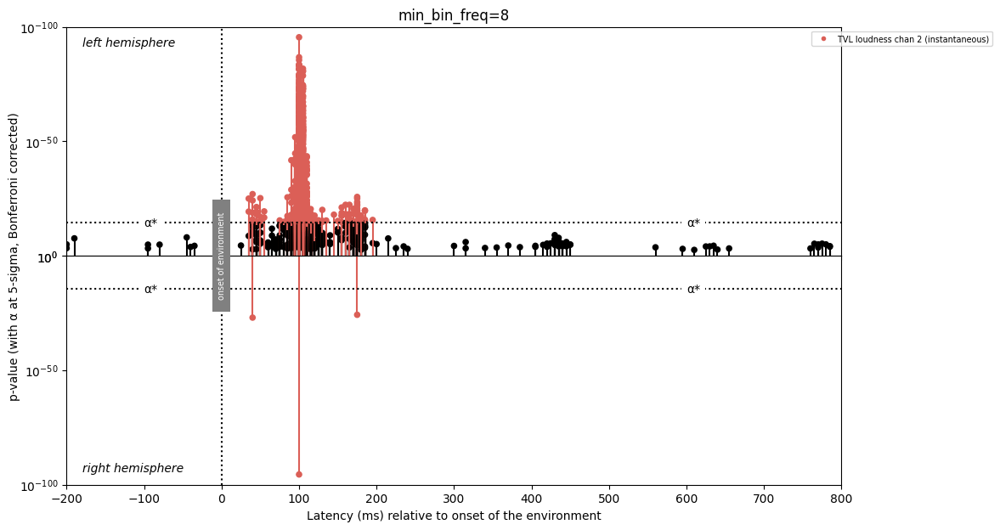

In [50]:
plot_min_bin_freq([2, 3, 5, 8], lc2_hexels, 30)

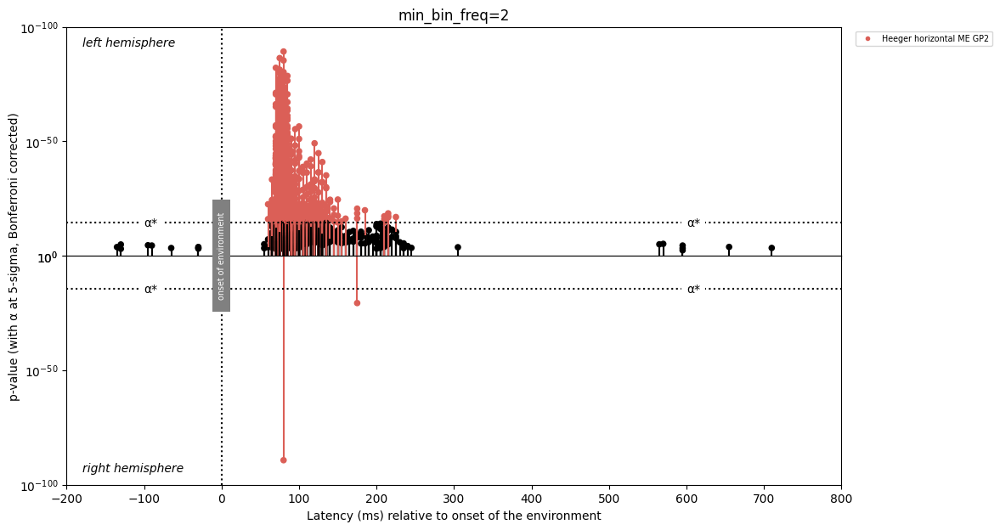

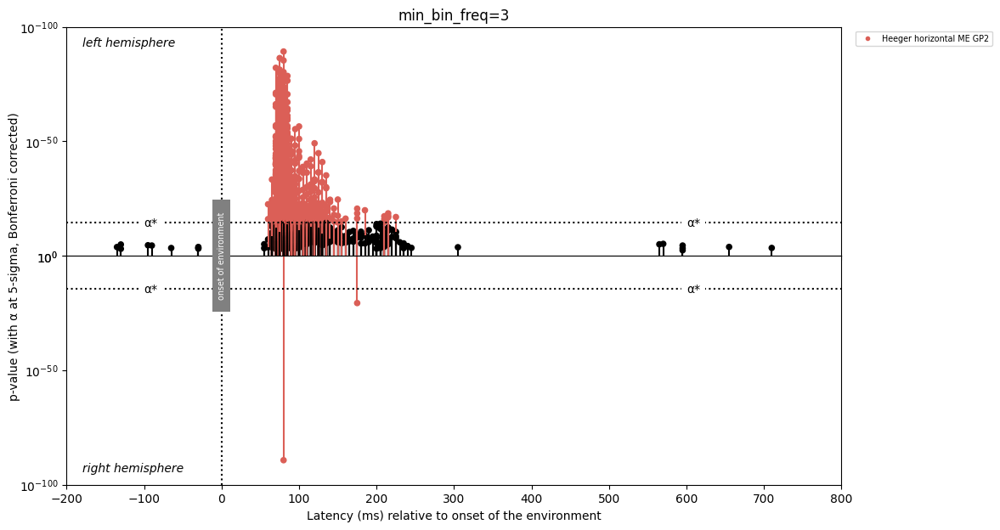

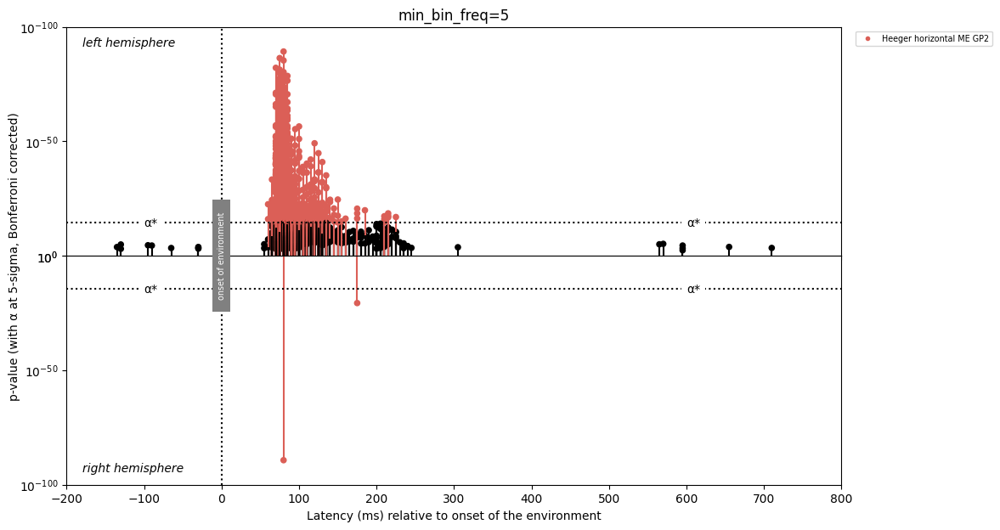

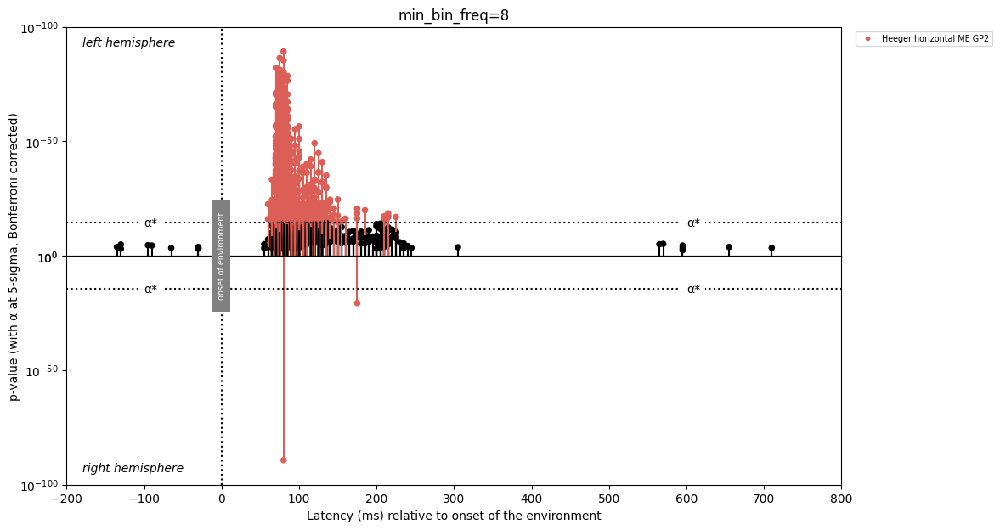

In [51]:
plot_min_bin_freq([2, 3, 5, 8], h_hexels, 30)